<a href="https://colab.research.google.com/github/Yash-11/are/blob/main/5_15_2021__are.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# INSTRUCTIONS

**Use 'ctrl+]' to collapse all** if running in Google Colab

Steps to be followed

1. Mount your drive containing data.
2. Set 'prjct_dir' and 'data_dir' arguments in argparser. 
3. Run all cells before "Final results" section.
4. Run the exp(experiment) required in "Final results" section. 

Note: Arguments except 'prjct_dir' and 'data_dir' will be set automatically according to selected exp in "Final results"
 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



# ARGPARSE

In [ ]:
import torch
import argparse
parser = argparse.ArgumentParser('ARE')

"""
Change directory path 
prjct_dir: saving weights and results 
data_dir: data 
"""
prjct_dir = '../content/drive/My Drive/Colab Notebooks/are'
data_dir = '../content/drive/My Drive/Data/are_data'

parser.add_argument('--prjct_dir', type=str, default=prjct_dir)
parser.add_argument('--data_dir', type=str, default=data_dir)

parser.add_argument('--exp', type=str, choices=['mthd__snsr', 'snsr__seq_len', 'mthd__snr', 
                                                'mthd__tr_samp', 'mthd__bn',
                                                'rndm_trials', 'mthd__snsr_with_noise'], default='mthd__snsr')
parser.add_argument('--data_type', type=str, choices=['periodic', 'transient', 'sea_temp', 'turbulence'], default='turbulence')
# non_int.parse_known_args()
parser.add_argument('--operation_mode', type=str, choices=['offline', 'online'], default='online')  
parser.add_argument('--RNN', type=str, choices=['lstm', 'rnn'], default='lstm')
parser.add_argument('--gpu', type=int, default=0)
args = parser.parse_args("")

device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

# Utils

In [ ]:
pip install cmocean

     |████████████████████████████████| 225kB 30.0MB/s 


In [ ]:
import pdb
import pandas as pd
import numpy as np
import scipy.linalg as la

import os
import os.path as osp

import torchvision
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import save_image
import torch.nn.functional as F
from torch.utils.data.dataset import Dataset
from torch.autograd import Variable

import matplotlib.pyplot as plt
import cmocean
import time
import random
from itertools import count
from itertools import chain
from skimage.transform import resize

In [ ]:
def get_path(method, string, **kwargs):
  """ 
  determine path to directory based upon string
  e.g. W=1 in kwargs return path of dir. to save weights

  :returns: path to directory
  """

  dir1 = args.data_type
  dir2 = args.exp
  dir3 = osp.join(method, args.operation_mode, args.RNN) if method == 'are' else method
  if args.exp == 'mthd__tr_samp':
     if hasattr(args, 'tr_samp'): add = 'tr_samp{}'.format(args.tr_samp)  
     else: raise Exception('number of training samples are required')

  if string == 'W':
      path = osp.join(args.prjct_dir, 'weights_results', dir1, dir2, dir3)

  elif string == 'W_AE':
      path = osp.join(args.prjct_dir, 'weights_results', dir1, dir2, method, 'autoencoder')

  elif string == 'I':
      path = osp.join(args.prjct_dir, 'weights_results', dir1, dir2, dir3)

  elif string == 'P':
      path = osp.join(args.prjct_dir, 'weights_results', dir1, dir2)

  else:
    raise ValueError('type of path not recongnized')

  path = osp.join(path, add) if args.exp == 'mthd__tr_samp' else path
  path = osp.join(path, kwargs.get('add_dir')) if kwargs.get('add_dir') else path
  if not os.path.exists(path):
      os.makedirs(path)

  return path

def get_name(method, string, **kwargs):
  """ 
  determine name of file 
  e.g. W=1 in kwargs return name of file of autoencoder weights

  :returns: path to directory
  """

  if string == 'W':

    sensor_number = kwargs.get('sensor_number')
    seq_len = kwargs.get('seq_len')
    bottle_neck = kwargs.get('bottle_neck')

    if method == 'are':
      return 'weights_s{}_sq{}_bn{}'.format(sensor_number, seq_len, bottle_neck) 

    elif method == 'pds':
      return 'weights_s{}_bn{}'.format(sensor_number, bottle_neck)

    elif method == 'sd':
      if kwargs.get('drop'):
        return 'weights_s{}_drop'.format(sensor_number)
      else:
        return 'weights_s{}'.format(sensor_number)

  elif string == 'W_AE':

    bn = kwargs.get('bottle_neck')
    dropout = kwargs.get('drop')
    
    if dropout:
      return 'weights_bn{}_drop{}'.format(bn, dropout)
    else:
      return 'weights_bn{}'.format(bn)

In [ ]:
def get_data():
  """ 
  load data from data_dir
  data is strored in args.raw_data
  """
  path_data = args.data_dir

  if hasattr(args, 'raw_data') and hasattr(args, 'last_data_type') and args.data_type == args.last_data_type:

    print('using previously loaded data')

  else:

    start_time = time.time()
    if args.data_type == 'transient':
      print('loading transient flow past cylinder data...')
      td180 = np.load(osp.join(path_data, 'data180.npy'))
      td190 = np.load(osp.join(path_data, 'data190.npy'))
      td200 = np.load(osp.join(path_data, 'data200.npy'))
      td185 = np.load(osp.join(path_data, 'data185.npy'))
      td195 = np.load(osp.join(path_data, 'data195.npy'))
      args.raw_data = (td180, td190, td200, td185, td195)
      print('data loaded')

    elif args.data_type == 'periodic':
      args.raw_data = np.load(osp.join(path_data, 'data190+.npy'))
      print('data loaded')

    elif args.data_type == 'turbulence':
      args.raw_data = np.load(osp.join(path_data, 'tb_128_5000.npy'))
      print('data loaded')
    
    elif args.data_type == 'sea_temp':
      land_sea = np.load(osp.join(path_data, 'SSTdata1990.npz'))['arr_0']

      t = land_sea[0]
      n_pixel = len(t)
      len_data = len(land_sea[:, 0])
      land_pos = np.where(t > 1e+30)[0] 

      full_idx = np.arange(n_pixel)
      args.sea_idx = np.delete(full_idx, land_pos)
      args.raw_data = np.delete(land_sea, [land_pos], 1)
      print('data loaded')

    else:
      print('data_type is not recognised')

    print("--- %s seconds --" % (time.time() - start_time))  
    args.last_data_type = args.data_type


In [ ]:
def mn(**kwargs):
  """ returns data image dimentions """

  if args.data_type == 'periodic':
    m, n = 251, 168
  if args.data_type == 'transient':
    m, n = 502, 252
  if args.data_type == 'turbulence':
    m, n = 128, 128
  if args.data_type == 'sea_temp':
    m, n = 360, 180
  
  return m,n


def sensor_cord_data(sensor_num):
  """ sensor pixel co-ordinates for all data_types
  :returns: numpy array of shape (no_sensors, 2) with integer values
  """
  m, n = mn()

  if args.data_type == 'periodic':

    theata = np.linspace(0, 2*np.pi, 300)
    x_cord = np.round(25 * np.cos(theata)) + 0
    y_cord = np.round(25 * np.sin(theata)) + n/2
    cords_ = np.vstack((x_cord,y_cord)).T
    cords_ = np.unique(cords_, axis=0)
    idx = cords_[:,0] > 0
    cords_ = cords_[idx,:]
    np.random.seed(3265)  # changing seed will change the postion of sensors and networks will have to be retrained
    idx = np.random.choice(range(cords_.shape[0]), sensor_num, False)
    cords = np.int64(cords_[idx,:])

    mask = np.zeros((m,n))
    mask[cords[:,0], cords[:,1]] = 1
    s_idx_in_flatten = np.where(mask.reshape(-1) == 1)
    s_idx_in_flatten = np.asarray(s_idx_in_flatten).ravel()

  elif args.data_type == 'transient':

    theata = np.linspace(0, 2*np.pi, 300)
    x_cord = np.round(24 * np.cos(theata)) + 0
    y_cord = np.round(24 * np.sin(theata)) + n/2
    cords_ = np.vstack((x_cord,y_cord)).T
    cords_ = np.unique(cords_, axis=0)
    idx = cords_[:,0] > 0
    cords_ = cords_[idx,:]
    np.random.seed(323)  # changing seed will change the postion of sensors and networks will have to be retrained
    idx = np.random.choice(range(cords_.shape[0]), sensor_num, False)
    cords = np.int64(cords_[idx,:])

    mask = np.zeros((m,n))
    mask[cords[:,0], cords[:,1]] = 1
    s_idx_in_flatten = np.where(mask.reshape(-1) == 1)
    s_idx_in_flatten = np.asarray(s_idx_in_flatten).ravel()

  elif args.data_type == 'turbulence':

    # x = np.tile(np.arange(0, 32), 32)[:, np.newaxis]
    # y = np.repeat(np.arange(0, 32), 32, axis=0)[:, np.newaxis]
    # cords = np.concatenate((x, y), axis=1)*4 + 2

    # mask = np.zeros((m,n))
    # mask[cords[:,0], cords[:,1]] = 1
    # s_idx_in_flatten = np.where(mask.reshape(-1) == 1)
    # s_idx_in_flatten = np.asarray(s_idx_in_flatten).ravel()
    # plt.scatter(cord[:,0], cord[:, 1])
    s_idx_in_flatten = cords = None

  elif args.data_type == 'sea_temp': 

    idices = np.arange(0, 44219)
    np.random.seed(73)  #323 21 23 changing seed will change the postion of sensors and networks will have to be retrained
    s_idx_in_flatten = np.random.choice(idices, sensor_num, False)

    flat_sea_mask = np.zeros((44219))
    flat_sea_mask[s_idx_in_flatten] = 1
    flat_mask = np.zeros((m*n))
    for i, j in zip(args.sea_idx, count(0, 1)):
      flat_mask[i] = flat_sea_mask[j]

    mask = flat_mask.reshape(n, m)
    cords = np.where(mask == 1)
    cords = np.asarray(cords)

    # plt.figure()
    # plt.scatter(cords[1], cords[0])
    # plt.show()
  
  return s_idx_in_flatten, cords

In [ ]:
def image_select(method, i, images, s, plot, save, **kwargs):

  seq_len = kwargs.get('seq_len')
  if method == 'are':
    seq_impct = (kwargs.get('seq_len')-1)//2 
    add1 = '_sq{}_i{}'.format(seq_len, i+seq_impct, args.RNN)  
  else:
    seq_impct = 0
    add1 =  ''
  add2 = '_SNR{}'.format(kwargs.get('SNR', '')) if args.exp == 'mthd__snr' else ''
  name = ('im_{}_{}_{}_s{}'.format(args.data_type, args.exp, method, s) + add1 + add2, 
          'im_true_{}_{}_{}_s{}'.format(args.data_type, args.exp, method, s) + add1 + add2)
        
  SNR = kwargs.get('SNR')
  if s in kwargs.get('plot_s_list', [None]):
    if seq_len in kwargs.get('plot_seq_len_list', [None]):
      if SNR in kwargs.get('plot_SNR', [None]):
        if i in kwargs.get('plot_image_idx', [None])-seq_impct:
          show_save_image(method,
                          images,
                          plot,
                          save, 
                          name=name,
                          i=i,
                          **kwargs)


def show_save_image(method, images, plot, save, **kwargs):

  istupl = True if isinstance(images, tuple) else False

  len_tuple = len(images) if istupl else 1
  get_value = lambda index, tuple_ : tuple_[index] if istupl else tuple_
  i = kwargs.get('i', 0)
  stats = kwargs.get('stats', np.array([0]))

  if istupl:
    assert len_tuple == len(save) == len(plot)
    if any(save):
      assert len(kwargs.get('name')) == len_tuple, 'mention all names of images for saving'
  else:
    if save: assert kwargs.get('name') 

  for idx in range(len_tuple):
      
    save_ = get_value(idx, save)
    plot_ = get_value(idx, plot)
    name = get_value(idx, kwargs.get('name', ['im']*len_tuple))

    cords = kwargs.get('cords', np.array([0]))

    t = get_value(idx, images)
    t = t.cpu().data.numpy() if torch.is_tensor(t) else t
    if t.ndim == 1:
      t = t
    elif t.ndim == 2:
      t = t[-1]
    elif t.ndim == 3:
      t = t[-1, -1]
    t = t * stats[1, :] + stats[0, :] if stats.any() else t

    ny, nx = m, n = mn()
    x2 = np.arange(0, ny, 1)
    y2 = np.arange(0, nx, 1)
    mX, mY = np.meshgrid(x2, y2)

    if args.data_type == 'periodic' or args.data_type == 'transient':

      t_ = t.reshape((ny, nx))
      print('reconstruction',i)
      minmax = np.max(np.abs(t_)) * 0.65
      plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
      im = plt.imshow(t_.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      if kwargs.get('contour', 1): 
        try:
          plt.contourf(mX, mY, t_.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3) 
        except:
          plt.contourf(mX, mY, t_.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax) 
      plt.scatter(cords[:,0], cords[:,1], marker='.', color='#ff7f00', s=500, zorder=5) if cords.any() else 0

    if args.data_type == 'turbulence':

      t_ = t.reshape((ny, nx))
      print('reconstruction',i)
      plt.figure(facecolor="white",  edgecolor='k')
      im = plt.imshow(t_)
      
    if args.data_type == 'sea_temp':

      print('reconstruction',i)
      recon = np.ones((m*n))*35
      for i, j in zip(args.sea_idx, count(0, 1)):
        recon[i] = t[j]

      recon_im = recon.reshape(n, m)

      plt.figure()
      plt.imshow(recon_im, cmap='terrain')
      plt.gca().invert_yaxis()
      plt.scatter(cords[1], cords[0], marker='.', color='b', s=20, zorder=5) if cords.any() else 0
      plt.axis('off')

    if save_:
      path = kwargs.get('path') if kwargs.get('path') else get_path(method, 'I') 
      plt.savefig(osp.join(path, '{}.pdf'.format(name)), format='pdf')
      print('SAVED ==', osp.join(path, '{}.pdf'.format(name)))
    
    plt.show() if plot_ else 0
        

In [ ]:
def plot_graph(rerror_train, rerror_test, save, name):
    fig = plt.figure()
    plt.plot(rerror_train, lw=2, label='Trainings error', color='#377eb8',)  
    plt.plot(rerror_test, lw=2, label='Valid error', color='#e41a1c',)            
    plt.tick_params(axis='x', labelsize=14) 
    plt.tick_params(axis='y', labelsize=14) 
    plt.locator_params(axis='y', nbins=10)
    plt.locator_params(axis='x', nbins=10)
    
    plt.ylabel('Error', fontsize=14)
    plt.xlabel('Epochs', fontsize=14)
    plt.grid(False)
    plt.yscale("log")
    plt.legend(fontsize=14)
    fig.tight_layout()

    if save:
      plt.savefig(name, format='png')


In [ ]:
from numpy import sum,isrealobj,sqrt
from numpy.random import standard_normal

def awgn(s,SNRdB,L=1):
    """
    AWGN channel
    Add AWGN noise to input signal. The function adds AWGN noise vector to signal
    's' to generate a resulting signal vector 'r' of specified SNR in dB. It also
    returns the noise vector 'n' that is added to the signal 's' and the power 
    spectral density N0 of noise added
    Parameters:
        s : input/transmitted signal vector
        SNRdB : desired signal to noise ratio (expressed in dB) for the received signal
        L : oversampling factor (applicable for waveform simulation) default L = 1.
    Returns:
        r : received signal vector (r=s+n)
"""
    gamma = 10**(SNRdB/10) #SNR to linear scale
    if s.ndim==1:# if s is single dimensional vector
        P=L*sum(abs(s)**2)/len(s) #Actual power in the vector
    else: # multi-dimensional signals like MFSK
        P=L*sum(sum(abs(s)**2))/len(s) # if s is a matrix [MxN]
    N0=P/gamma # Find the noise spectral density
    if isrealobj(s):# check if input is real/complex object type
        n = sqrt(N0/2)*standard_normal(s.shape) # computed noise
    else:
        n = sqrt(N0/2)*(standard_normal(s.shape)+1j*standard_normal(s.shape))
    r = s + n # received signal
    return r

# td_n2 = np.zeros((300,42168))
# # td_n2 = awgn(td,10)
# for i in range(len(td)):
#   td_n2[i,:] = awgn(td[i],1)

#**NETWORKS**

## Autoencoder Net

In [ ]:
class autoencoder(nn.Module):
    def __init__(self,bottle_neck, **kwargs):
        super(autoencoder, self).__init__()
        m, n = mn()
        k = m*n
        drop = kwargs.get('drop')

        if args.data_type == 'transient':

            if drop:
              print('autoencoder oprating with dropout:', drop)
              self.encoder = nn.Sequential(
                  # nn.Dropout(p =0.5),
                  nn.Linear(k, 2000),
                  nn.BatchNorm1d(num_features = 2000),
                  nn.ReLU(True),
                  # nn.Dropout(p =0.5),
                  nn.Linear(2000, 300),
                  nn.BatchNorm1d(num_features =300),
                  nn.ReLU(True),
                  nn.Dropout(p=drop),
                  nn.Linear(300, bottle_neck))
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 300),
                  nn.ReLU(True),
                  nn.Linear(300, 2000),       
                  nn.ReLU(True),
                  nn.Linear(2000, k)) 

            else:
              print('autoencoder oprating without dropout layer')
              self.encoder = nn.Sequential(
                  nn.Linear(k, 2000),
                  nn.ReLU(True),
                  nn.Linear(2000, 300), 
                  nn.ReLU(True),
                  nn.Linear(300, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 300),
                  nn.ReLU(True),
                  nn.Linear(300, 2000),
                  nn.ReLU(True),
                  nn.Linear(2000, k)) 

        elif args.data_type == 'periodic':

            if drop:
              print('autoencoder oprating with dropout:', drop)
              self.encoder = nn.Sequential(
                  nn.Linear(k, 1024),
                  nn.BatchNorm1d(num_features = 1024),
                  nn.ReLU(True),
                  nn.Linear(1024, 256),
                  nn.BatchNorm1d(num_features =256), 
                  nn.ReLU(True),
                  nn.Dropout(p=drop),
                  nn.Linear(256, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 256),
                  nn.ReLU(True),
                  nn.Linear(256, 1024),          
                  nn.ReLU(True),
                  nn.Linear(1024, k)) 
            else:
              print('autoencoder oprating without dropout layer')
              self.encoder = nn.Sequential(
                  nn.Linear(k, 1024),
                  nn.ReLU(True),
                  nn.Linear(1024, 256),
                  nn.ReLU(True),
                  nn.Linear(256, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 256),
                  nn.ReLU(True),
                  nn.Linear(256, 1024),
                  nn.ReLU(True),
                  nn.Linear(1024, k)) 
              
        elif args.data_type == 'turbulence':

            if drop:
              print('autoencoder oprating with dropout:', drop)
              self.encoder = nn.Sequential(
                  nn.Linear(k, 512),
                  nn.BatchNorm1d(num_features = 512),
                  nn.ReLU(True),
                  nn.Linear(512, 256),
                  nn.BatchNorm1d(num_features =256), 
                  nn.ReLU(True),
                  nn.Dropout(p=drop),
                  nn.Linear(256, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 256),
                  nn.ReLU(True),
                  nn.Linear(256, 512),          
                  nn.ReLU(True),
                  nn.Linear(512, k)) 
            else:
              print('autoencoder oprating without dropout layer')
              self.encoder = nn.Sequential(
                  nn.Linear(k, 512),
                  nn.BatchNorm1d(num_features=512),
                  nn.ReLU(True),
                  nn.Linear(512, 256),
                  nn.BatchNorm1d(num_features=256),
                  nn.ReLU(True),
                  nn.Linear(256, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 256),
                  nn.BatchNorm1d(num_features=256),
                  nn.ReLU(True),
                  nn.Linear(256, 512),
                  nn.BatchNorm1d(num_features=512),
                  nn.ReLU(True),
                  nn.Linear(512, k)) 
              
        elif args.data_type == 'sea_temp':
            k = 44219

            if drop:
              print('autoencoder oprating with dropout:', drop)
              self.encoder = nn.Sequential(
                  nn.Linear(k, 512),
                  nn.BatchNorm1d(num_features=512),
                  nn.ReLU(True),
                  nn.Linear(512, 256),
                  nn.BatchNorm1d(num_features=256), 
                  nn.ReLU(True),
                  nn.Dropout(p=drop),
                  nn.Linear(256, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 256),
                  nn.ReLU(True),
                  nn.Linear(256, 512),          
                  nn.ReLU(True),
                  nn.Linear(512, k)) 
            else:
              print('autoencoder oprating without dropout layer')
              self.encoder = nn.Sequential(
                  nn.Linear(k, 512),
                  # nn.BatchNorm1d(num_features = 512),
                  nn.ReLU(True),
                  nn.Linear(512, 256),
                  # nn.BatchNorm1d(num_features =256), 
                  nn.ReLU(True),
                  nn.Linear(256, bottle_neck)) 
              self.decoder = nn.Sequential(
                  nn.Linear(bottle_neck, 256),
                  # nn.BatchNorm1d(num_features =256),
                  nn.ReLU(True),
                  nn.Linear(256, 512),
                  # nn.BatchNorm1d(num_features =512),
                  nn.ReLU(True),
                  nn.Linear(512, k)) 

    def forward(self, x):
      # pdb.set_trace()
      try :
        w = self.decoder(x)
        return w
      except :
        y = self.encoder(x)
        z = self.decoder(y)
        return z,y
        

## PDS net

In [ ]:
class PDSnetwork(nn.Module):

    def __init__(self, sensor_number, bottle_neck):
        super(PDSnetwork, self).__init__()

        if args.data_type == 'transient':
          H = 200
        if args.data_type == 'periodic':
          H = 50
        if args.data_type == 'turbulence':
          H = 150
        if args.data_type == 'sea_temp':
          H = 100

        self.l1 = nn.Linear(sensor_number, H)
        self.l2 = nn.Linear(H, H)
        self.output = nn.Linear(H, bottle_neck)

    def forward(self, leading_dna):
        l1_out = F.relu(self.l1(leading_dna))
        l2_out = F.relu(self.l2(l1_out))
        output = self.output(l2_out)        
        return output

## RNN Net

In [ ]:
if args.data_type == 'transient':   
  class are_rnn_net(nn.Module):

      def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len,**kwargs):
          super(are_rnn_net, self).__init__()
          self.hidden_size = hidden_size
          # self.AREdrop = kwargs.get('AREdrop',None)
          print('args.data_type == transient', '\n', 'using rnn cell')

          if args.operation_mode == 'online':      
            self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, nonlinearity = 'relu')#)
            self.l1 = nn.Linear(hidden_size, 200, bias=True)

          elif args.operation_mode == 'offline':
            self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, nonlinearity = 'relu')#)
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)#, nonlinearity = 'relu')#)
            self.l1 = nn.Linear(hidden_size*2, 200, bias=True)

          
          self.l2 = nn.Linear(200, 200, bias=True)
          self.l3 = nn.Linear(200, bottle_neck, bias=True)
          
          # self.bn_25 = nn.BatchNorm1d(num_features=25)
          #self.reset_hidden_states()


      def reset_hidden_states(self, for_batch=None):
          if for_batch is not None:
              batch_size = for_batch.shape[1]

          # Initialize recurrent hidden states
          if args.operation_mode == 'online':    
            self.rl_h = self.init_hidden(batch_size=batch_size)
            self.rl_c = self.init_hidden(batch_size=batch_size)

          if args.operation_mode == 'offline':
            self.rl_h = self.init_hidden(batch_size=batch_size)
            self.rlr_h = self.init_hidden(batch_size=batch_size)
            self.rl_c = self.init_hidden(batch_size=batch_size)
            self.rlr_c = self.init_hidden(batch_size=batch_size)

          if for_batch is not None:
              device = for_batch.device
              if args.operation_mode == 'online':    
                self.rl_h = self.rl_h.to(device)
                self.rl_c = self.rl_c.to(device)
                
              if args.operation_mode == 'offline':
                self.rl_h = self.rl_h.to(device)
                self.rlr_h = self.rlr_h.to(device)
                self.rl_c = self.rl_c.to(device)
                self.rlr_c = self.rlr_c.to(device)


      def init_hidden(self, batch_size):
          layers =1
          return Variable(torch.zeros(layers, batch_size, self.hidden_size))


      def forward(self, leading_dna):
          self.reset_hidden_states(for_batch=leading_dna)
          
          batch = len(leading_dna[0,:,0])
          #print(batch)
          sensor_number = len(leading_dna[0,0,:])
          #print(sensor_number)
          seq_len = len(leading_dna[:,0,0])
          #print(seq_len)
          seq_impct = int((seq_len-1)/2)

          if args.operation_mode == 'online':    
            split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data1 = leading_dna[0:seq_impct+1,:,:] 

            rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
            r_out = rl_out[seq_impct]  


          if args.operation_mode == 'offline':
            split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
            split_data2 = leading_dna[seq_impct:seq_len,:,:]

            rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
            rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), (self.rlr_h, self.rlr_c))
            r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)
            
          l1_out = F.relu(self.l1(r_out))
          l2_out = F.relu(self.l2(l1_out))
          l3_out = self.l3(l2_out)
          return l3_out


      def flip_input(self, input):
          device = input.device
          flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
          return Variable(torch.from_numpy(flipped_array).to(device))

if args.data_type == 'periodic':     
  class RNNv3network(nn.Module):

      def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len,**kwargs):
          super(RNNv3network, self).__init__()
          self.hidden_size = hidden_size
          # self.AREdrop = kwargs.get('AREdrop',None)
          print('args.data_type == periodic', '\n', 'using rnn cell')

          if args.operation_mode == 'online':      
            self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, nonlinearity = 'relu')#)
            self.l1 = nn.Linear(hidden_size, 50, bias=True)


          if args.operation_mode == 'offline':
            self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, nonlinearity = 'relu')#)
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)#, nonlinearity = 'relu')#)
            self.l1 = nn.Linear(hidden_size*2, 50, bias=True)

          
          self.l2 = nn.Linear(50, 50, bias=True)
          self.l3 = nn.Linear(50, bottle_neck, bias=True)
          
          # self.bn_25 = nn.BatchNorm1d(num_features=25)
          #self.reset_hidden_states()


      def reset_hidden_states(self, for_batch=None):
          if for_batch is not None:
              batch_size = for_batch.shape[1]

          # Initialize recurrent hidden states
          if args.operation_mode == 'online':    
            self.rl_h = self.init_hidden(batch_size=batch_size)
            self.rl_c = self.init_hidden(batch_size=batch_size)

          if args.operation_mode == 'offline':
            self.rl_h = self.init_hidden(batch_size=batch_size)
            self.rlr_h = self.init_hidden(batch_size=batch_size)
            self.rl_c = self.init_hidden(batch_size=batch_size)
            self.rlr_c = self.init_hidden(batch_size=batch_size)

          if for_batch is not None:
              device = for_batch.device
              if args.operation_mode == 'online':    
                self.rl_h = self.rl_h.to(device)
                self.rl_c = self.rl_c.to(device)
                
              if args.operation_mode == 'offline':
                self.rl_h = self.rl_h.to(device)
                self.rlr_h = self.rlr_h.to(device)
                self.rl_c = self.rl_c.to(device)
                self.rlr_c = self.rlr_c.to(device)


      def init_hidden(self, batch_size):
          layers =1
          return Variable(torch.zeros(layers, batch_size, self.hidden_size))


      def forward(self, leading_dna):
          self.reset_hidden_states(for_batch=leading_dna)
          
          batch = len(leading_dna[0,:,0])
          #print(batch)
          sensor_number = len(leading_dna[0,0,:])
          #print(sensor_number)
          seq_len = len(leading_dna[:,0,0])
          #print(seq_len)
          seq_impct = int((seq_len-1)/2)

          if args.operation_mode == 'online':    
            split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data1 = leading_dna[0:seq_impct+1,:,:] 

            rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
            r_out = rl_out[seq_impct]  


          if args.operation_mode == 'offline':
            split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
            split_data2 = leading_dna[seq_impct:seq_len,:,:]

            rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
            rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), (self.rlr_h, self.rlr_c))
            r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)
            
          l1_out = F.relu(self.l1(r_out))
          l2_out = F.relu(self.l2(l1_out))
          l3_out = self.l3(l2_out)
          return l3_out


      def flip_input(self, input):
          device = input.device
          flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
          return Variable(torch.from_numpy(flipped_array).to(device))
                

## LSTM Net 

In [ ]:
 
class are_lstm_net(nn.Module):

    def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
        super(are_lstm_net, self).__init__()
        self.hidden_size = hidden_size
        print('data_type:', args.data_type, '\n', 'using lstm cell')

        if args.data_type == 'transient': 

          self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)
          H = 200

          if args.operation_mode == 'online':      
            self.l1 = nn.Linear(hidden_size, H)
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

          if args.operation_mode == 'offline':
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)
            self.l1 = nn.Linear(hidden_size*2, H)
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

        if args.data_type == 'periodic': 

          self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)
          H = 50
          
          if args.operation_mode == 'online':      
            self.l1 = nn.Linear(hidden_size, H)            
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

          if args.operation_mode == 'offline':
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)
            self.l1 = nn.Linear(hidden_size*2, H)
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

        if args.data_type == 'turbulence': 

          self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)
          H = 150

          if args.operation_mode == 'online':      
            self.l1 = nn.Linear(hidden_size, H)            
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

          if args.operation_mode == 'offline':
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)
            self.l1 = nn.Linear(hidden_size*2, H)
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

        if args.data_type == 'sea_temp': 

          self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)
          H = 100

          if args.operation_mode == 'online':      
            self.l1 = nn.Linear(hidden_size, H)
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

          if args.operation_mode == 'offline':
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)
            self.l1 = nn.Linear(hidden_size*2, H)
            self.l2 = nn.Linear(H, H)
            self.l3 = nn.Linear(H, bottle_neck)

    def reset_hidden_states(self, for_batch=None):
        if for_batch is not None:
            batch_size = for_batch.shape[1]

        # Initialize recurrent hidden states
        if args.operation_mode == 'online':      
          self.rl_h = self.init_hidden(batch_size=batch_size)
          self.rl_c = self.init_hidden(batch_size=batch_size)

        if args.operation_mode == 'offline':
          self.rl_h = self.init_hidden(batch_size=batch_size)
          self.rlr_h = self.init_hidden(batch_size=batch_size)
          self.rl_c = self.init_hidden(batch_size=batch_size)
          self.rlr_c = self.init_hidden(batch_size=batch_size)

        if for_batch is not None:
            device = for_batch.device

            if args.operation_mode == 'online':      
              self.rl_h = self.rl_h.to(device)
              self.rl_c = self.rl_c.to(device)

            if args.operation_mode == 'offline':
                self.rl_h = self.rl_h.to(device)
                self.rlr_h = self.rlr_h.to(device)
                self.rl_c = self.rl_c.to(device)
                self.rlr_c = self.rlr_c.to(device)


    def init_hidden(self, batch_size):
        layers =1
        return Variable(torch.zeros(layers, batch_size, self.hidden_size))

    def forward(self, leading_dna):
        self.reset_hidden_states(for_batch=leading_dna)
        
        batch = len(leading_dna[0,:,0])
        sensor_number = len(leading_dna[0,0,:])
        seq_len = len(leading_dna[:,0,0])
        seq_impct = int((seq_len-1)/2)

        if args.operation_mode == 'online':      
          split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
          split_data1 = leading_dna[0:seq_impct+1,:,:] 

          rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
          r_out = rl_out[seq_impct]

        if args.operation_mode == 'offline':
          split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
          split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
          split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
          split_data2 = leading_dna[seq_impct:seq_len,:,:]

          rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
          rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), (self.rlr_h, self.rlr_c))
          r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)

        l1_out = F.relu(self.l1(r_out))
        l2_out = F.relu(self.l2(l1_out))
        out = l3_out = self.l3(l2_out)

        # if args.data_type == 'transient': 
        #   out = l3_out = self.l3(l2_out)

        # if args.data_type == 'periodic': 
        #   out = l3_out = self.l3(l2_out)

        return out


    def flip_input(self, input):
        device = input.device
        flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
        return Variable(torch.from_numpy(flipped_array).to(device))


## Shallow Decoder Net

In [ ]:
class shallow_decoder_net(nn.Module):
    def __init__(self, n_sensors, **kwargs):
        super(shallow_decoder_net, self).__init__()
        
        m, n = mn()
        self.n_sensors = n_sensors
        self.outputlayer_size = m*n
        self.drop = kwargs.get('drop')

        if self.drop:
            print('shallow_decoder oprating with drop')
        else:
            print('shallow_decoder oprating without drop')

        if args.data_type == 'periodic':
          N1, N2 = 35, 40
        if args.data_type == 'transient':
          N1, N2 = 350, 400
        if args.data_type == 'turbulence':
          N1, N2 = 350, 400
        if args.data_type == 'sea_temp':
          N1, N2 = 350, 400
          self.outputlayer_size = 44219
        
        self.learn_features = nn.Sequential(         
            nn.Linear(n_sensors, N1),
            nn.ReLU(True), 
            nn.BatchNorm1d(1),  
            )        
        
        self.learn_coef = nn.Sequential(            
            nn.Linear(N1, N2),
            nn.ReLU(True),  
            nn.BatchNorm1d(1),  
            )

        self.learn_dictionary = nn.Sequential(
            nn.Linear(N2, self.outputlayer_size),
            )
        

        for m in self.modules():
            # torch.manual_seed(args.seed)
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)        

            elif isinstance(m, nn.Linear):
                nn.init.xavier_normal(m.weight)
                if m.bias is not None:
                    nn.init.constant(m.bias, 0.0)    


    def forward(self, x):
        x = self.learn_features(x)
        if self.drop:
            # torch.manual_seed(args.seed)
            x = nn.functional.dropout(x, p=0.1, training=self.training)   
        x = self.learn_coef(x)
        x = self.learn_dictionary(x) 
        return x

## Other RNN Net variants "Not used"

In [ ]:
""" Not used """

class RNNvnetwork(nn.Module):

    DROPOUT = 0.5

    def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
        super(RNNv3network, self).__init__()
        self.hidden_size = hidden_size

        # Recurrent layers
        self.rl = nn.RNN(sensor_number , self.hidden_size, num_layers=layers, nonlinearity = 'relu')
        self.rlr = nn.RNN(sensor_number, self.hidden_size, num_layers=layers, nonlinearity = 'relu')

        # Final feed-forward layer
        self.l1 = nn.Linear(hidden_size*2, 500, bias=True)
        self.l2 = nn.Linear(500, 500, bias=True)
        self.l3 = nn.Linear(500, bottle_neck, bias=True)

    def reset_hidden_states(self, for_batch=None):
        if for_batch is not None:
            batch_size = for_batch.shape[1]

        # Initialize recurrent hidden states
        self.rl_h = self.init_hidden(batch_size=batch_size)
        self.rlr_h = self.init_hidden(batch_size=batch_size)

        if for_batch is not None:
            device = for_batch.device
            self.rl_h = self.rl_h.to(device)
            self.rlr_h = self.rlr_h.to(device)


    def init_hidden(self, batch_size):
        layers = 1
        return Variable(torch.zeros(layers, batch_size, self.hidden_size))


    def forward(self, leading_dna):
        self.reset_hidden_states(for_batch=leading_dna)
        
        batch = len(leading_dna[0,:,0])
        sensor_number = len(leading_dna[0, 0, :])
        seq_len = len(leading_dna[:,0,0])
        seq_impct = int((seq_len-1)/2)

        split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
        split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
        split_data1 = leading_dna[0:seq_impct+1,:,:]  # (seq_impct+1,batch,sensor_number)
        split_data2 = leading_dna[seq_impct:seq_len,:,:]

        rl_out, self.rl_h = self.rl(split_data1, self.rl_h)
        rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), self.rlr_h)
        r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)
        l1_out = F.relu(self.l1(r_out))
        l2_out = F.relu(self.l2(l1_out))
        l3_out = self.l3(l2_out)
        return l3_out


    def flip_input(self, input):
        device = input.device
        flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
        return Variable(torch.from_numpy(flipped_array).to(device))


class RNNnetwork(nn.Module):

    DROPOUT = 0.5

    def __init__(self, hidden_size,sensor_number, bottle_neck, layers):
        super(RNNnetwork, self).__init__()
        self.hidden_size = hidden_size

        # Recurrent layers
        self.rl = nn.RNN(sensor_number , self.hidden_size, num_layers=layers, nonlinearity = 'relu', dropout=self.DROPOUT)
        self.rlr = nn.RNN(sensor_number, self.hidden_size, num_layers=layers, nonlinearity = 'relu', dropout=self.DROPOUT)

        # Final feed-forward layer
        self.l1 = nn.Linear(hidden_size*2, 200, bias=True)
        self.l2 = nn.Linear(200, bottle_neck, bias=True)

    def reset_hidden_states(self, for_batch=None):
        if for_batch is not None:
            batch_size = for_batch.shape[1]

        # Initialize recurrent hidden states
        self.rl_h = self.init_hidden(batch_size=batch_size)
        self.rlr_h = self.init_hidden(batch_size=batch_size)

        if for_batch is not None:
            device = for_batch.device
            self.rl_h = self.rl_h.to(device)
            self.rlr_h = self.rlr_h.to(device)


    def init_hidden(self, batch_size):
        return Variable(torch.zeros(layers, batch_size, self.hidden_size))


    def forward(self, leading_dna):
        self.reset_hidden_states(for_batch=leading_dna)

        rl_out, self.rl_h = self.rl(leading_dna, self.rl_h)
        rlr_out, self.rlr_h = self.rlr(self.flip_input(leading_dna), self.rlr_h)
        r_out = torch.cat((rl_out[1], rlr_out[1]), 1)
        l1_out = F.relu(self.l1(r_out))
        l2_out = self.l2(l1_out)
        return l2_out


    def flip_input(self, input):
        device = input.device
        flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
        return Variable(torch.from_numpy(flipped_array).to(device))

class RNNv2network(nn.Module):
    DROPOUT = 0.5

    def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
        super(RNNv2network, self).__init__()
        self.hidden_size = hidden_size
        
        # Recurrent layers
        self.rl = nn.RNN(sensor_number, self.hidden_size, num_layers= layers, nonlinearity = 'relu', dropout=self.DROPOUT, bidirectional =True)
        
        # Final feed-forward layer
        self.l1 = nn.Linear(hidden_size*2*seq_len, 200, bias=True)
        self.l2 = nn.Linear(200, bottle_neck, bias=True)

    def reset_hidden_states(self, for_batch=None):
        if for_batch is not None:
            batch_size = for_batch.shape[1]

        # Initialize recurrent hidden states
        self.rl_h = self.init_hidden(batch_size=batch_size)
        
        if for_batch is not None:
            device = for_batch.device
            self.rl_h = self.rl_h.to(device)

    def init_hidden(self, batch_size):
        return Variable(torch.zeros(layers*2, batch_size, self.hidden_size))


    def forward(self, leading_dna):
        self.reset_hidden_states(for_batch=leading_dna)

        rl_out, self.rl_h = self.rl(leading_dna, self.rl_h)
        if seq_len == 3:
          r_out = torch.cat((rl_out[0], rl_out[1], rl_out[2]), 1)
        elif seq_len == 5:
          r_out = torch.cat((rl_out[0], rl_out[1], rl_out[2], rl_out[3], rl_out[4]), 1)
        elif seq_len == 7:
          r_out = torch.cat((rl_out[0], rl_out[1], rl_out[2], rl_out[3], rl_out[4], rl_out[5], rl_out[6]), 1)
        l1_out = F.relu(self.l1(r_out))
        l2_out = self.l2(l1_out)
        return l2_out


#**Pytorch custom DATASET class**

In [ ]:
class sensorgcdatasetAE(Dataset):

    def __init__(self, in_file, stats, transform=None):
        self.sensor_frame = in_file
        self.stats = stats
        self.transform = transform

    def __len__(self):
        return len(self.sensor_frame)

    def __getitem__(self, idx):
        sensor = self.sensor_frame[idx, :]
        sensor = (sensor - self.stats[0, :]) / self.stats[1, :]
        sensor = torch.from_numpy(sensor).float()
        return sensor

class sensorgcdatasetAA(Dataset):
    def __init__(self, in_file, out_file, stats, transform=None):
        self.sensor_frame = in_file
        self.gc_frame = out_file
        self.stats = stats
        self.transform = transform

    def __len__(self):
        return len(self.sensor_frame)

    def __getitem__(self, idx):
        sensor = self.sensor_frame[idx, :]
        gc = self.gc_frame[idx, :]
        gc = (gc - self.stats[0, :])/self.stats[1, :]
        sensor = torch.from_numpy(sensor).float()
        gc = torch.from_numpy(gc).float()
        return sensor, gc

class sensorgcdatasetRNN(Dataset):

    def __init__(self, in_file, out_file, transform=None):
        self.sensor_frame = in_file
        self.gc_frame = out_file
        self.transform = transform

    def __len__(self):
        return len(self.sensor_frame)

    def __getitem__(self, idx):
        sensor = self.sensor_frame[idx, :]
        gc = self.gc_frame[idx, :]
        sensor = torch.from_numpy(sensor).float()
        gc = torch.from_numpy(gc).float()
        return sensor, gc

class sensorgcdatasetDS(Dataset):

    def __init__(self, in_file, out_file, transform=None):
        self.in_frame = in_file
        self.out_frame = out_file
        self.transform = transform

    def __len__(self):
        return len(self.in_frame)

    def __getitem__(self, idx):
        inn = self.in_frame[idx, :]
        out = self.out_frame[idx, :]
        inn = torch.from_numpy(inn).float()
        out = torch.from_numpy(out).float()
        return inn, out

# **TRAIN/TEST DATA**

In [ ]:
def sensor_data(trainAE_stan, validAE_stan, testAE_stan, sensor_num):

  n_train, n_valid, n_test = trainAE_stan.shape[0], validAE_stan.shape[0], testAE_stan.shape[0]

  if args.data_type != 'turbulence':

    s_idx_in_flatten, cords = sensor_cord_data(sensor_num)

    strain_in = trainAE_stan[:, s_idx_in_flatten]
    svalid_in = validAE_stan[:, s_idx_in_flatten]
    stest_in = testAE_stan[:, s_idx_in_flatten]

  else:

    sqrt_s = int(sensor_num**0.5)
    strain_in = (resize(trainAE_stan, (n_train, sqrt_s, sqrt_s))).reshape(n_train, sensor_num)
    svalid_in = (resize(validAE_stan, (n_valid, sqrt_s, sqrt_s))).reshape(n_valid, sensor_num)
    stest_in = (resize(testAE_stan, (n_test, sqrt_s, sqrt_s))).reshape(n_test, sensor_num)

  return strain_in, svalid_in, stest_in


def standardize(a, b, c, stats):

  a_stan = (a - stats[0, :])/stats[1, :]
  b_stan = (b - stats[0, :])/stats[1, :]
  c_stan = (c - stats[0, :])/stats[1, :]
  
  return a_stan, b_stan, c_stan 

## Autoencoder_train_data

In [ ]:
def autoencoder_train_data(**kwargs):
  
  noisy_data = SNR = kwargs.get('SNR')
  plot, save = kwargs.get('plot'), kwargs.get('save')

  if args.data_type == 'periodic': 

    get_data()
    td = args.raw_data  
    m, n = mn()
    tr_samp = args.tr_samp if hasattr(args, 'tr_samp') else 180

    if noisy_data:
      print('in autoencoder_train_data-- noise data', 'SNR: ', SNR)
      
      td_ = np.zeros_like(td)
      for i in range(len(td)):
        td_[i,:] = awgn(td[i],kwargs.get('SNR',10))

      image, name = td_[tr_samp+60:tr_samp+120,:][39,:], 'im_true_39_SNR{}'.format(SNR)
      if SNR in kwargs.get('plot_SNR', [0]): show_save_image('', image, plot, save, path=get_path('', 'P'), name=name, contour=0) 

    else :
      print('in autoencoder_train_data-- no noise data')
      td_ = td

    trainAE = td_[0:tr_samp,:]
    validAE = td_[tr_samp:tr_samp+60,:]
    testAE = td_[tr_samp+60:tr_samp+120,:]  
 

  elif args.data_type == 'transient':

    get_data()
    td180, td190, td200, td185, td195 = args.raw_data
    tr_samp = len(td180)*3

    if noisy_data:
      print('in autoencoder_train_data-- noise data', 'SNR =',SNR)
      
      td1_ = td2_ = td3_ = td4_ = td5_ = np.zeros_like(td180)
      for i in range(len(td1_)):
        td1_[i,:] = awgn(td180[i],SNR)
        td2_[i,:] = awgn(td190[i],SNR)
        td3_[i,:] = awgn(td200[i],SNR)
        td4_[i,:] = awgn(td185[i],SNR)
        td5_[i,:] = awgn(td195[i],SNR)
      image, name = td5_[335,:], 'im_true_335_SNR{}'.format(SNR)
      if SNR in kwargs.get('plot_SNR', [0]): show_save_image('', image, plot, save, path=get_path('', 'P'), name=name, contour=0) 

    else :
      print('in autoencoder_train_data-- no noise data')
      td1_, td2_, td3_, td4_, td5_ = td180, td190, td200, td185, td195
    
    trainAE = np.concatenate((td1_, td2_, td3_), axis=0)
    validAE = td4_
    testAE = td5_ 


  elif args.data_type == 'turbulence':

    get_data()
    td = args.raw_data

    tr_samp = args.tr_samp if hasattr(args, 'tr_samp') else 3000
    trainAE = td[0:tr_samp,:]
    validAE = td[tr_samp:tr_samp+400,:]
    testAE = td[tr_samp+400:tr_samp+800,:]


  elif args.data_type == 'sea_temp':

    get_data()
    td = args.raw_data
    tr_samp = args.tr_samp if hasattr(args, 'tr_samp') else 400

    if noisy_data:
      print('in autoencoder_train_data-- noise data', 'SNR: ', SNR)
    
      td_ = np.zeros_like(td)
      for i in range(len(td)):
        td_[i,:] = awgn(td[i], SNR)
        
      image, name = td_[tr_samp+100:tr_samp+200,:][0], 'im_true_0_SNR{}'.format(SNR)
      if SNR in kwargs.get('plot_SNR', [0]): show_save_image('', image, plot, save, path=get_path('', 'P'), name=name)

    else :
      print('in autoencoder_train_data-- no noise data')
      td_ = td
      
    trainAE = td_[0:tr_samp+0,:]
    validAE = td_[tr_samp+0:tr_samp+100,:]
    testAE = td_[tr_samp+100:tr_samp+300,:]

  
  AE_mean = np.mean(trainAE, axis = 0)  
  AE_std = np.std(trainAE, axis = 0)  
  if args.data_type == 'sea_temp': 
    AE_std = np.ones_like(AE_std)
  stats = np.array([AE_mean, AE_std])
  stats[stats==0] = 0.0000001
  print('number of training samples:', tr_samp)

  return trainAE, validAE, testAE, stats

## ARE_train_data

In [ ]:
def ARE_train_data(sensor_num, bottle_neck, seq_len, **kwargs):

  seq_impct = int((seq_len-1)/2)

  trainAE, validAE, testAE, stats = autoencoder_train_data(SNR=kwargs.get('SNR'), plot=kwargs.get('plot'), save=kwargs.get('save'),
                                                           tr_samp=kwargs.get('tr_samp'), plot_SNR=kwargs.get('plot_SNR'))
  
  len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])

  trainAE_stan, validAE_stan, testAE_stan = standardize(trainAE, validAE, testAE, stats)
  strain_in, svalid_in, stest_in = sensor_data(trainAE_stan, validAE_stan, testAE_stan, sensor_num)
  n_train, n_valid, n_test = trainAE_stan.shape[0], validAE_stan.shape[0], testAE_stan.shape[0]
  assert n_train == len(trainAE[:,0])
  
  # ----------------------------------------------------------------------------
  total = np.concatenate((trainAE, validAE, testAE), axis=0)
  train = sensorgcdatasetAE(total, stats)

  path_to_weights = get_path('are', 'W_AE')
  weights_name = get_name('are', 'W_AE', drop=kwargs.get('drop'), bottle_neck=bottle_neck)
  pretrained_weightsAE = osp.join(path_to_weights, weights_name)

  train_data_gen = torch.utils.data.DataLoader(train, shuffle=False, batch_size=len(total[:,0]))
  model = autoencoder(bottle_neck, drop=kwargs.get('drop')).to(device)
  model.load_state_dict(torch.load(pretrained_weightsAE, map_location=torch.device(device)))
  model.eval()

  for data in enumerate(train_data_gen):
    img = data[1]
    img = Variable(img).to(device)
    waste,gg = model(img)
    del(waste,img)
    gtotal_out = gg.cpu().data.numpy()
    del(gg)

  gstats = np.array([np.mean(gtotal_out[0:n_train,:],axis = 0),np.std(gtotal_out[0:n_train,:], axis = 0)])
  del(trainAE,validAE,testAE)
  
  gtotal = (gtotal_out - gstats[0]) / gstats[1] 

  if args.operation_mode == 'online':
    gtrain_out = gtotal[seq_impct:n_train, :] 
    gvalid_out = gtotal[n_train+seq_impct: len_train_and_valid,:]
    gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0]),:]

  elif args.operation_mode == 'offline':
    gtrain_out = gtotal[seq_impct:n_train - seq_impct, :] 
    gvalid_out = gtotal[n_train+seq_impct: len_train_and_valid-seq_impct,:]
    gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0])-seq_impct,:]

  # ----------------------------------------------------------------------------

  if args.data_type == 'transient':
    """ Deleting rows in concatenated data at junction of Reynolds's number 180, 190 and 200 
    Because, data is not sequential at junction. Only in training data. """

    if args.operation_mode == 'online':

      start1, end1 = int(n_train/3), int(n_train/3)+seq_impct
      start2, end2 = int(n_train*2/3), int(n_train*2/3)+seq_impct

    elif args.operation_mode == 'offline':

      start1, end1 = int(n_train/3)- seq_impct, int(n_train/3)+ seq_impct
      start2, end2 = int(n_train*2/3)- seq_impct, int(n_train*2/3)+ seq_impct

    del_row = np.array([])

    # if seq_impct=2 e = (397. 398. 399. 400.) (796. 797. 798. 799.)
    for e in chain(range(start1, end1), range(start2, end2)): 
      del_row = np.append(del_row, [e], axis=0)

    del_row = del_row.astype(int)
    print('del_row =',del_row)
    gtrain_out = np.delete(gtrain_out, del_row, 0)

  del(total,train,gtotal)

  # ----------------------------------------------------------------------------
  if args.operation_mode == 'online':

    strain_in_stacked = np.zeros((n_train-seq_impct,(seq_impct+1)*sensor_num))
    svalid_in_stacked = np.zeros((n_valid-seq_impct,(seq_impct+1)*sensor_num))
    stest_in_stacked = np.zeros((n_test-seq_impct,(seq_impct+1)*sensor_num))
    
    for i in range(0,n_train-seq_impct):
      strain_in_stacked[i] = np.concatenate([(strain_in[i+sl,:]) for sl in range(seq_impct+1)], axis=None)
    for i in range(0,n_valid-seq_impct):
      svalid_in_stacked[i] = np.concatenate([(svalid_in[i+sl,:]) for sl in range(seq_impct+1)], axis=None)
    for i in range(0,n_test-seq_impct):
      stest_in_stacked[i] = np.concatenate([(stest_in[i+sl,:]) for sl in range(seq_impct+1)], axis=None)
    
    strain_in_stacked = np.delete(strain_in_stacked, del_row-seq_impct, 0) if args.data_type == 'transient' else strain_in_stacked


  elif args.operation_mode == 'offline':

    strain_in_stacked = np.zeros((n_train-2*seq_impct,seq_len*sensor_num))
    svalid_in_stacked = np.zeros((n_valid-2*seq_impct,seq_len*sensor_num))
    stest_in_stacked = np.zeros((n_test-2*seq_impct,seq_len*sensor_num))

    for i in range(0,n_train-2*seq_impct) :
      strain_in_stacked[i] = np.concatenate([(strain_in[i+sl,:]) for sl in range(seq_len)], axis=None)
    for i in range(0,n_valid-2*seq_impct) :
      svalid_in_stacked[i] = np.concatenate([(svalid_in[i+sl,:]) for sl in range(seq_len)], axis=None)
    for i in range(0,n_test-2*seq_impct) :
      stest_in_stacked[i] = np.concatenate([(stest_in[i+sl,:]) for sl in range(seq_len)], axis=None)
    
    strain_in_stacked = np.delete(strain_in_stacked, del_row-seq_impct, 0) if args.data_type == 'transient' else strain_in_stacked
  # ----------------------------------------------------------------------------
  
  return gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, stats


In [ ]:
n_train = 399*3
seq_impct = 2
del_row = np.array([])
for e in range(int(n_train/3), int(n_train/3)+seq_impct): # if seq_impct=2 (397. 398. 399. 400.)
  del_row = np.append(del_row, [e], axis=0)    #n_train/3 = 399
for e in range(int(n_train*2/3), int(n_train*2/3)+seq_impct):  #if seq_impct=2 (796. 797. 798. 799.)
  del_row = np.append(del_row, [e], axis=0)
del_row = del_row.astype(int)
print('del_row =',del_row)
del_row-seq_impct

del_row = [399 400 798 799]


array([397, 398, 796, 797])

## PDS_train_data

In [ ]:

def PDS_train_data(sensor_num, bottle_neck, **kwargs):
  
  trainAE, validAE, testAE, stats = autoencoder_train_data(SNR=kwargs.get('SNR'), plot=kwargs.get('plot'), save=kwargs.get('save'),
                                                           tr_samp=kwargs.get('tr_samp'), plot_SNR=kwargs.get('plot_SNR'))
  mean, std = stats[0], stats[1]

  # ----------------------------------------------------------------------------
  X = (trainAE - mean).transpose()
  phi, s, V = np.linalg.svd(X, full_matrices=False)
  del(s,V)
  phi = phi[:,0:bottle_neck]

  gtrain_out = (np.dot(phi.transpose(), X)).transpose()
  del(X)

  XX = (validAE - mean).transpose()
  gvalid_out = (np.dot(phi.transpose(), XX)).transpose()

  XXX = (testAE - mean).transpose()
  gtest_out = (np.dot(phi.transpose(), XXX)).transpose()
  del(XX, XXX)
  # ----------------------------------------------------------------------------

  trainAE_stan, validAE_stan, testAE_stan = standardize(trainAE, validAE, testAE, stats)
  del(trainAE, validAE, testAE)

  strain_in, svalid_in, stest_in = sensor_data(trainAE_stan, validAE_stan, testAE_stan, sensor_num)

  gstats = np.array([np.mean(gtrain_out, axis = 0), np.std(gtrain_out, axis = 0)])
  gtrain_out, gvalid_out, gtest_out = standardize(gtrain_out, gvalid_out, gtest_out, gstats)

  # gc_pod = gtest_out * gstats[1, :] + gstats[0, :]
  # t_pod = gc_pod.dot(phi.T) + mean
  # show_save_image('pds', t_pod[0], 1, 0)
  # show_save_image('pds', testAE[0], 1, 0)
  del(trainAE_stan,validAE_stan,testAE_stan)

  return gtrain_out, gvalid_out, strain_in, svalid_in, gtest_out, stest_in, gstats, phi, stats   

## SD_train_data

In [ ]:
def SD_train_data(sensor_num, **kwargs):

  trainAE, validAE, testAE, stats = autoencoder_train_data(SNR=kwargs.get('SNR'), plot=kwargs.get('plot'), save=kwargs.get('save'),
                                                           tr_samp=kwargs.get('tr_samp'), plot_SNR=kwargs.get('plot_SNR'))
  stats[1] = np.ones_like(stats[1])

  trainAE_stan, validAE_stan, testAE_stan = standardize(trainAE, validAE, testAE, stats)

  strain_in, svalid_in, stest_in = sensor_data(trainAE_stan, validAE_stan, testAE_stan, sensor_num)

  return trainAE_stan, validAE_stan, strain_in, svalid_in, testAE_stan, stest_in, stats


# **ARE**

## AUTOENCODER Train Loop

In [ ]:
def AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, **kwargs):

  bottle_neck = bn
  
  trainAE, validAE, waste, stats = autoencoder_train_data(drop=0, tr_samp=kwargs.get('tr_samp'))
  del(waste)
  train = sensorgcdatasetAE(trainAE, stats)
  valid = sensorgcdatasetAE(validAE, stats)

  train_data_gen = torch.utils.data.DataLoader(train, shuffle=True, batch_size=bs)#)
  valid_data_gen = torch.utils.data.DataLoader(valid, batch_size=bsv)#)
  dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
  dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}

  model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
  criterion = nn.MSELoss().to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=lr,  weight_decay=1e-5)

  prev_valid_loss = prev_train_loss = 100  # anylarge number
  stop=0
  rerror_train = []
  rerror_valid = []
  ii = 0
  k=0
  for epochs in range(num_epochs):
    for phase in ['train','valid']:
      running_loss=0

      if phase == 'train':
        model.train()
      else:
        model.eval()

      for data in enumerate(dataloaders[phase]):
          img = data[1]
          # print(img.shape)
          img = Variable(img).to(device)
          # ===================forward=====================
          output, waste = model(img)
          #print(output.size(),'oo')
          loss = criterion(output, img)
          # ===================backward====================
          optimizer.zero_grad()

          if phase=='train':
              #backward
              loss.backward()
              #update weights
              optimizer.step()

          running_loss += output.shape[0]*loss.data

      if phase == 'train':
        train_epoch_loss = running_loss/dataset_sizes[phase]
        train_out_last = output 
        train_in_last = img 
      elif phase == 'valid':
        valid_epoch_loss = running_loss/dataset_sizes[phase]
    stop = stop+1

    # if (valid_epoch_loss < prev_valid_loss):
    if (train_epoch_loss < prev_train_loss):

      model_wts = model.state_dict()
      prev_valid_loss = valid_epoch_loss
      prev_train_loss = train_epoch_loss
      print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
      stop = 0
      best_train_out, best_train_in = train_out_last, train_in_last
      best_valid_out, best_valid_in = output, img
      
    else:
      print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))
      pass

    if stop == early_stop:
      print('Early stopping criteria fulfilled')
      break

    rerror_train.append(train_epoch_loss)
    rerror_valid.append(valid_epoch_loss)

  images = (best_train_out, best_train_in, best_valid_out, best_valid_in)
  show, save, path = (1, 1, 1, 1), (1, 1, 1, 1), get_path('are', 'W_AE') 
  name = ('best_train_out', 'best_train_in', 'best_valid_out', 'best_valid_in')
  show_save_image('are', images, show, save, stats=stats, path=path, name=name)

  del(trainAE, validAE, stats, train)

  path_to_weights = get_path('are', 'W_AE')
  weights_name = get_name('', 'W_AE', drop=kwargs.get('drop'), bottle_neck=bottle_neck)
  torch.save(model_wts, osp.join(path_to_weights, weights_name))
  print('==========weights saved==========')

  plot_graph(rerror_train,rerror_valid, 1, osp.join(path_to_weights, weights_name + '.png'))
  print('================================ over ================================')

## ARE TrainLoop

In [ ]:
def ARE_train_LSTM(sensor_number, seq_len, bottle_neck, hidden_size, num_epochs, lr, **kwargs):    

  print('sensor_number =',sensor_number,'seq_len = ',seq_len)
  layers = 1
  seq_impct = int((seq_len-1)/2)

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, stats  = ARE_train_data(sensor_number, 
                                                                                                       bottle_neck,
                                                                                                       seq_len, 
                                                                                                       drop=kwargs.get('drop'), 
                                                                                                       data_noise=None)
  # if args.data_type == 'sea_temp':
  #   strain_in, svalid_in  = np.expand_dims(strain_in, axis=1), np.expand_dims(svalid_in, axis=1)
  #   gtrain_out, gvalid_out = np.expand_dims(gtrain_out, axis=1), np.expand_dims(gvalid_out, axis=1)

  
  del(gtest_stan, stest_in_stacked)
  train = sensorgcdatasetRNN(strain_in, gtrain_out)
  valid = sensorgcdatasetRNN(svalid_in, gvalid_out)
  print(strain_in.shape, gtrain_out.shape, svalid_in.shape, gvalid_out.shape)

  bs = len(train)  # batch size
  bsv = len(valid)
  print(bs, bsv)
  train_data_gen = torch.utils.data.DataLoader(train, shuffle=False, batch_size=bs)
  valid_data_gen = torch.utils.data.DataLoader(valid, shuffle=False, batch_size=bsv)
  dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
  dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}
  batch ={'train':bs, 'valid':bsv}

  if args.RNN == 'lstm':
    model = are_lstm_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)
  elif args.RNN == 'rnn':
    model = are_rnn_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

  criterion = nn.MSELoss().to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=lr,  weight_decay=1e-5)

  prev_valid_loss = prev_train_loss = 100  # any large number
  stop = 0
  rerror_train = []
  rerror_valid = []
  for epochs in range(num_epochs):

    for phase in ['train','valid']:
      running_loss=0
      if phase == 'train':
        model.train()
      else:
        model.eval()

      for i, (sensor, gc) in enumerate(dataloaders[phase]):

          if args.operation_mode == 'online': 
            y = torch.zeros((seq_impct+1), batch[phase], sensor_number)
            for i in range(0, batch[phase]):
                for j in range(0, (seq_impct+1)):
                    y[j, i,:] = sensor[i, sensor_number*j: sensor_number*j + sensor_number]
                    
          elif args.operation_mode == 'offline':
            y = torch.zeros(seq_len, batch[phase], sensor_number)
            for i in range(0, batch[phase]):
                for j in range(0, seq_len):
                    y[j, i,:] = sensor[i, sensor_number*j: sensor_number*j + sensor_number]
                      
          sensor = Variable(y).to(device)
          gc = Variable(gc).to(device)

          optimizer.zero_grad()
          gc_out = model(sensor)
          loss = criterion(gc_out, gc)
          if phase=='train':
            loss.backward()
            optimizer.step()

          running_loss = gc_out.shape[0] * loss.data + running_loss

      if phase == 'train':
        train_epoch_loss = running_loss/dataset_sizes[phase]
      elif phase == 'valid':
        valid_epoch_loss = running_loss/dataset_sizes[phase]
    stop = stop + 1

    # if (valid_epoch_loss < prev_valid_loss):
    if (train_epoch_loss < prev_train_loss):
      model_wts = model.state_dict()
      prev_valid_loss = valid_epoch_loss
      prev_train_loss = train_epoch_loss
      # print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
      stop = 0
      output_last = gc_out
      gc_last = gc

    else:
      nothing = 1
      #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))
    
    if stop == 230:
        print('Early stopping criteria fulfilled')
        break

    rerror_train.append(train_epoch_loss)
    rerror_valid.append(valid_epoch_loss)

  #plot_image(output_last, img_last, gstats)
  print('({}) BEST_Training Loss: {:.8f} BEST_Valid Loss: {:.8f} '.format(epochs, prev_train_loss, prev_valid_loss))

  path_to_weights = get_path('are', 'W')
  weights_name = get_name('are', 'W', drop=kwargs.get('drop'), sensor_number=sensor_number, seq_len=seq_len, bottle_neck=bottle_neck)
  torch.save(model_wts, osp.join(path_to_weights, weights_name))
  print('=========saved weights=========')

  plot_graph(rerror_train,rerror_valid, 1, osp.join(path_to_weights, weights_name + '.png'))
  print('================================ over ================================')

## ARE TestLoop

In [ ]:
def ARE_test(sensor_number, seq_len, bottle_neck, plot, save, **kwargs):

  hidden_size = 50
  layers = 1
  seq_impct = int((seq_len-1)/2)

  if args.data_type == 'periodic':
    start, end = 0, 60
  if args.data_type == 'transient':
    start, end = 200, 399
  if args.data_type == 'turbulence':
    start, end = 0, 400
  if args.data_type == 'sea_temp':
    start, end = 0, 200  # 200

  # ----------------------------------------------------------------------------

  path_to_weights = get_path('are', 'W')
  weights_name = get_name('are', 'W', drop=kwargs.get('drop'), sensor_number=sensor_number, seq_len=seq_len, bottle_neck=bottle_neck)
  pretrained_weightsRNN = osp.join(path_to_weights, weights_name)

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_out, stest_in, gstats, stats = ARE_train_data(sensor_number, 
                                                                                                      bottle_neck, 
                                                                                                      seq_len, 
                                                                                                      drop=kwargs.get('drop',None), 
                                                                                                      SNR=kwargs.get('SNR',None), 
                                                                                                      data_noise=kwargs.get('drop',None),
                                                                                                      plot_SNR=kwargs.get('plot_SNR'),
                                                                                                      plot=plot[2], save=save[2])

  del(gtrain_out, gvalid_out, strain_in, svalid_in)

  if args.RNN == 'lstm':
    model = are_lstm_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)
  elif args.RNN == 'rnn':
    model = are_rnn_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

  model.load_state_dict(torch.load(pretrained_weightsRNN, map_location=torch.device(device)))
  model.eval()

  test = sensorgcdatasetRNN(stest_in, gtest_out)
  test_data_genn = torch.utils.data.DataLoader(test, shuffle=False, batch_size=1)

  gc_pred = np.zeros([len(test), bottle_neck])

  for i, (sensor, gc) in enumerate(test):

      if args.operation_mode == 'online': 

        y = torch.zeros((seq_impct+1),1, sensor_number)
        for j in range(0, (seq_impct+1)):
            y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
                  
      elif args.operation_mode == 'offline':

        y = torch.zeros(seq_len,1, sensor_number)
        for j in range(0, seq_len):
            y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
            
      gc_out = model(y.to(device)).cpu().data.numpy()
      gc_pred[i, :] = gc_out
      
  del(stest_in, gtest_out)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]

  # ----------------------------------------------------------------------------

  path_to_weights = get_path('are', 'W_AE')
  weights_name = get_name('are', 'W_AE', drop=kwargs.get('drop'), bottle_neck=bottle_neck)
  pretrained_weightsAE = osp.join(path_to_weights, weights_name)

  model = autoencoder(bottle_neck, drop=kwargs.get('drop')).to(device)

  model.load_state_dict(torch.load(pretrained_weightsAE, map_location=torch.device(device)))
  model.eval()

  # if args.data_type == 'sea_temp':
  #   gc_pred  = np.expand_dims(gc_pred, axis=1)

  _, _, testAE, statsAE = autoencoder_train_data()
  del(_)

  if args.operation_mode == 'online': 
    testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:end,:], statsAE)
                  
  elif args.operation_mode == 'offline':
    testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:end-seq_impct,:], statsAE)
  
  train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)
  _, cords = sensor_cord_data(sensor_number)

  t_pred = np.zeros([len(testAE), len(testAE[0,:]) ])
  t_true = np.zeros([len(testAE), len(testAE[0,:]) ])
  for i, (gc_pre, t) in enumerate(train_data_genn):
      # t_out_tensor = model(gc_pre[None, :].to(device))
      t_out_tensor = model(gc_pre.to(device))
      t_out = t_out_tensor.cpu().data.numpy()
      t_pred[i, :] = t_out
      t_true[i, :] = t
      image_select('are', i, (t_out_tensor[0], t), sensor_number, plot[:2], save[:2], stats=statsAE, seq_len=seq_len, cords=cords, **kwargs)

  if kwargs.get('use_stats', 1):
    # t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
    t_pred = t_pred * stats[1, :] + stats[0, :]
    t_true = t_true * statsAE[1, :] + statsAE[0, :]

  # ----------------------------------------------------------------------------

  Ferr = []

  if args.operation_mode == 'online':      
      for i in range(start, end-seq_impct):
        Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

  elif args.operation_mode == 'offline':
    for i in range(start, end-2*seq_impct):
        Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

  Ferr_avg = np.mean(Ferr)
  print("Error: ", Ferr_avg, '------------------------------------------------')

  return Ferr_avg

# **POD DEEP STATE**

## PDS TrainLoop

In [ ]:
def PDS_train(sensor_number, bottle_neck, num_epochs, lr, **kwargs):
  
  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_DS, gstats, phi, stats = PDS_train_data(sensor_number, bottle_neck)


  del(gtest_stan, stest_DS,phi, stats)

  train = sensorgcdatasetDS(strain_in, gtrain_out)
  valid = sensorgcdatasetDS(svalid_in, gvalid_out)

  bs = len(train)  # batch size
  bsv = len(valid)
  train_data_gen = torch.utils.data.DataLoader(train, shuffle=True, batch_size=bs)
  valid_data_gen = torch.utils.data.DataLoader(valid, shuffle=True, batch_size=bsv)

  dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
  dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}
  batch ={'train':bs, 'valid':bsv}

  model = PDSnetwork(sensor_number, bottle_neck).to(device)

  # Loss and Optimizer
  criterion = nn.MSELoss()
  optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
  #exp_lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[500], gamma=0.1)

  prev_valid_loss = prev_train_loss = 100  # any large number
  stop = 0
  rerror_train = []
  rerror_valid = []
  for epochs in range(num_epochs):
    for phase in ['train','valid']:
      running_loss=0
      if phase == 'train':
        model.train()
      else:
        model.eval()

      for i, (sensor, gc) in enumerate(dataloaders[phase]):
          sensor = Variable(sensor).to(device)
          gc = Variable(gc).to(device)
          optimizer.zero_grad()
          gc_out = model(sensor)

          # calculate loss
          loss = criterion(gc_out, gc)

          if phase=='train':
            loss.backward()
            optimizer.step()
            #exp_lr_scheduler.step()

          running_loss = gc_out.shape[0] * loss.data + running_loss

      if phase == 'train':
        train_epoch_loss = running_loss/dataset_sizes[phase]
      elif phase == 'valid':
        valid_epoch_loss = running_loss/dataset_sizes[phase]
    stop = stop + 1

    # if (valid_epoch_loss < prev_valid_loss):
    if (train_epoch_loss < prev_train_loss):
      model_wts = model.state_dict()
      prev_valid_loss = valid_epoch_loss
      prev_train_loss = train_epoch_loss
      #print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
      stop = 0

    else:
      ignore=0
      #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))

    if stop == 230:
        print('Early stopping criteria fulfilled')
        break
    rerror_train.append(train_epoch_loss)
    rerror_valid.append(valid_epoch_loss)

  path_to_weights = get_path('pds', 'W')
  weights_name = get_name('pds', 'W', drop=kwargs.get('drop'), sensor_number=sensor_number, bottle_neck=bottle_neck)
  torch.save(model_wts, osp.join(path_to_weights, weights_name))
  print('=========saved weights=========')

  plot_graph(rerror_train,rerror_valid, 1, osp.join(path_to_weights, weights_name + '.png'))
  print('================================ over ================================')

## PDS TestLoop

In [ ]:

def PDS_test(sensor_number, bottle_neck, plot, save, **kwargs): 

  path_to_weights = get_path('pds', 'W')
  weights_name = get_name('pds', 'W', sensor_number=sensor_number, bottle_neck=bottle_neck)
  pretrained_weightsRNN = osp.join(path_to_weights, weights_name)
  
  gtrain_out, gvalid_out, strain_in, svalid_in, gtest, stest_in, gstats, phi, stats = PDS_train_data(sensor_number,bottle_neck,
                                                                                                                  SNR=kwargs.get('SNR'),
                                                                                                                  plot_SNR=kwargs.get('plot_SNR'),
                                                                                                                  plot=plot[2], save=save[2])

  del(gtrain_out, gvalid_out, strain_in, svalid_in)

  modell = PDSnetwork(sensor_number, bottle_neck).to(device)
  modell.load_state_dict(torch.load(pretrained_weightsRNN, map_location=torch.device(device)))
  modell.eval()

  test = sensorgcdatasetDS(stest_in, gtest)

  gc_pred = np.zeros([len(test), bottle_neck])
  gc_pod = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = modell(sensor.to(device))
      gc_pred[i, :] = y.cpu().data.numpy()
      gc_pod[i, :] = gc.cpu().data.numpy()

  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]
  gc_pod = gc_pod * gstats[1, :] + gstats[0, :]

  t_pred = gc_pred.dot(phi.T) 
  t_pod = gc_pod.dot(phi.T) 
  
  _, _, testAE, statsAE = autoencoder_train_data()
  del(_)
  t_true = testAE 

  if kwargs.get('use_stats', 1):
    # t_pred = t_pred + statsAE[0]
    t_pred = t_pred + stats[0]
  else:
    t_true = t_true - statsAE[0]

  _, cords = sensor_cord_data(sensor_number)
  for i in range(len(t_true)):
    image_select('pds', i, (t_pred[i], t_true[i]), sensor_number, plot[:2], save[:2], cords=cords, **kwargs)
    # if i in  kwargs.get('plot_image_idx', [None]):   show_save_image('pds', t_pod[i], 1, 0)

  # ----------------------------------------------------------------------------
  
  Ferr = []
  if args.data_type == 'periodic':
    start, end = 0, 60
  if args.data_type == 'transient':
    start, end = 200, 399
  if args.data_type == 'turbulence':
    start, end = 0, 400
  if args.data_type == 'sea_temp':
    start, end = 0, 200#200

  for i in range(start,end):
      Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

  Ferr_avg = np.mean(Ferr)
  print("Error: ", Ferr_avg, '------------------------------------------------')

  return Ferr_avg

# SHALLOW DECODER

## SD Train Loop

In [ ]:
def SD_train(sensor_number, num_epochs, lr, wd, learning_rate_change=0.9, weight_decay_change=0.8, epoch_update=100, **kwargs):    

  print('sensor_number =',sensor_number)
  train_out, valid_out, strain_in, svalid_in, test_out, stest_in, stats = SD_train_data(sensor_number,
                                                                                        data_noise=None)
  del(test_out, stest_in)
  strain_in, svalid_in  = torch.tensor(np.expand_dims(strain_in, axis=1)).float().to(device), torch.tensor(np.expand_dims(svalid_in, axis=1)).float().to(device)
  train_out, valid_out = torch.tensor(np.expand_dims(train_out, axis=1)).float().to(device), torch.tensor(np.expand_dims(valid_out, axis=1)).float().to(device)

  # pdb.set_trace()
  train_data = torch.utils.data.TensorDataset(strain_in, train_out)
  valid_data = torch.utils.data.TensorDataset(svalid_in, valid_out)

  bs = 50  # len(strain_in)  # batch size
  bsv = len(svalid_in)

  train_loader = DataLoader(dataset = train_data, batch_size = bs, shuffle = True)
  valid_loader = DataLoader(dataset = valid_data, batch_size = bsv, shuffle = True)

  dataloaders = {'train': train_loader, 'valid':valid_loader}
  dataset_sizes = {'train': len(train_loader.dataset), 'valid': len(valid_loader.dataset)}
  batch ={'train':bs, 'valid':bsv}

  model = shallow_decoder_net(sensor_number, drop=kwargs.get('drop',None)).to(device)

  criterion = nn.MSELoss().to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

  def exp_lr_scheduler(optimizer, epoch, lr_decay_rate=0.8, weight_decay_rate=0.8, lr_decay_epoch=100):
        """Decay learning rate by a factor of lr_decay_rate every lr_decay_epoch epochs"""
        if epoch % lr_decay_epoch:
            return 
        
        # if args.optimizer == 'sgd':
        for param_group in optimizer.param_groups:
            param_group['lr'] *= lr_decay_rate
            param_group['weight_decay'] *= weight_decay_rate
        return 

  prev_valid_loss = prev_train_loss = 100  # any large number
  stop = 0
  rerror_train = []
  rerror_valid = []

  for epochs in range(num_epochs):
    for phase in ['train','valid']:
      running_loss=0
      if phase == 'train':
        model.train()
      else:
        model.eval()

      for i, (sensor, true) in enumerate(dataloaders[phase]):

          optimizer.zero_grad()
          pred = model(sensor).to(device)
          loss = criterion(pred, true)

          if phase=='train':
            loss.backward()
            optimizer.step()
            # ===================adjusted lr========================
            exp_lr_scheduler(optimizer, epochs, lr_decay_rate = learning_rate_change, 
                             weight_decay_rate = weight_decay_change, 
                             lr_decay_epoch = epoch_update)

          running_loss = pred.shape[0] * loss.data + running_loss

      if phase == 'train':
        train_epoch_loss = running_loss/dataset_sizes[phase]
        train_out_last = pred 
        train_in_last = true 
      elif phase == 'valid':
        valid_epoch_loss = running_loss/dataset_sizes[phase]
    stop = stop + 1

    # if (valid_epoch_loss < prev_valid_loss):
    if (train_epoch_loss < prev_train_loss):
      model_wts = model.state_dict()
      prev_valid_loss = valid_epoch_loss
      prev_train_loss = train_epoch_loss

      # print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
      stop = 0
      best_train_out, best_train_in = train_out_last, train_in_last
      best_valid_out, best_valid_in = pred, true

    else:
      nothing = 1
      print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))
    
    if stop == 230:
        print('Early stopping criteria fulfilled')
        break

    rerror_train.append(train_epoch_loss)
    rerror_valid.append(valid_epoch_loss)

  # =================== plot and save best reconstruciton ===================
  # images = (best_train_out[:, 0], best_train_in[:, 0], best_valid_out[:, 0], best_valid_in[:, 0])
  # show, save, path = (1, 1, 1, 1), (1, 1, 1, 1), get_path('sd', 'W') 
  # name = ('best_train_out', 'best_train_in', 'best_valid_out', 'best_valid_in')
  # show_save_image('sd', images, show, save, stats=stats, path=path, name=name)

  print('({}) BEST_Training Loss: {:.8f} BEST_Valid Loss: {:.8f} '.format(epochs, prev_train_loss, prev_valid_loss))

  path_to_weights = get_path('sd', 'W')
  weights_name = get_name('sd', 'W', drop=kwargs.get('drop'), sensor_number=sensor_number)
  torch.save(model_wts, osp.join(path_to_weights, weights_name))
  print('=========saved weights=========')

  plot_graph(rerror_train,rerror_valid, 1, osp.join(path_to_weights, weights_name + '.png'))
  print('================================ over ================================')

## SD TestLoop

In [ ]:
def SD_test(sensor_number, plot, save, **kwargs):

  path_to_weights = get_path('sd', 'W')
  weights_name = get_name('sd', 'W', drop=kwargs.get('drop'), sensor_number=sensor_number)
  pretrained_weightsRNN = osp.join(path_to_weights, weights_name)

  train_out, valid_out, strain_in, svalid_in, test_out, stest_in, stats = SD_train_data(sensor_number,
                                                                                        SNR=kwargs.get('SNR',None), 
                                                                                        data_noise=kwargs.get('drop',None),
                                                                                        plot_SNR=kwargs.get('plot_SNR'),
                                                                                        plot=plot[2], save=save[2])
  del(train_out, valid_out, strain_in, svalid_in)
  test_out, stest_in  = torch.tensor(np.expand_dims(test_out, axis=1)).float().to(device), torch.tensor(np.expand_dims(stest_in, axis=1)).float().to(device)
  
  model = shallow_decoder_net(sensor_number, drop=kwargs.get('drop')).to(device)

  # Load saved neural network weights
  model.load_state_dict(torch.load(pretrained_weightsRNN, map_location=torch.device(device)))
  model.eval()

  test = torch.utils.data.TensorDataset(stest_in, test_out)
  test_data_genn = torch.utils.data.DataLoader(test, shuffle=False, batch_size=1)

  _, cords = sensor_cord_data(sensor_number)      

  states_pred = np.zeros([len(test), len(test_out[0, 0, :]) ])
  states_true = np.zeros([len(test), len(test_out[0, 0, :]) ])

  for i, (sensor, state) in enumerate(test):
      pred = (model(sensor[:, None].to(device)))[:, 0]
      states_pred[i, :] = pred.cpu().data.numpy()
      states_true[i, :] = state.cpu().data.numpy()
      image_select('sd', i, (pred[0], state), sensor_number, plot[:2], save[:2], stats=stats, cords=cords, **kwargs)

  assert (states_true == test_out[:, 0].cpu().data.numpy()).any()

  trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  del(trainAE,validAE)
  statsAE[1] = np.ones_like(statsAE[1])

  states_true = testAE

  if kwargs.get('use_stats', 1):
    # states_pred = states_pred + statsAE[0, :]
    states_pred = states_pred + stats[0, :]
  else:
    states_true = (testAE - statsAE[0, :])  # / statsAE[1, :]

  Ferr = []
  if args.data_type == 'periodic':
    start, end = 0, 60
  if args.data_type == 'transient':
    start, end = 200, 399
  if args.data_type == 'turbulence':
    start, end = 0, 400
  if args.data_type == 'sea_temp':
    start, end = 0, 200 #200

  if args.operation_mode == 'online':      
      for i in range(start, end-seq_impct):
        Ferr.append(np.linalg.norm(states_true[i,:] - states_pred[i,:]) / np.linalg.norm(states_true[i,:]))
  
  elif args.operation_mode == 'offline':
    for i in range(start, end-2*seq_impct):
        Ferr.append(np.linalg.norm(states_true[i,:] - states_pred[i,:]) / np.linalg.norm(states_true[i,:]))

  del(states_true, states_pred)
  Ferr_avg = np.mean(Ferr)
  print("Error: ", Ferr_avg, '------------------------------------------------')

  return Ferr_avg

# Final results

## Turbulence

method and sensors

data loaded
--- 3.5603132247924805 seconds --
number of training samples: 3000
without_drop
data_type: turbulence 
 using lstm cell
using previously loaded data
number of training samples: 3000
without_drop
Error = 7 0.7064290081348187
using previously loaded data
number of training samples: 3000
using previously loaded data
number of training samples: 3000
Error 1024 0.5764303594810984
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__snsr/pds/im_turbulence_mthd__snsr_s1024.eps.pdf


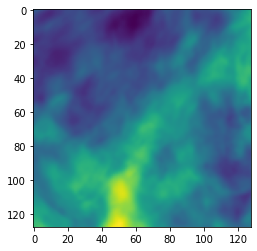

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__snsr/pds/im_true_turbulence_mthd__snsr_s1024.eps.pdf


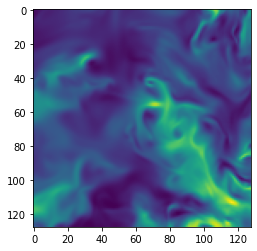

using previously loaded data
number of training samples: 3000
shallow_decoder oprating without drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__snsr/sd/im_turbulence_mthd__snsr_s1024.eps.pdf


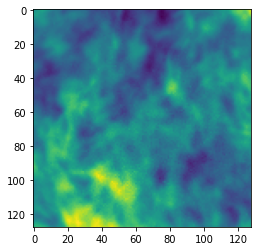

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__snsr/sd/im_true_turbulence_mthd__snsr_s1024.eps.pdf


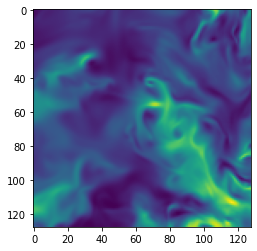

Error = 0.6358409427477372


In [ ]:
def turbulence_mthd__snsr():
  args.data_type = 'turbulence' 
  args.exp = 'mthd__snsr'

  # num_epochs, lr, bs, bsv, bn, early_stop = 1200, 0.0006, 1000, 400, 50, 300 
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0)


  # for s in [32*32]:

  #     num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, 25
  #     ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0)

  #     num_epochs, lr, bn  = 700, 0.0009, 25
  #     PDS_train(s, bn, num_epochs, lr)

  #     num_epochs, lr, wd  = 600, 0.0009, 1e-4
  #     SD_train(s, num_epochs, lr, wd)

  error = np.zeros((3, 1))
  plot_s_list = np.array([32*32])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([0])  # 5

  for s, i in zip([32*32], count(0, 1)):  
    seq_len, bn, plot, save = 7, 25, (1, 1, 0), (1, 1, 0)

    er1 = ARE_test(s, seq_len, bn,
                  plot, save,
                  plot_s_list=plot_s_list, 
                  plot_seq_len_list=plot_seq_len_list,
                  plot_image_idx=plot_image_idx)
    
    er2 = PDS_test(s, bn, plot, save,
                   plot_s_list=plot_s_list,
                   plot_image_idx=plot_image_idx)

    er3 = SD_test(s, plot, save,
                  plot_s_list=plot_s_list,
                  plot_image_idx=plot_image_idx)

    error[:, i] = [er1, er2, er3]

  error_path = get_path('', 'P')
  np.savetxt(osp.join(error_path, "error_{}.csv".format(args.RNN)), error, delimiter=",")

turbulence_mthd__snsr()

method and training samples

using previously loaded data
number of training samples: 3500
without_drop
(0) Training Loss: 0.99525195 NEW Valid Loss: 0.53828186 *
(1) Training Loss: 0.81785136 NEW Valid Loss: 0.46174866 *
(2) Training Loss: 0.59880912 NEW Valid Loss: 0.43673193 *
(3) Training Loss: 0.49685484 NEW Valid Loss: 0.43451479 *
(4) Training Loss: 0.46030447 NEW Valid Loss: 0.42804328 *
(5) Training Loss: 0.43669778 NEW Valid Loss: 0.42181182 *
(6) Training Loss: 0.40724048 NEW Valid Loss: 0.41321638 *
(7) Training Loss: 0.37540084 NEW Valid Loss: 0.40175825 *
(8) Training Loss: 0.34893897 NEW Valid Loss: 0.39637843 *
(9) Training Loss: 0.32530776 NEW Valid Loss: 0.39324343 *
(10) Training Loss: 0.30343992 NEW Valid Loss: 0.38979617 *
(11) Training Loss: 0.28227332 NEW Valid Loss: 0.37897620 *
(12) Training Loss: 0.26317629 NEW Valid Loss: 0.36450663 *
(13) Training Loss: 0.24564162 NEW Valid Loss: 0.35280216 *
(14) Training Loss: 0.23019379 NEW Valid Loss: 0.34531921 *
(15) Training Loss: 0.21669362 NEW 

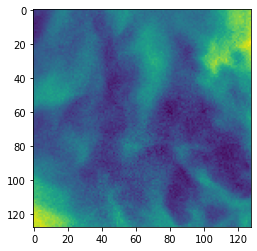

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__tr_samp/are/autoencoder/tr_samp3500/best_train_in.pdf


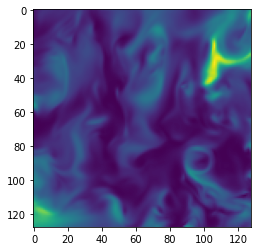

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__tr_samp/are/autoencoder/tr_samp3500/best_valid_out.pdf


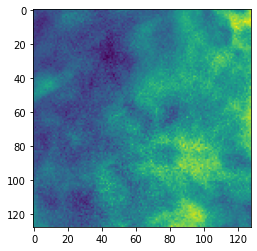

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__tr_samp/are/autoencoder/tr_samp3500/best_valid_in.pdf


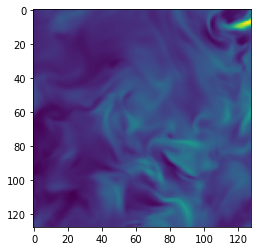

==========weights saved==========
================================ over ================================
using previously loaded data
number of training samples: 4000
without_drop
(0) Training Loss: 0.99537224 NEW Valid Loss: 0.90736639 *
(1) Training Loss: 0.81837076 NEW Valid Loss: 0.87483031 *
(2) Training Loss: 0.62036586 NEW Valid Loss: 0.84615910 *
(3) Training Loss: 0.52283031 NEW Valid Loss: 0.82028997 *
(4) Training Loss: 0.48035479 NEW Valid Loss: 0.80194181 *
(5) Training Loss: 0.45530561 NEW Valid Loss: 0.79586285 *
(6) Training Loss: 0.42552930 NEW Valid Loss: 0.78805929 *
(7) Training Loss: 0.39186731 NEW Valid Loss: 0.77755064 *
(8) Training Loss: 0.36324129 NEW Valid Loss: 0.76261765 *
(9) Training Loss: 0.33976153 NEW Valid Loss: 0.74639493 *
(10) Training Loss: 0.31938720 NEW Valid Loss: 0.73864156 *
(11) Training Loss: 0.30223402 NEW Valid Loss: 0.73402953 *
(12) Training Loss: 0.28217626 NEW Valid Loss: 0.72354460 *
(13) Training Loss: 0.26437664 NEW Valid Loss: 0.7

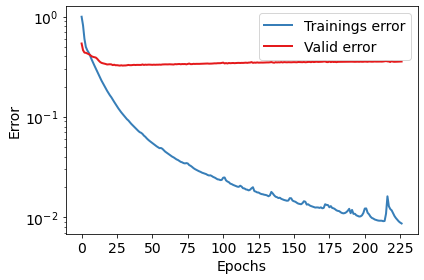

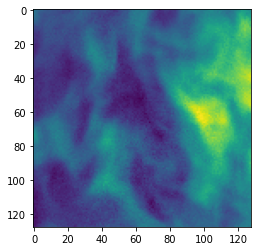

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__tr_samp/are/autoencoder/tr_samp4000/best_train_in.pdf


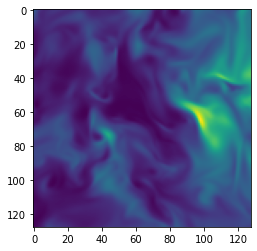

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__tr_samp/are/autoencoder/tr_samp4000/best_valid_out.pdf


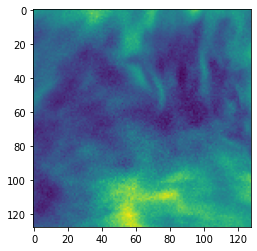

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/turbulence/mthd__tr_samp/are/autoencoder/tr_samp4000/best_valid_in.pdf


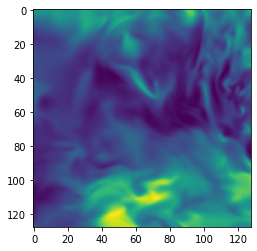

==========weights saved==========
================================ over ================================


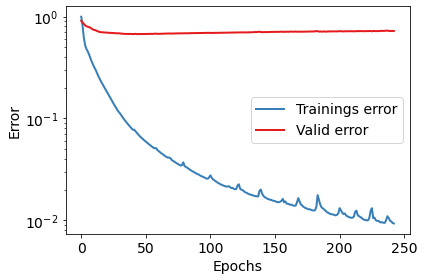

In [ ]:
args.data_type = 'turbulence'
args.exp = 'mthd__tr_samp'

for args.tr_samp in range(3500, 4001, 500):

  num_epochs, lr, bs, bsv, bn, early_stop = 1500, 0.0006, 1000, 400, 50, 200
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0) 

  # num_epochs, lr, hidden_size, seq_len, bn  = 2700, 0.0006, 50, 7, 25
  # ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0)

  # num_epochs, lr, bn  = 1200, 0.0009, 25
  # PDS_train(s, bn, num_epochs, lr)

  # num_epochs, lr, wd  = 12, 0.0009, 1e-4
  # SD_train(s, num_epochs, lr, wd)

del args.tr_samp

## Periodic

method and sensors

data loaded
--- 3.377856492996216 seconds --
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
data_type: periodic 
 using lstm cell
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
reconstruction 36
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/are/online/lstm/im_periodic_mthd__snsr_s1_sq7_i39.eps.pdf


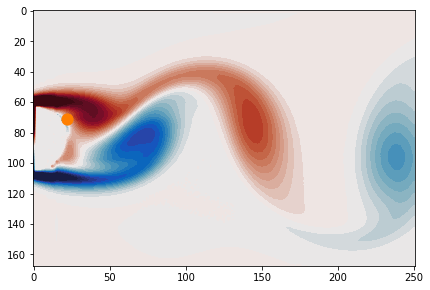

reconstruction 36
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/are/online/lstm/im_true_periodic_mthd__snsr_s1_sq7_i39.eps.pdf


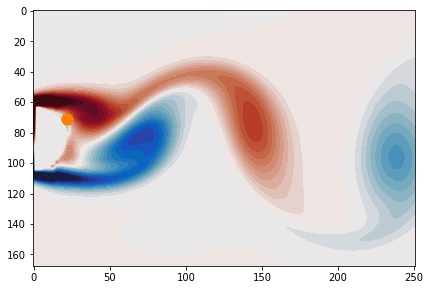

Error = 7 0.009561678719442517
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error 1 0.45135151571767584
reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/pds/im_periodic_mthd__snsr_s1.eps.pdf


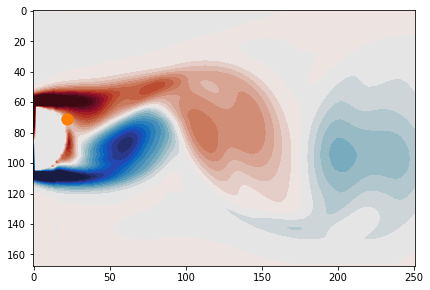

reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/pds/im_true_periodic_mthd__snsr_s1.eps.pdf


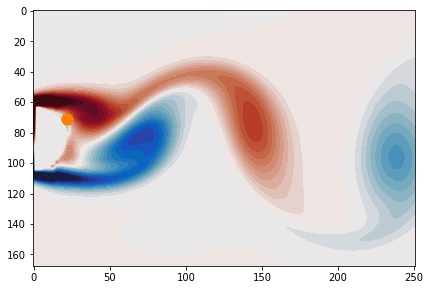

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
shallow_decoder oprating without drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/sd/im_periodic_mthd__snsr_s1.eps.pdf


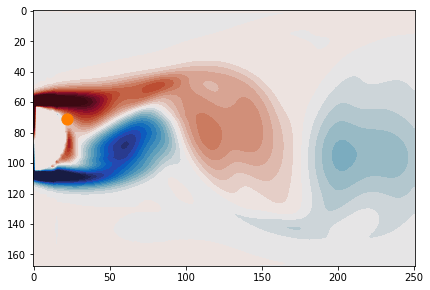

reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/sd/im_true_periodic_mthd__snsr_s1.eps.pdf


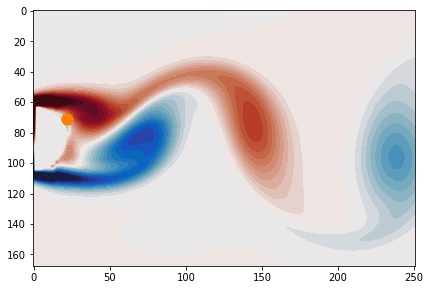

Error = 0.4638499030008307
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
data_type: periodic 
 using lstm cell
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
reconstruction 36
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/are/online/lstm/im_periodic_mthd__snsr_s2_sq7_i39.eps.pdf


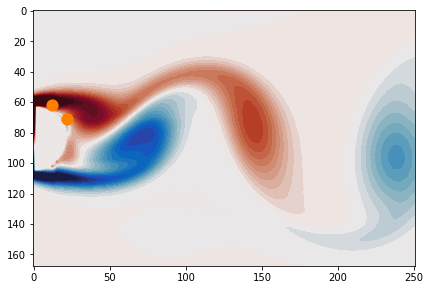

reconstruction 36
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/are/online/lstm/im_true_periodic_mthd__snsr_s2_sq7_i39.eps.pdf


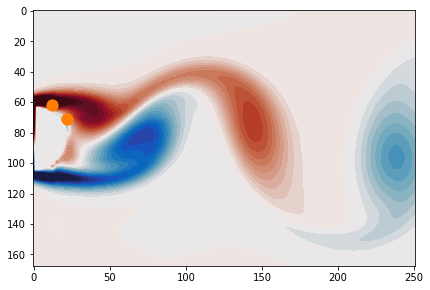

Error = 7 0.008320122091151091
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error 2 0.016324523092384535
reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/pds/im_periodic_mthd__snsr_s2.eps.pdf


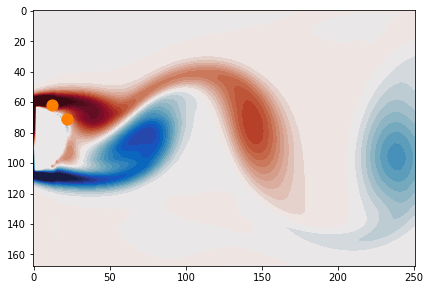

reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/pds/im_true_periodic_mthd__snsr_s2.eps.pdf


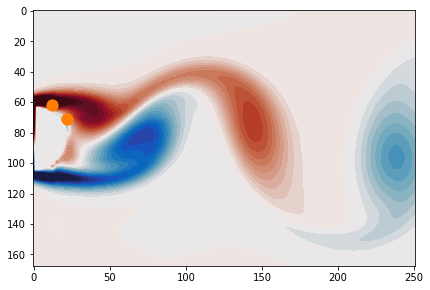

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
shallow_decoder oprating without drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/sd/im_periodic_mthd__snsr_s2.eps.pdf


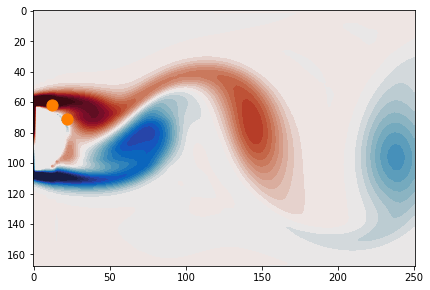

reconstruction 39
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snsr/sd/im_true_periodic_mthd__snsr_s2.eps.pdf


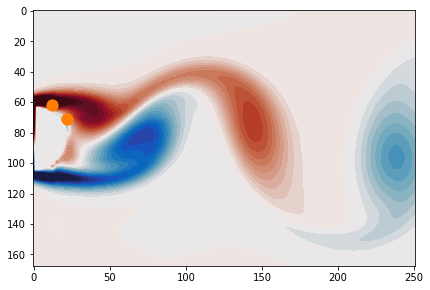

Error = 0.021369018978299945
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
data_type: periodic 
 using lstm cell
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
Error = 7 0.007326107482011275
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error 5 0.015888418438690023
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
shallow_decoder oprating without drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


Error = 0.017733808862175945
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
data_type: periodic 
 using lstm cell
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
without_drop
Error = 7 0.006829095003410379
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error 10 0.015896533307143405
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
shallow_decoder oprating without drop
Error = 0.0194259278425937


In [ ]:
def periodic_mthd__snsr():
  args.data_type = 'periodic' 
  args.exp = 'mthd__snsr'

  # num_epochs, lr, bs, bsv, bn, early_stop  = 1200, 0.0007, 399, 133, 25, 200
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0)


  # for s in [1, 2, 5, 10]:

  #     num_epochs, lr, hidden_size, seq_len, bn  = 2700, 0.0006, 50, 7, 25
  #     ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0)

  #     num_epochs, lr, bn  = 1200, 0.0009, 25
  #     PDS_train(s, bn, num_epochs, lr)

  #     num_epochs, lr, wd  = 1500, 0.001, 1e-4
  #     SD_train(s, num_epochs, lr, wd)

  error = np.zeros((3, 4))
  plot_s_list = np.array([1, 2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([39])  

  for s, i in zip([1, 2, 5, 10], count(0, 1)):  
    seq_len, bn, plot, save = 7, 25, (1, 1, 0), (1, 1, 0)

    er1 = ARE_test(s, seq_len, bn,
                  plot, save,
                  plot_s_list=plot_s_list, 
                  plot_seq_len_list=plot_seq_len_list,
                  plot_image_idx=plot_image_idx)
    
    er2 = PDS_test(s, bn, plot, save,
                   plot_s_list=plot_s_list,
                   plot_image_idx=plot_image_idx)

    er3 = SD_test(s, plot, save,
                  plot_s_list=plot_s_list,
                  plot_image_idx=plot_image_idx)

    error[:, i] = [er1, er2, er3]

  error_path = get_path('', 'P')
  np.savetxt(osp.join(error_path, "error_{}.csv".format(args.RNN)), error, delimiter=",")

periodic_mthd__snsr()

method and SNR(signal to noise ratio)


 no. of sensors: 1  SNR: 16
using previously loaded data
in autoencoder_train_data-- noise data SNR:  16
number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.22622396949755738 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  16
number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.9591023185930829 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  16
number of training samples: 180
shallow_decoder oprating with drop
using previously loaded data
in autoencoder_train_data-- no noise data


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


number of training samples: 180
Error:  0.47593050824043226 ------------------------------------------------

 no. of sensors: 1  SNR: 20
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR20.pdf


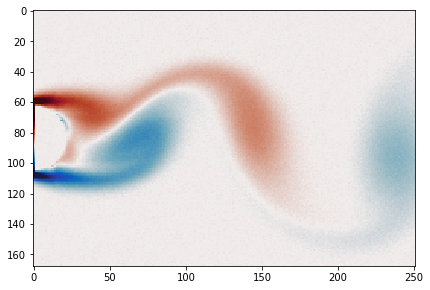

number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.1402675181188392 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR20.pdf


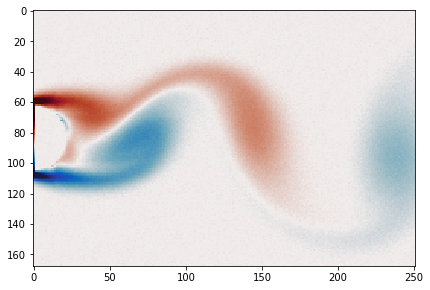

number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
reconstruction 0
reconstruction 0
Error:  0.9714040762028373 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR20.pdf


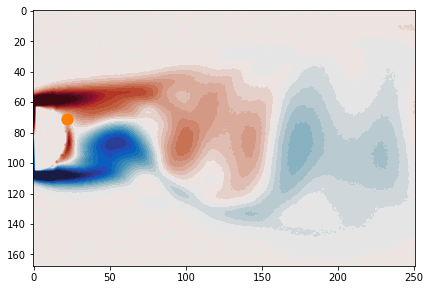

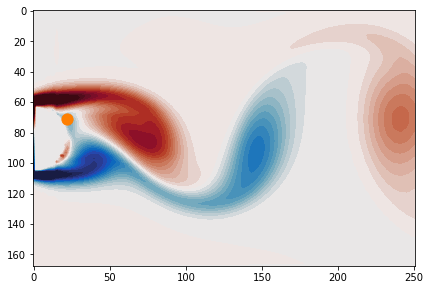

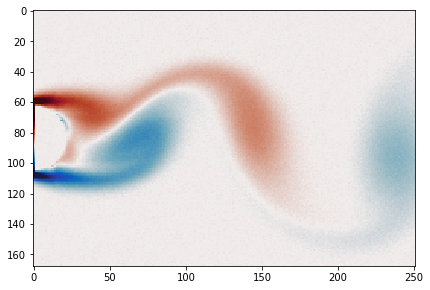

number of training samples: 180
shallow_decoder oprating with drop
reconstruction 0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 0
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.4705810399380219 ------------------------------------------------

 no. of sensors: 1  SNR: 24
using previously loaded data
in autoencoder_train_data-- noise data SNR:  24
number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.09021388042676379 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  24
number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.9645030532918705 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  24
num

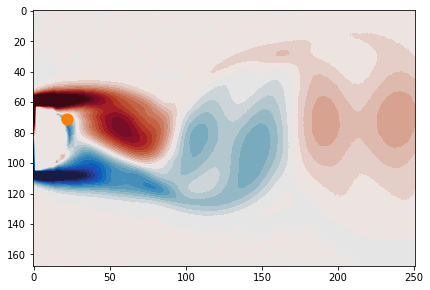

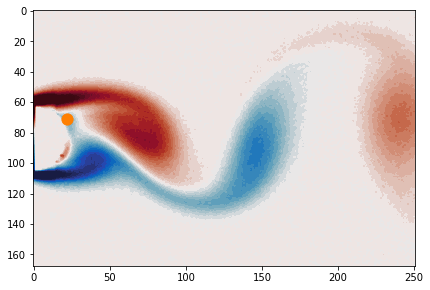

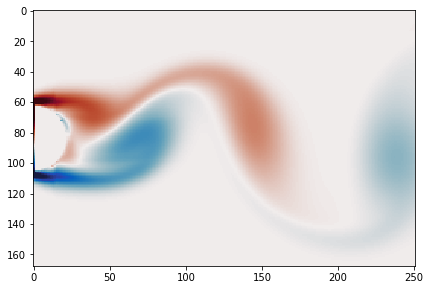

number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.020337263668242664 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  72
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR72.pdf


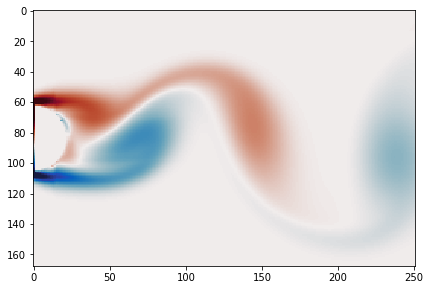

number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
reconstruction 0
reconstruction 0
Error:  0.5660074190885304 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  72
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR72.pdf


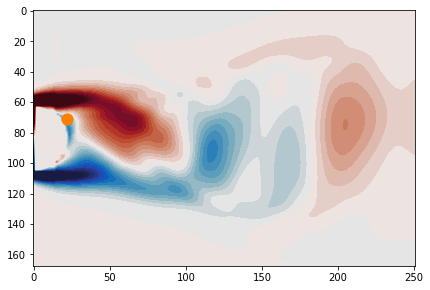

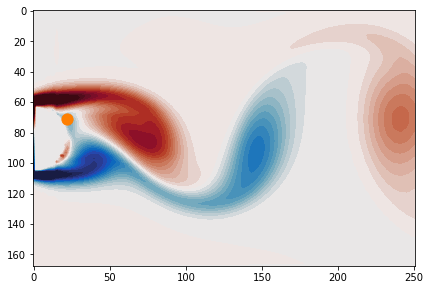

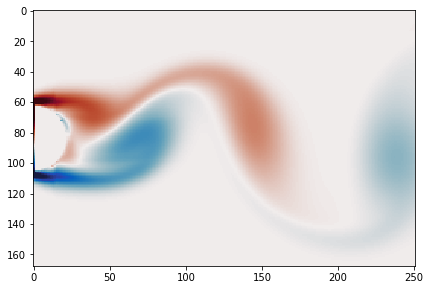

number of training samples: 180
shallow_decoder oprating with drop
reconstruction 0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 0
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.46606284484694427 ------------------------------------------------

 no. of sensors: 1  SNR: 76
using previously loaded data
in autoencoder_train_data-- noise data SNR:  76
number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.020262162526031045 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  76
number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.5309204447607202 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  76
n

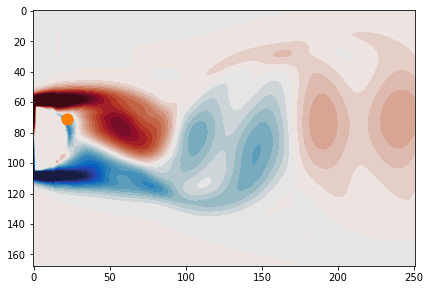

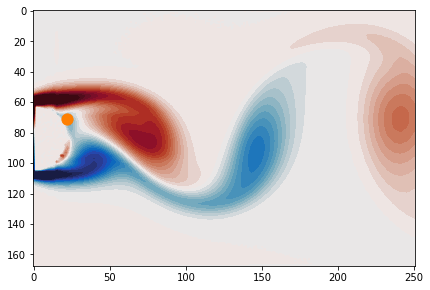

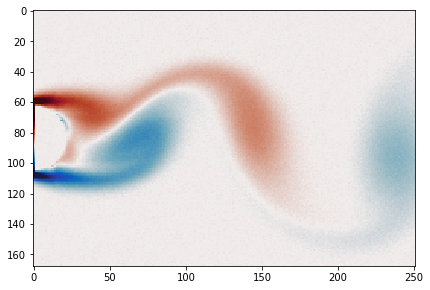

number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.06439266899266169 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR20.pdf


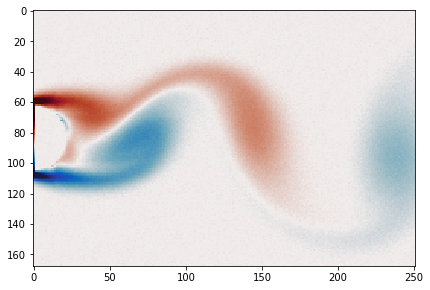

number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
reconstruction 0
reconstruction 0
Error:  0.8919527437856484 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR20.pdf


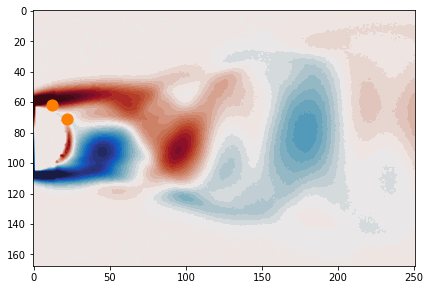

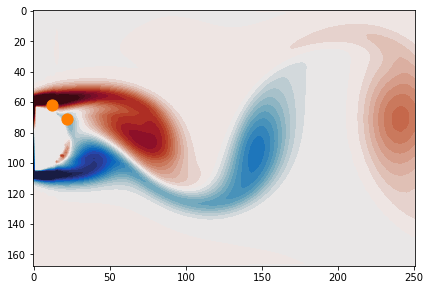

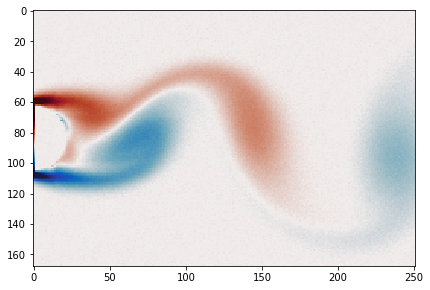

number of training samples: 180
shallow_decoder oprating with drop
reconstruction 0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 0
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.07885002471147481 ------------------------------------------------

 no. of sensors: 2  SNR: 24
using previously loaded data
in autoencoder_train_data-- noise data SNR:  24
number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.053596926384584555 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  24
number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.8834840391206767 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  24
n

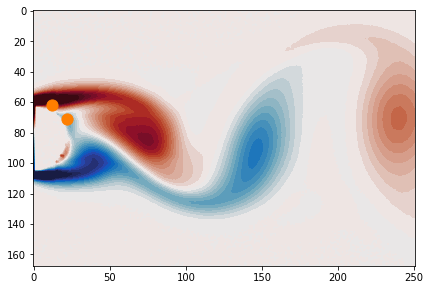

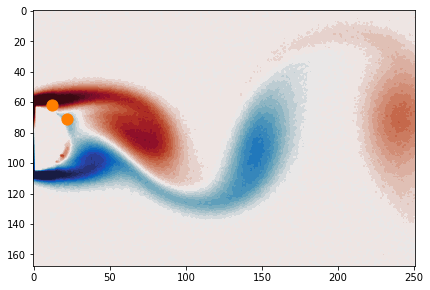

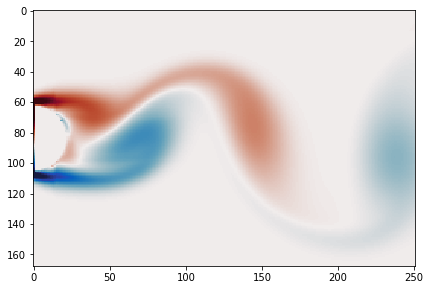

number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.01925236090855898 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  72
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR72.pdf


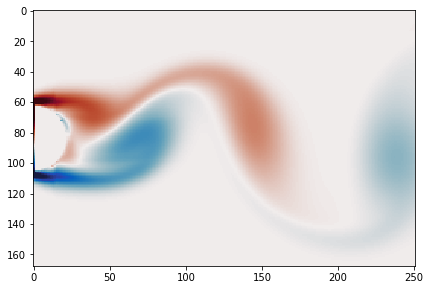

number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
reconstruction 0
reconstruction 0
Error:  0.4180185180734341 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  72
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/mthd__snr/im_true_39_SNR72.pdf


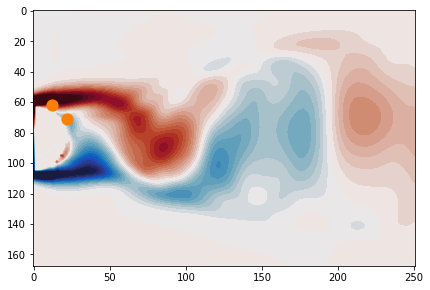

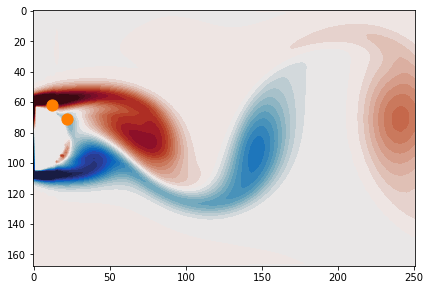

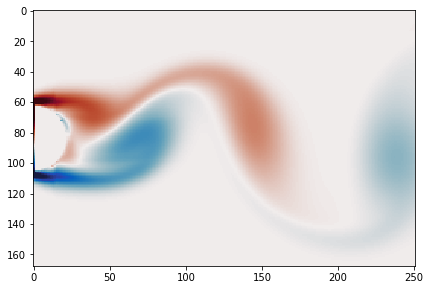

number of training samples: 180
shallow_decoder oprating with drop
reconstruction 0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 0
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.045206071742832636 ------------------------------------------------

 no. of sensors: 2  SNR: 76
using previously loaded data
in autoencoder_train_data-- noise data SNR:  76
number of training samples: 180
autoencoder oprating with dropout: 0.35
data_type: periodic 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.019163278089333685 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  76
number of training samples: 180
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
Error:  0.3063904817089082 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  76


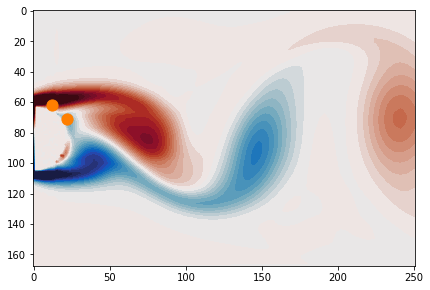

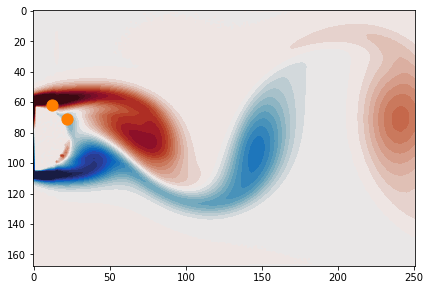

In [ ]:
def periodic_mthd__snr():
  args.data_type = 'periodic' 
  args.exp = 'mthd__snr'

  # num_epochs, lr, bs, bsv, bn, early_stop = 1200, 0.0007, 399, 133, 25, 200
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)

  # for s in [1, 2]:

  #     # num_epochs, lr, hidden_size, seq_len, bn  = 2700, 0.0006, 50, 7, 25
  #     # ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  #     # num_epochs, lr, bn  = 1200, 0.0009, 25
  #     # PDS_train(s, bn, num_epochs, lr)

  #     num_epochs, lr, wd  = 1500, 0.001, 1e-4
  #     SD_train(s, num_epochs, lr, wd, drop=0.1)

  SNR_range = range(16, 84, 4)
  error = np.zeros((3, len(SNR_range)))
  plot_s_list = np.array([1, 2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([39])
  plot_SNR = np.array([20, 72])
  
  for s in [1, 2]:
    for SNR, i in zip(SNR_range, count(0, 1)):
      seq_len, bn, plot, save, use_stats = 7, 25, (0, 0), (0, 0), 1
      print('\n no. of sensors:',s,' SNR:',SNR)

      er1 = ARE_test(s, seq_len, bn,
                    plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list, 
                    plot_seq_len_list=plot_seq_len_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR,
                    use_stats=use_stats)
      
      er2 = PDS_test(s, bn, plot, save,
                    drop=1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR,
                    use_stats=use_stats)

      er3 = SD_test(s, plot, save,
                    drop=0.1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR,
                    use_stats=use_stats)

      error[:, i] = [er1, er2, er3]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_{}.csv".format(args.RNN, s)), error, delimiter=",")

periodic_mthd__snr()

data loaded
--- 3.8073697090148926 seconds --
in autoencoder_train_data-- no noise data
number of training samples: 180
autoencoder oprating with dropout: 0.35
(0) Training Loss: 0.73233044 NEW Valid Loss: 0.79712862 *
(1) Training Loss: 0.73799878 Valid Loss: 0.72772741 
(2) Training Loss: 0.72384316 NEW Valid Loss: 0.69423306 *
(3) Training Loss: 0.70793724 NEW Valid Loss: 0.64664203 *
(4) Training Loss: 0.68302584 NEW Valid Loss: 0.58097678 *
(5) Training Loss: 0.64666969 NEW Valid Loss: 0.50233030 *
(6) Training Loss: 0.59970063 NEW Valid Loss: 0.42600495 *
(7) Training Loss: 0.54082298 NEW Valid Loss: 0.37609342 *
(8) Training Loss: 0.47172362 NEW Valid Loss: 0.37758005 *
(9) Training Loss: 0.40580645 NEW Valid Loss: 0.44356695 *
(10) Training Loss: 0.33744693 NEW Valid Loss: 0.55440795 *
(11) Training Loss: 0.28024331 NEW Valid Loss: 0.67765760 *
(12) Training Loss: 0.23843859 NEW Valid Loss: 0.79741293 *
(13) Training Loss: 0.21144889 NEW Valid Loss: 0.91191620 *
(14) Training L

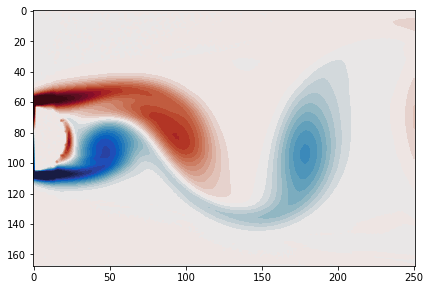

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/rndm_trials/are/autoencoder/best_train_in.pdf


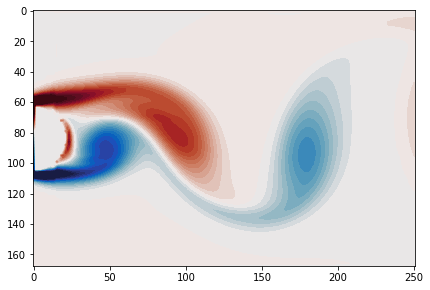

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/rndm_trials/are/autoencoder/best_valid_out.pdf


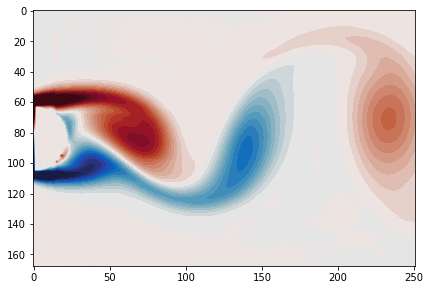

reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/periodic/rndm_trials/are/autoencoder/best_valid_in.pdf


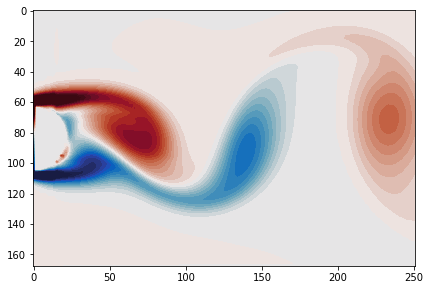

==========weights saved==========
================================ over ================================
sensor_number = 1 seq_len =  7
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
autoencoder oprating with dropout: 0.35
(177, 4) (177, 25) (57, 4) (57, 25)
177 57
data_type: periodic 
 using lstm cell
(2699) BEST_Training Loss: 0.00021178 BEST_Valid Loss: 0.00027316 
=========saved weights=========
================================ over ================================
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
=========saved weights=========
================================ over ================================
sensor_number = 1
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 180
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


(25) Training Loss: 0.39061055 Valid Loss: 0.37040073 
(29) Training Loss: 0.38616678 Valid Loss: 0.36414239 
(31) Training Loss: 0.38351813 Valid Loss: 0.36196867 
(34) Training Loss: 0.38045660 Valid Loss: 0.35927361 
(35) Training Loss: 0.37913448 Valid Loss: 0.35843635 
(42) Training Loss: 0.37543574 Valid Loss: 0.35426730 
(43) Training Loss: 0.37327886 Valid Loss: 0.35318217 
(45) Training Loss: 0.37307468 Valid Loss: 0.35266337 
(46) Training Loss: 0.37020913 Valid Loss: 0.35215384 
(47) Training Loss: 0.37104625 Valid Loss: 0.35147917 
(49) Training Loss: 0.37172925 Valid Loss: 0.35048002 
(50) Training Loss: 0.37123799 Valid Loss: 0.35013136 
(51) Training Loss: 0.36871496 Valid Loss: 0.34994420 
(52) Training Loss: 0.36968842 Valid Loss: 0.34950218 
(53) Training Loss: 0.36978900 Valid Loss: 0.34910747 
(56) Training Loss: 0.37100115 Valid Loss: 0.34822881 
(57) Training Loss: 0.36743665 Valid Loss: 0.34785959 
(58) Training Loss: 0.36758420 Valid Loss: 0.34741950 
(60) Train

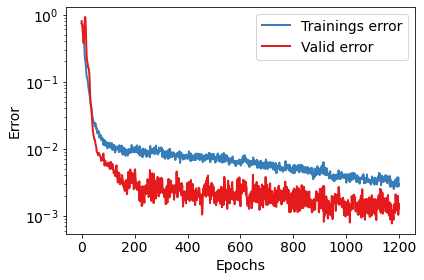

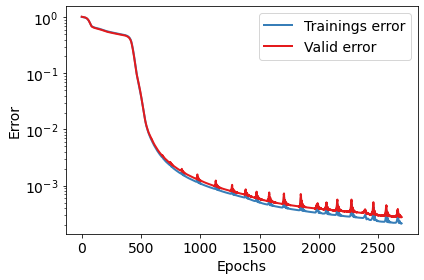

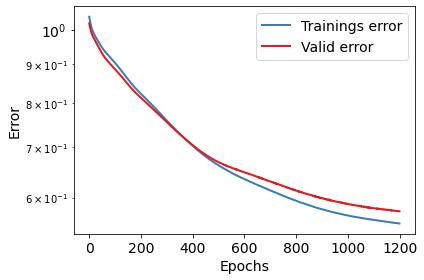

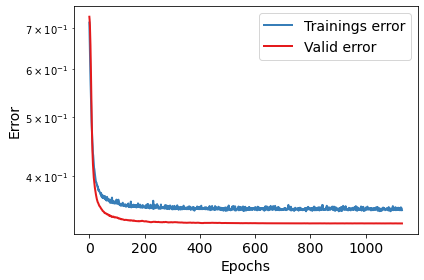

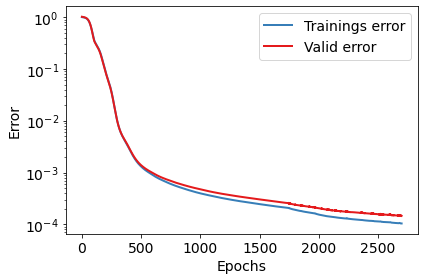

...

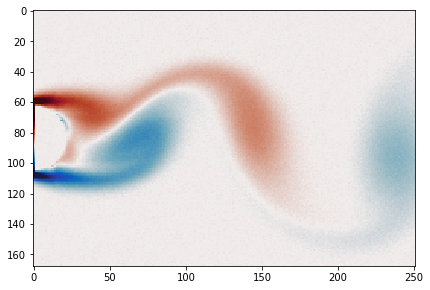

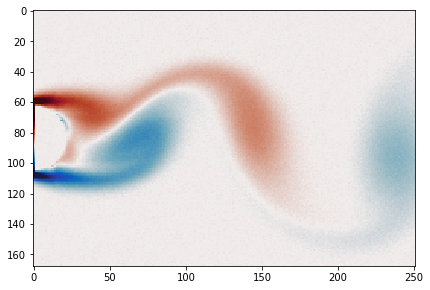

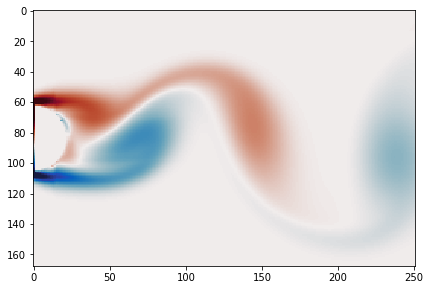

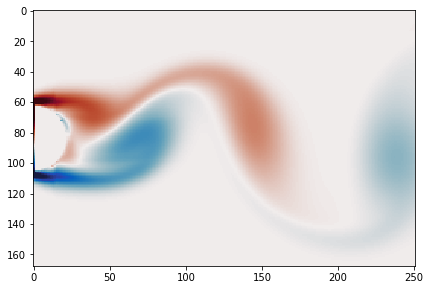

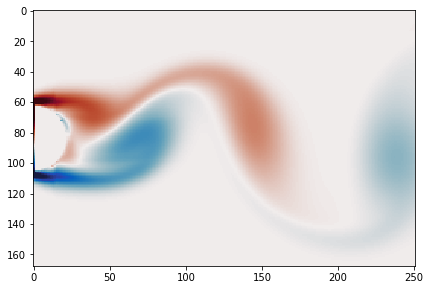

In [ ]:
def periodic_rndm_trials():
  args.data_type = 'periodic' 
  args.exp = 'rndm_trials'

  num_epochs, lr, bs, bsv, bn, early_stop  = 1200, 0.0007, 399, 133, 25, 200 
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)


  for s in [1, 2]:  # , 4, 64]:

      num_epochs, lr, hidden_size, seq_len, bn  = 2700, 0.0006, 50, 7, 25 
      ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

      num_epochs, lr, bn  = 1200, 0.0009, 25 
      PDS_train(s, bn, num_epochs, lr)

      num_epochs, lr, wd  = 1500, 0.001, 1e-4 
      SD_train(s, num_epochs, lr, wd, drop=0.1)

  SNR_range = range(16, 84, 4)
  error = np.zeros((3, len(SNR_range)))
  plot_s_list = np.array([10, 20])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([39])
  plot_SNR = np.array([20, 72])
  
  for s in [1, 2]:
    for SNR, i in zip(SNR_range, count(0, 1)):
      seq_len, bn, plot, save, use_stats = 7, 25, (0, 0, 0), (0, 0, 0), 1
      print('\n no. of sensors:',s,' SNR:',SNR)

      er1 = ARE_test(s, seq_len, bn,
                    plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list, 
                    plot_seq_len_list=plot_seq_len_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)
      
      er2 = PDS_test(s, bn, plot, save,
                    SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      er3 = SD_test(s, plot, save,
                    drop=0.1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      error[:, i] = [er1, er2, er3]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_{}.csv".format(args.RNN, s)), error, delimiter=",")

periodic_rndm_trials()

sensor and sequence len.

In [ ]:
def periodic_snsr__seq_len():
  args.data_type = 'periodic' 
  args.exp = 'snsr__seq_len'

  num_epochs, lr, bs, bsv, bn, early_stop = 1200, 0.0007, 399, 133, 25, 200
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0)

  for s in [1, 2, 5, 10]:
    for seq_len in [3, 5, 7, 9]:

        num_epochs, lr, hidden_size, s, bn  = 2700, 0.0006, 50, s, 25
        ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  error = np.zeros((4, 4))
  plot_s_list = np.array([1, 2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([39])  
  plot_SNR = np.array([20, 72])

  for SNR in [None]:  
    for s, j in zip([1, 2, 5, 10], count(0, 1)):
      for seq_len, i in zip([3, 5, 7, 9], count(0, 1)):  
        bn, plot, save = (25, (1, 1, 0), (1, 1, 0))
        print('\n no. of sensors:',s,' seq_len:',seq_len)
        
        er1 = ARE_test(s, seq_len, bn,
                       plot, save,
                       plot_s_list=plot_s_list, 
                       plot_seq_len_list=plot_seq_len_list,
                       plot_image_idx=plot_image_idx)
        
        # er1 = ARE_test(s, seq_len, bn,
        #                plot, save,
        #                drop=0.35, SNR=SNR,
        #                plot_s_list=plot_s_list, 
        #                plot_seq_len_list=plot_seq_len_list,
        #                plot_image_idx=plot_image_idx,
        #                plot_SNR=plot_SNR)

        error[j, i] = er1

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_SNR{}.csv".format(args.RNN, SNR)), error, delimiter=",")

periodic_snsr__seq_len()

## Transient

method and sensors

In [ ]:
def transient_mthd__snsr():
  args.data_type = 'transient' 
  args.exp = 'mthd__snsr'

  # num_epochs, lr, bs, bsv, bn, early_stop  = 1200, 0.001, 399, 133, 25, 200
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0)


  # for s in [1, 2, 5, 10]:

  #     # num_epochs, lr, hidden_size, seq_len, bn  = 2600, 0.0008, 50, 7, 25
  #     # ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0)

  #     # num_epochs, lr, bn  = 1500, 0.0009, 25
  #     # PDS_train(s, bn, num_epochs, lr)

  #     num_epochs, lr, wd  = 1500, 0.001, 1e-4
  #     SD_train(s, num_epochs, lr, wd)

  error = np.zeros((3, 4))
  plot_s_list = np.array([1, 2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([335])    

  for s, i in zip([1, 2, 5, 10], count(0, 1)):  
    seq_len, bn, plot, save = 7, 25, (1, 1, 0), (1, 1, 0)

    er1 = ARE_test(s, seq_len, bn,
                  plot, save,
                  plot_s_list=plot_s_list, 
                  plot_seq_len_list=plot_seq_len_list,
                  plot_image_idx=plot_image_idx)
    
    er2 = PDS_test(s, bn, plot, save,
                   plot_s_list=plot_s_list,
                   plot_image_idx=plot_image_idx)

    er3 = SD_test(s, plot, save,
                  plot_s_list=plot_s_list,
                  plot_image_idx=plot_image_idx)

    error[:, i] = [er1, er2, er3]

  error_path = get_path('', 'P')
  np.savetxt(osp.join(error_path, "error_{}.csv".format(args.RNN)), error, delimiter=",")

transient_mthd__snsr()

method and SNR(signal to noise ratio)

no. of sensors: 1  SNR: 20
loading transient flow past cylinder data...
data loaded
--- 50.69154691696167 seconds --
in autoencoder_train_data-- noise data SNR = 20
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.669714710354249 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 20
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.7735311496691187 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 20
number of training samples: 1197
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.6032290183209765 ------------------------------------------------
no. of sensors: 1  SNR: 24
using previously loaded data
in autoencoder_train_data-- noise data SNR = 24
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.6206687671064935 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 24
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.7655759442507526 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- n

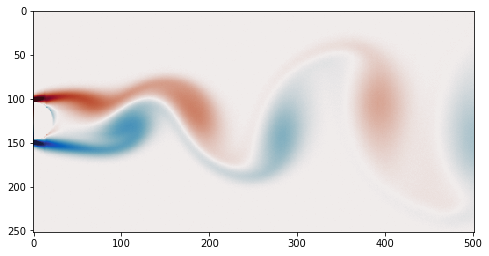

number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_transient_mthd__snr_are_s1_sq7_i335_SNR28.pdf


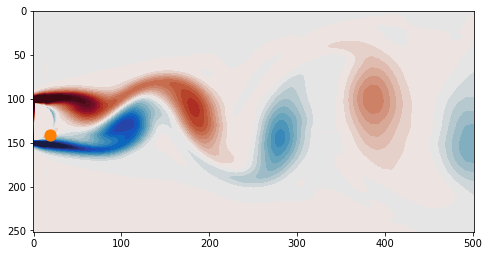

reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_true_transient_mthd__snr_are_s1_sq7_i335_SNR28.pdf


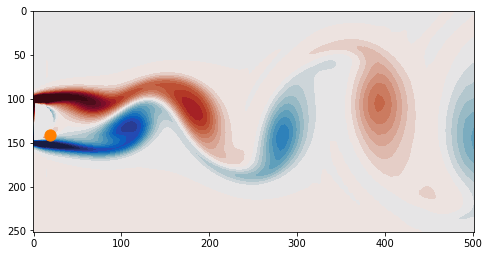

Error:  0.5467348709445835 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 28
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR28.pdf


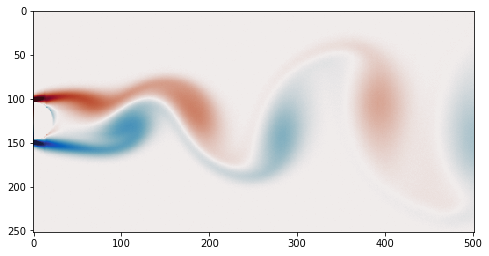

number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_transient_mthd__snr_pds_s1_SNR28.pdf


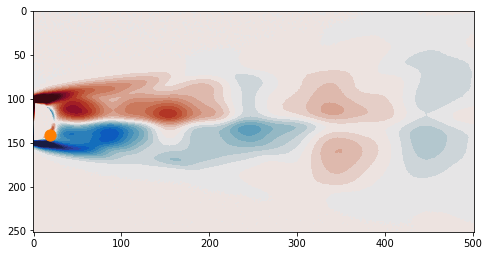

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_true_transient_mthd__snr_pds_s1_SNR28.pdf


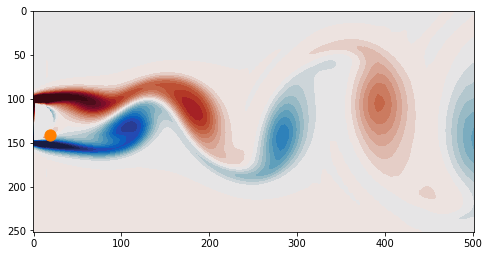

Error:  0.7587983774855017 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 28
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR28.pdf


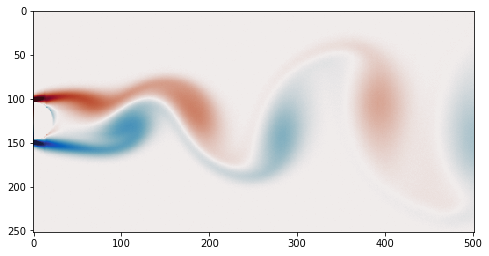

number of training samples: 1197
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_transient_mthd__snr_sd_s1_SNR28.pdf


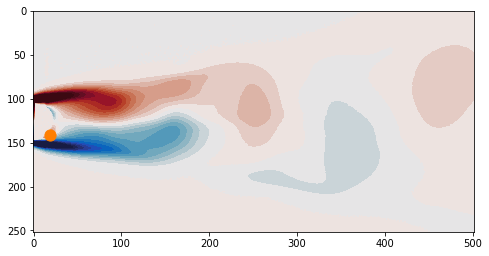

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_true_transient_mthd__snr_sd_s1_SNR28.pdf


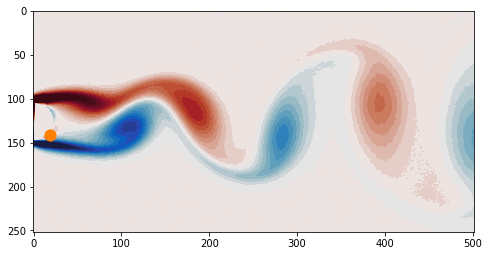

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.5707366818685579 ------------------------------------------------
no. of sensors: 1  SNR: 32
using previously loaded data
in autoencoder_train_data-- noise data SNR = 32
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.47744053960644073 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 32
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.7555308682660256 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.5631013225548849 ------------------------------------------------
no. of sensors: 1  SNR: 36
using previously loaded data
in autoencoder_train_data-- noise data SNR = 36
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.41113519572823 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 36
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.7318853822996754 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noi

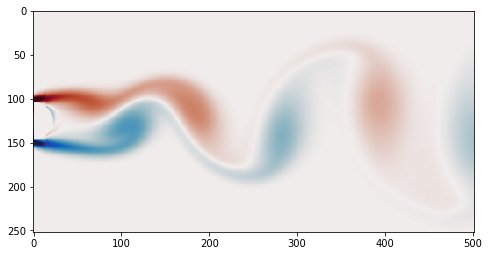

number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_transient_mthd__snr_are_s1_sq7_i335_SNR76.pdf


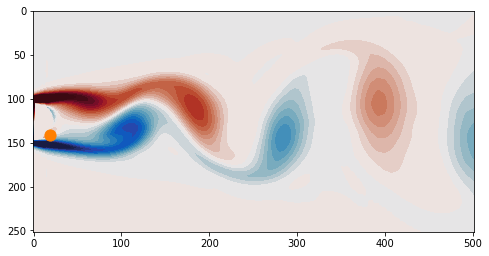

reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_true_transient_mthd__snr_are_s1_sq7_i335_SNR76.pdf


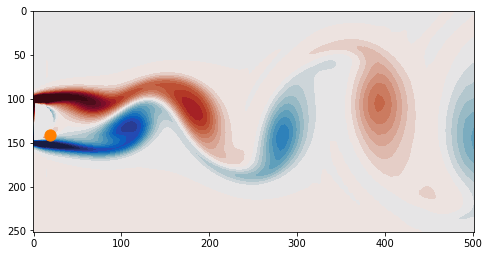

Error:  0.2056237025549938 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 76
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR76.pdf


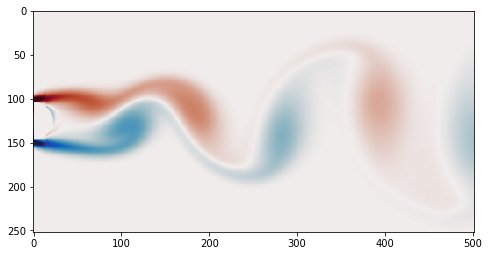

number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_transient_mthd__snr_pds_s1_SNR76.pdf


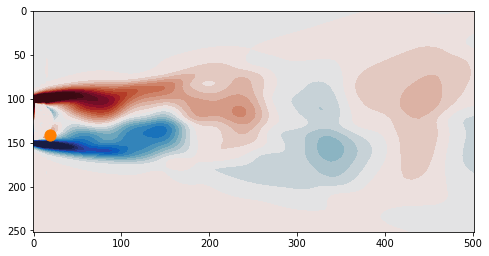

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_true_transient_mthd__snr_pds_s1_SNR76.pdf


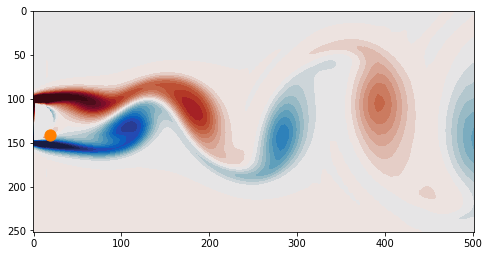

Error:  0.6102795462980437 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 76
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR76.pdf


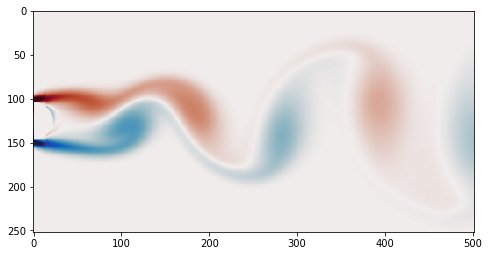

number of training samples: 1197
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_transient_mthd__snr_sd_s1_SNR76.pdf


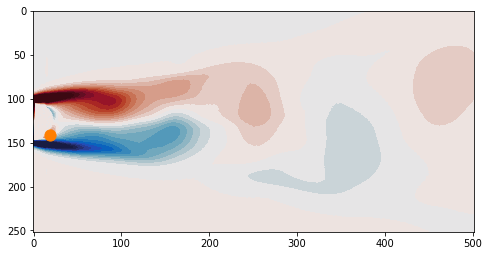

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_true_transient_mthd__snr_sd_s1_SNR76.pdf


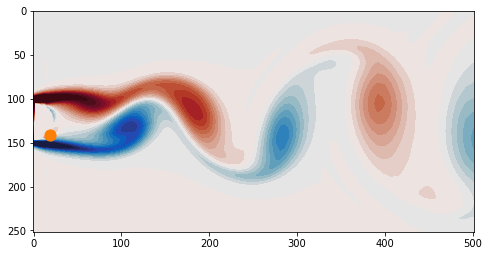

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.5567438396517367 ------------------------------------------------
no. of sensors: 1  SNR: 80
using previously loaded data
in autoencoder_train_data-- noise data SNR = 80
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.2053801381337741 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 80
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.5452953483214615 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- n

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.5567427797630871 ------------------------------------------------
no. of sensors: 2  SNR: 20
using previously loaded data
in autoencoder_train_data-- noise data SNR = 20
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.6074388387585231 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 20
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.9952132114625937 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- n

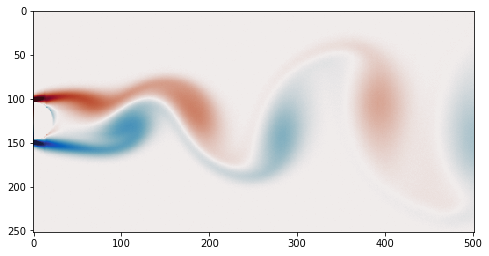

number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_transient_mthd__snr_are_s2_sq7_i335_SNR28.pdf


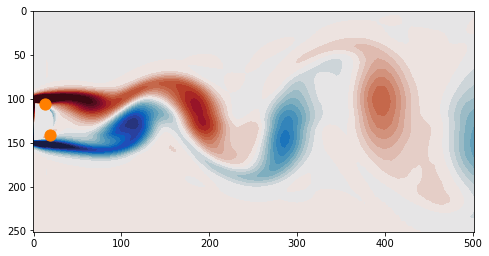

reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_true_transient_mthd__snr_are_s2_sq7_i335_SNR28.pdf


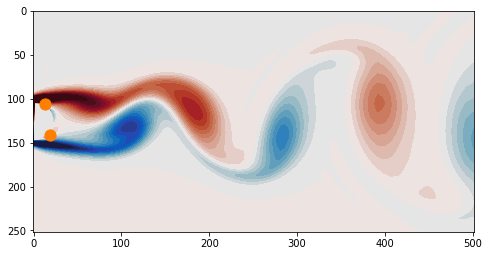

Error:  0.36485508869696015 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 28
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR28.pdf


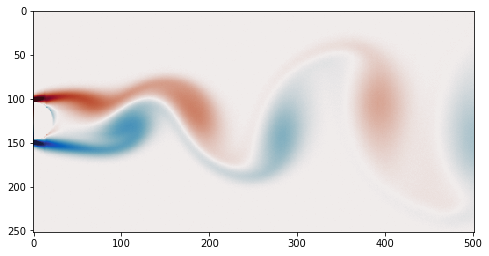

number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_transient_mthd__snr_pds_s2_SNR28.pdf


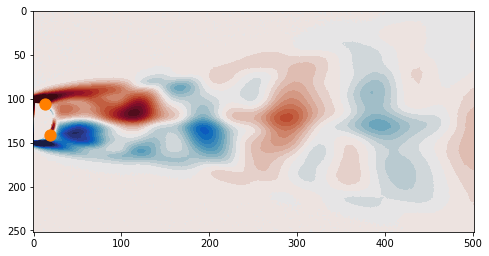

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_true_transient_mthd__snr_pds_s2_SNR28.pdf


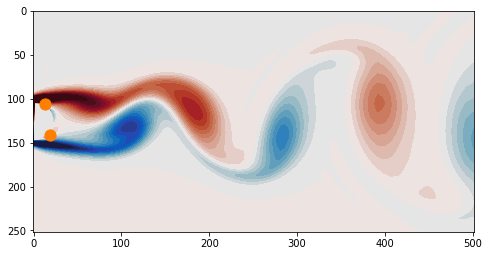

Error:  0.9741441386147996 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 28
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR28.pdf


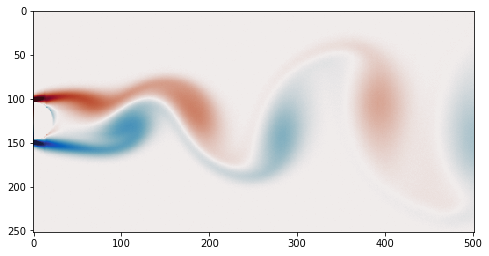

number of training samples: 1197
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_transient_mthd__snr_sd_s2_SNR28.pdf


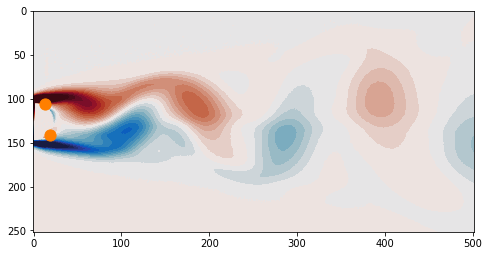

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_true_transient_mthd__snr_sd_s2_SNR28.pdf


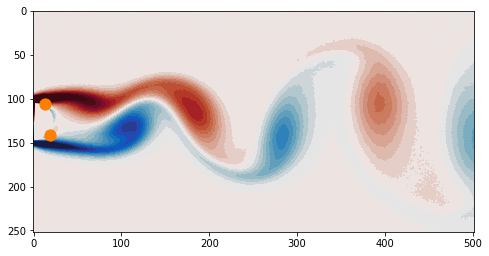

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.4173893202048223 ------------------------------------------------
no. of sensors: 2  SNR: 32
using previously loaded data
in autoencoder_train_data-- noise data SNR = 32
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.2998031605994779 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 32
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.9693345635154353 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- n

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.4080539315719801 ------------------------------------------------
no. of sensors: 2  SNR: 36
using previously loaded data
in autoencoder_train_data-- noise data SNR = 36
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.2608756153331023 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 36
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.9021241751346789 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- n

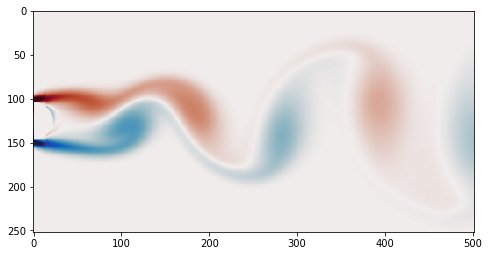

number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_transient_mthd__snr_are_s2_sq7_i335_SNR76.pdf


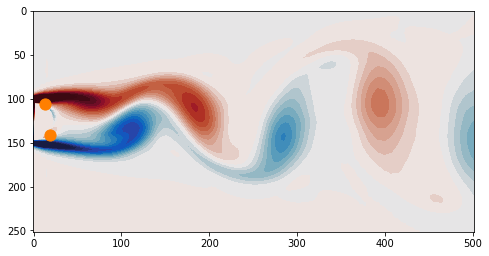

reconstruction 332
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/are/online/lstm/im_true_transient_mthd__snr_are_s2_sq7_i335_SNR76.pdf


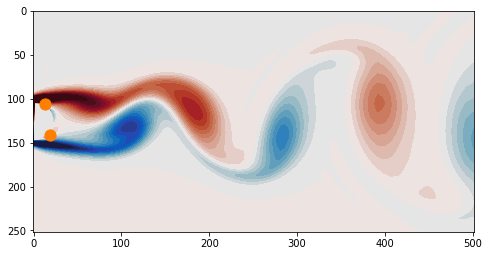

Error:  0.21692516002718704 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 76
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR76.pdf


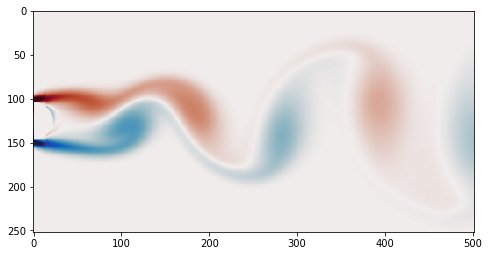

number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_transient_mthd__snr_pds_s2_SNR76.pdf


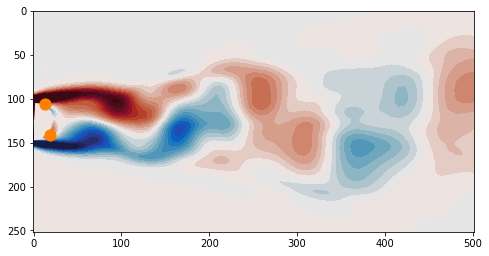

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/pds/im_true_transient_mthd__snr_pds_s2_SNR76.pdf


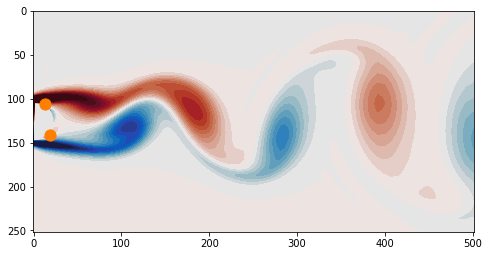

Error:  0.6722447960611049 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 76
reconstruction 0
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/im_true_335_SNR76.pdf


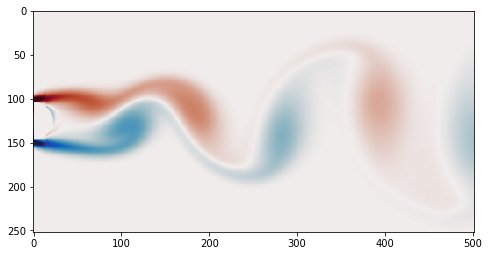

number of training samples: 1197
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_transient_mthd__snr_sd_s2_SNR76.pdf


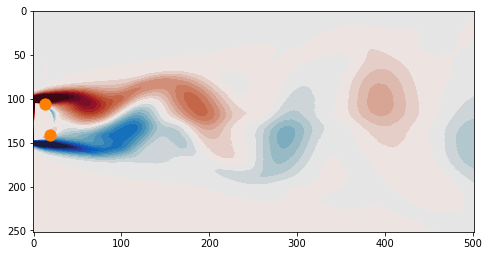

reconstruction 335
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/transient/mthd__snr/sd/im_true_transient_mthd__snr_sd_s2_SNR76.pdf


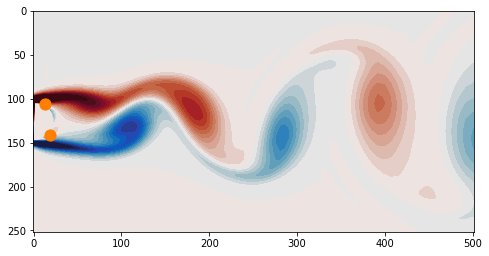

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.4014046249855778 ------------------------------------------------
no. of sensors: 2  SNR: 80
using previously loaded data
in autoencoder_train_data-- noise data SNR = 80
number of training samples: 1197
autoencoder oprating with dropout: 0.35
del_row = [399 400 401 798 799 800]
data_type: transient 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.21690625762276272 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR = 80
number of training samples: 1197
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.4326840988503174 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 1197
Error:  0.4014081081900048 ------------------------------------------------


In [ ]:
def transient_mthd__snr():
  args.data_type = 'transient' 
  args.exp = 'mthd__snr'

  # num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 200, 25, 200
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)


  # for s in [1, 2]:#, 8, 16, 32, 64]:

  #     # num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, 25
  #     # ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  #     # num_epochs, lr, bn  = 700, 0.0009, 25
  #     # PDS_train(s, bn, num_epochs, lr)

      # num_epochs, lr, wd  = 600, 0.0009, 1e-4
      # SD_train(s, num_epochs, lr, wd, drop=0.1)

  SNR_range = range(20, 84, 4)
  error = np.zeros((3, len(SNR_range)))
  plot_s_list = np.array([1, 2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([335])
  plot_SNR = np.array([28, 76])
  
  for s in [1, 2]:
    for SNR, i in zip(SNR_range, count(0, 1)):
      seq_len, bn, plot, save = 7, 25, (1, 1, 1), (1, 1, 1)
      print('no. of sensors:', s, ' SNR:', SNR)

      er1 = ARE_test(s, seq_len, bn,
                    plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list, 
                    plot_seq_len_list=plot_seq_len_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)
      
      er2 = PDS_test(s, bn, plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      er3 = SD_test(s, plot, save,
                    drop=0.1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      error[:, i] = [er1, er2, er3]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_{}.csv".format(args.RNN, s)), error, delimiter=",")

transient_mthd__snr()

sensor and sequence len.

In [ ]:
def transient_snsr__seq_len():
  args.data_type = 'transient' 
  args.exp = 'snsr__seq_len'

  num_epochs, lr, bs, bsv, bn, early_stop = 1300, 0.0007, 399, 133, 25, 200
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0)

  for s in [1, 2, 5, 10]:
    for seq_len in [3, 5, 7, 9]:

        num_epochs, lr, hidden_size, s, bn  = 2700, 0.0008, 50, s, 25
        ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  error = np.zeros((4, 4))
  plot_s_list = np.array([1, 2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([335])  
  plot_SNR = np.array([28, 76])

  for SNR in [None]:  
    for s, j in zip([1, 2, 5, 10], count(0, 1)):
      for seq_len, i in zip([3, 5, 7, 9], count(0, 1)):  
        bn, plot, save = (25, (1, 1, 0), (1, 1, 0))
        print('\n no. of sensors:',s,' seq_len:',seq_len)
        
        er1 = ARE_test(s, seq_len, bn,
                       plot, save,
                       plot_s_list=plot_s_list, 
                       plot_seq_len_list=plot_seq_len_list,
                       plot_image_idx=plot_image_idx)
        
        # er1 = ARE_test(s, seq_len, bn,
        #                plot, save,
        #                drop=0.35, SNR=SNR,
        #                plot_s_list=plot_s_list, 
        #                plot_seq_len_list=plot_seq_len_list,
        #                plot_image_idx=plot_image_idx,
        #                plot_SNR=plot_SNR)

        error[j, i] = er1

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_SNR{}.csv".format(args.RNN, SNR)), error, delimiter=",")

transient_snsr__seq_len()

## SST

method and sensors

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
autoencoder oprating without dropout layer
data_type: sea_temp 
 using lstm cell
autoencoder oprating without dropout layer
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 7


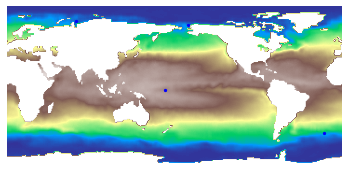

reconstruction 64799


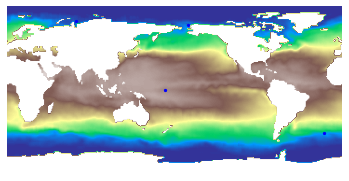

Error:  0.05509645549269464 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 10


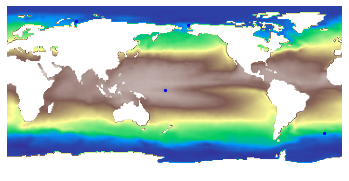

reconstruction 64799


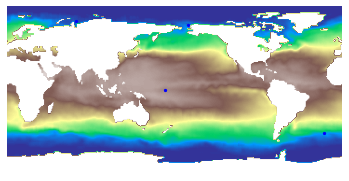

Error:  0.05436578708272454 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
shallow_decoder oprating without drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


reconstruction 10


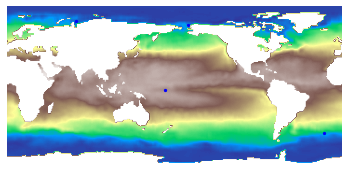

reconstruction 64799


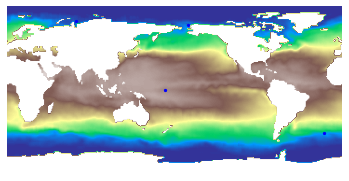

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.056831982903528956 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
autoencoder oprating without dropout layer
data_type: sea_temp 
 using lstm cell
autoencoder oprating without dropout layer
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.05125875577855618 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.04991558946981039 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
shallow_decoder oprating w

In [ ]:
# del args.raw_data
def sst_mthd__snsr():
  args.data_type = 'sea_temp' 
  args.exp = 'mthd__snsr'

  # num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 100, 25, 100
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0)

  # # for s in [4]:
  # for s in [4, 8, 16, 32]:

  #     num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, 25
  #     ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0)

  #     num_epochs, lr, bn  = 700, 0.0007, 25
  #     PDS_train(s, bn, num_epochs, lr)

  #     num_epochs, lr, wd  = 600, 0.0009, 1e-4
  #     SD_train(s, num_epochs, lr, wd)

  error = np.zeros((3, 4))
  plot_s_list = np.array([4])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([10])  # 5

  # for s, i in zip([1], count(0, 1)):  
  for s, i in zip([4, 8, 16, 32], count(0, 1)):  
    seq_len, bn, plot, save, use_stats = 7, 25, (1, 1, 0), (0, 0), 1

    er1 = ARE_test(s, seq_len, bn,
                  plot, save,
                  plot_s_list=plot_s_list, 
                  plot_seq_len_list=plot_seq_len_list,
                  plot_image_idx=plot_image_idx,
                  use_stats=use_stats)
    
    er2 = PDS_test(s, bn, plot, save,
                   plot_s_list=plot_s_list,
                   plot_image_idx=plot_image_idx,
                   use_stats=use_stats)

    er3 = SD_test(s, plot, save,
                  plot_s_list=plot_s_list,
                  plot_image_idx=plot_image_idx,
                  use_stats=use_stats)

    error[:, i] = [er1, er2, er3]

  error_path = get_path('', 'P')
  np.savetxt(osp.join(error_path, "error_{}_seq_len{}.csv".format(args.RNN, seq_len)), error, delimiter=",")

sst_mthd__snsr()

method and sensor at certain noise level

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
autoencoder oprating with dropout: 0.35
(0) Training Loss: 3.55183244 NEW Valid Loss: 4.41900969 *
(1) Training Loss: 3.56186390 Valid Loss: 3.60312319 
(2) Training Loss: 3.52688003 NEW Valid Loss: 3.53889894 *
(3) Training Loss: 3.48260617 NEW Valid Loss: 3.43636036 *
(4) Training Loss: 3.41523433 NEW Valid Loss: 3.27936602 *
(5) Training Loss: 3.31716728 NEW Valid Loss: 3.05065870 *
(6) Training Loss: 3.18910933 NEW Valid Loss: 2.74906754 *
(7) Training Loss: 3.00631404 NEW Valid Loss: 2.40844250 *
(8) Training Loss: 2.79393697 NEW Valid Loss: 2.08641052 *
(9) Training Loss: 2.54245138 NEW Valid Loss: 1.87859106 *
(10) Training Loss: 2.26217365 NEW Valid Loss: 1.95660472 *
(11) Training Loss: 1.95834160 NEW Valid Loss: 2.54390669 *
(12) Training Loss: 1.69005060 NEW Valid Loss: 3.85541272 *
(13) Training Loss: 1.46643734 NEW Valid Loss: 5.85762310 *
(14) Training Loss: 1.33462906 N

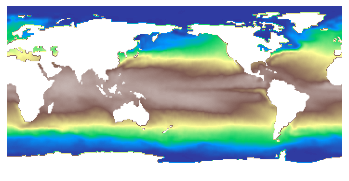

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__snsr_with_noise/are/autoencoder/best_train_in.pdf


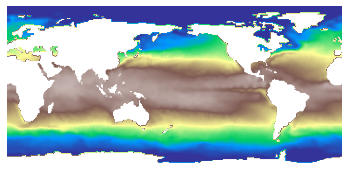

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__snsr_with_noise/are/autoencoder/best_valid_out.pdf


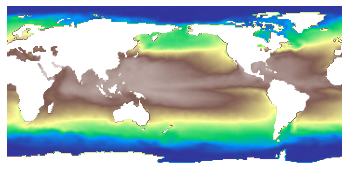

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__snsr_with_noise/are/autoencoder/best_valid_in.pdf


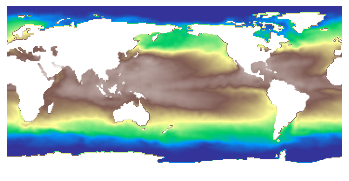

==========weights saved==========
================================ over ================================
sensor_number = 4 seq_len =  7
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
autoencoder oprating with dropout: 0.35
(397, 16) (397, 25) (97, 16) (97, 25)
397 97
data_type: sea_temp 
 using lstm cell
(699) BEST_Training Loss: 0.15966953 BEST_Valid Loss: 1.05926514 
=========saved weights=========
================================ over ================================
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
=========saved weights=========
================================ over ================================
sensor_number = 4
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


(12) Training Loss: 0.58917004 Valid Loss: 1.07648921 
(13) Training Loss: 0.59028471 Valid Loss: 1.07797468 
(18) Training Loss: 0.56687951 Valid Loss: 1.09648633 
(22) Training Loss: 0.54005319 Valid Loss: 1.08509779 
(23) Training Loss: 0.55592984 Valid Loss: 1.09565687 
(24) Training Loss: 0.54482806 Valid Loss: 1.08371842 
(25) Training Loss: 0.55275071 Valid Loss: 1.08147788 
(28) Training Loss: 0.53197628 Valid Loss: 1.08426464 
(30) Training Loss: 0.52621663 Valid Loss: 1.11427987 
(31) Training Loss: 0.52097356 Valid Loss: 1.09011328 
(35) Training Loss: 0.51332587 Valid Loss: 1.11327016 
(37) Training Loss: 0.50760227 Valid Loss: 1.10176265 
(40) Training Loss: 0.51259291 Valid Loss: 1.08851147 
(41) Training Loss: 0.51979256 Valid Loss: 1.09810698 
(42) Training Loss: 0.50292915 Valid Loss: 1.13707173 
(43) Training Loss: 0.50822884 Valid Loss: 1.11105704 
(44) Training Loss: 0.50073886 Valid Loss: 1.13172412 
(45) Training Loss: 0.50118870 Valid Loss: 1.09013009 
(46) Train

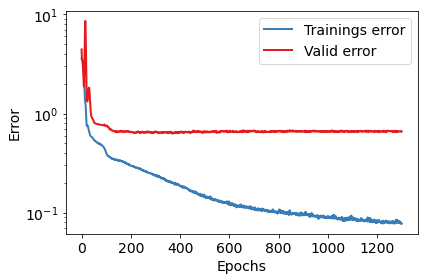

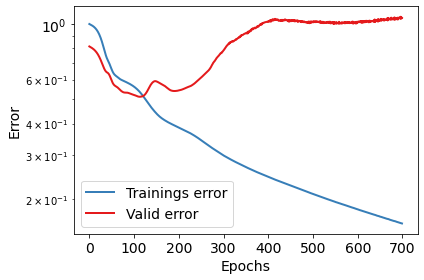

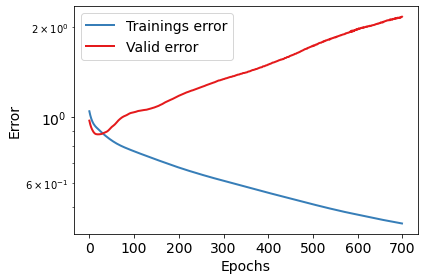

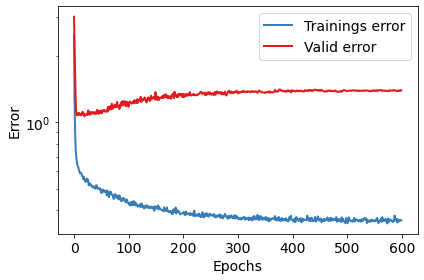

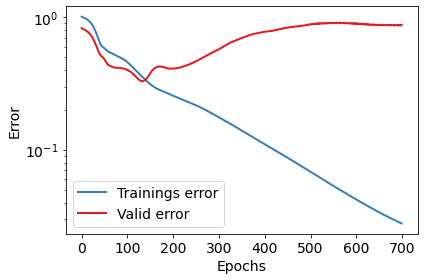

...

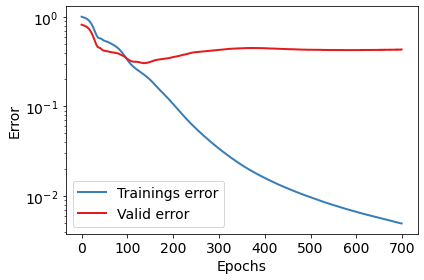

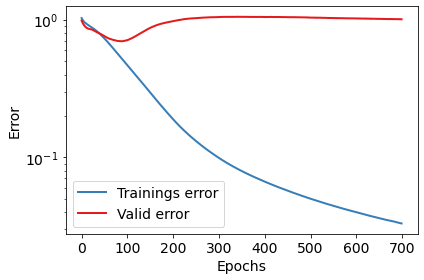

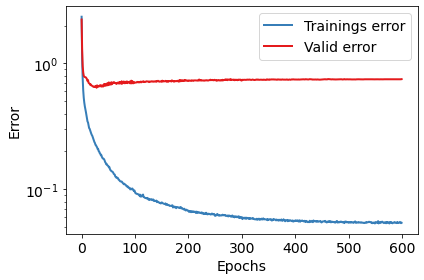

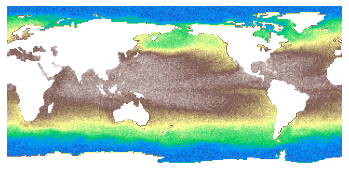

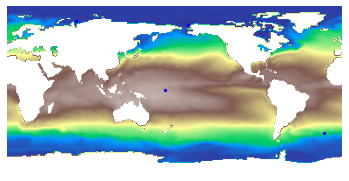

reconstruction 64799
Error:  0.07790843926933765 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 20
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__snsr_with_noise/pds/im_sea_temp_mthd__snsr_with_noise_pds_s4.pdf


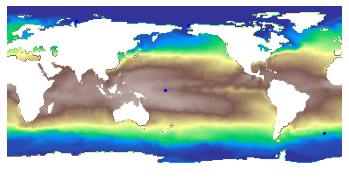

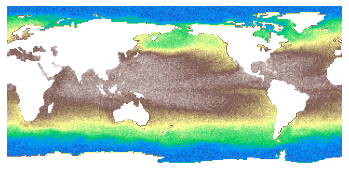

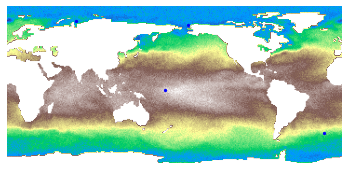

reconstruction 64799
Error:  0.11168595320863776 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
shallow_decoder oprating with drop
reconstruction 20
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__snsr_with_noise/sd/im_sea_temp_mthd__snsr_with_noise_sd_s4.pdf


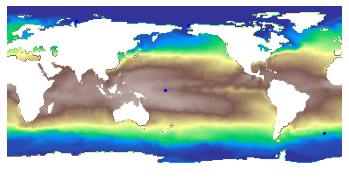

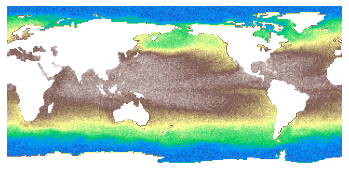

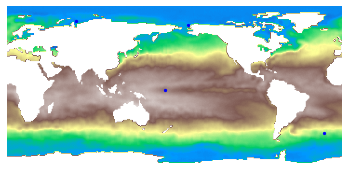

reconstruction 64799
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.09689581875801272 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.06253478837080884 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.10114061419428257 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data S

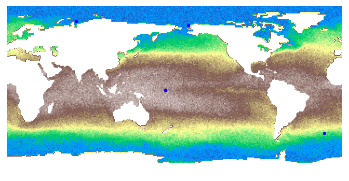

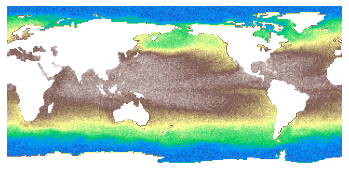

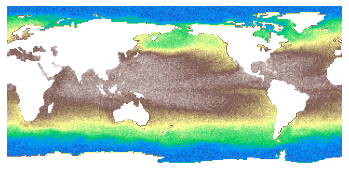

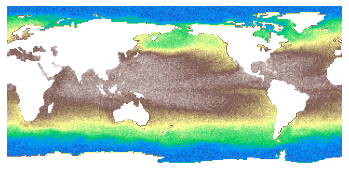

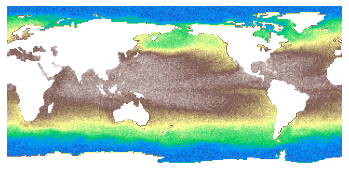

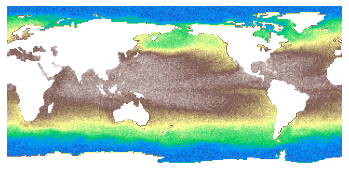

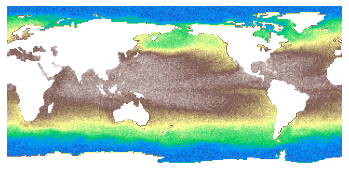

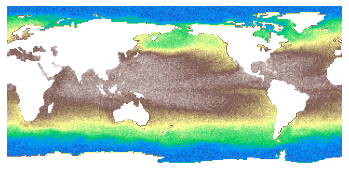

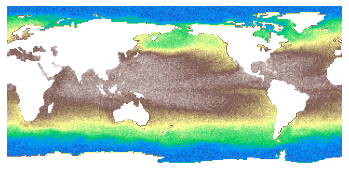

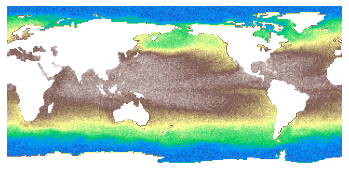

In [ ]:
def sst_mthd__snsr_with_noise():
  args.data_type = 'sea_temp' 
  args.exp = 'mthd__snsr_with_noise'

  num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 100, 25, 100
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)

  for s in [4, 8, 16, 32]:

      num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, 25
      ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

      num_epochs, lr, bn  = 700, 0.0007, 25
      PDS_train(s, bn, num_epochs, lr)

      num_epochs, lr, wd  = 600, 0.0009, 1e-4
      SD_train(s, num_epochs, lr, wd, drop=0.1)

  error = np.zeros((3, 4))
  plot_s_list = np.array([4])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([20])  # 5
  plot_SNR = np.array([20])

  for SNR in [10, 20, 30]:  
    for s, i in zip([4, 8, 16, 32], count(0, 1)):  
      seq_len, bn, plot, save, use_stats = 7, 25, (1, 0, 0), (1, 0, 0), 1

      er1 = ARE_test(s, seq_len, bn,
                      plot, save,
                      drop=0.35, SNR=SNR,
                      plot_s_list=plot_s_list, 
                      plot_seq_len_list=plot_seq_len_list,
                      plot_image_idx=plot_image_idx,
                      plot_SNR=plot_SNR,
                      use_stats=use_stats)
        
      er2 = PDS_test(s, bn, plot, save,
                    SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR,
                    use_stats=use_stats)

      er3 = SD_test(s, plot, save,
                    drop=0.1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR,
                    use_stats=use_stats)

      error[:, i] = [er1, er2, er3]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_seq_len{}_SNR{}.csv".format(args.RNN, seq_len, SNR)), error, delimiter=",")

sst_mthd__snsr_with_noise()

method and bottle neck

using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 37
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


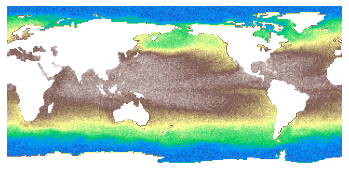

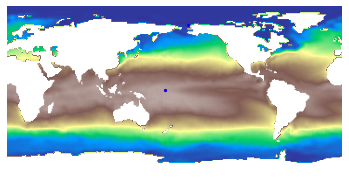

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_true_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


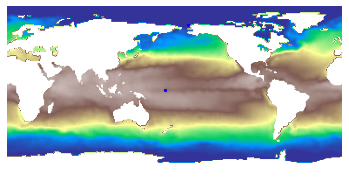

Error:  0.0840476598712562 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 40
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_sea_temp_mthd__bn_pds_s2.pdf


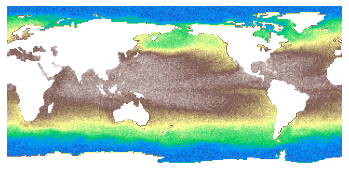

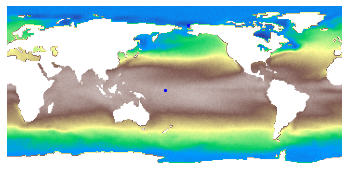

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_true_sea_temp_mthd__bn_pds_s2.pdf


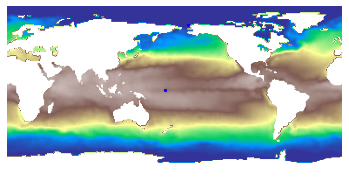

Error:  0.10352546965007495 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 37
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


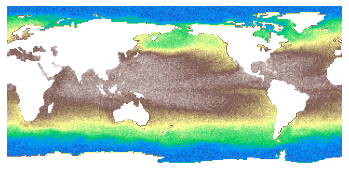

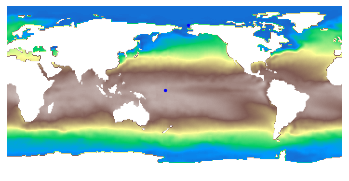

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_true_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


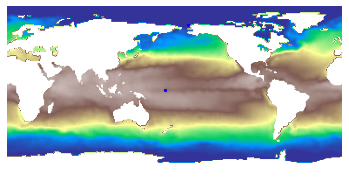

Error:  0.08477332794287495 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 40
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_sea_temp_mthd__bn_pds_s2.pdf


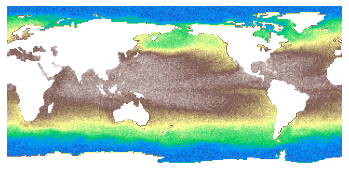

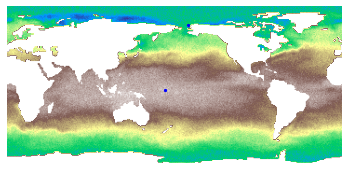

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_true_sea_temp_mthd__bn_pds_s2.pdf


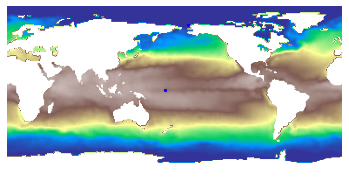

Error:  0.11539419162667207 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 37
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


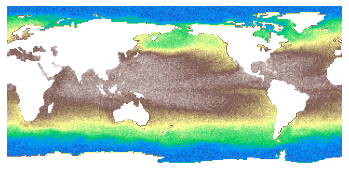

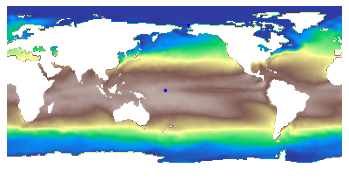

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_true_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


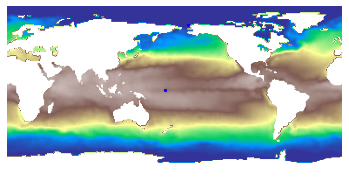

Error:  0.08012738671527317 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 40
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_sea_temp_mthd__bn_pds_s2.pdf


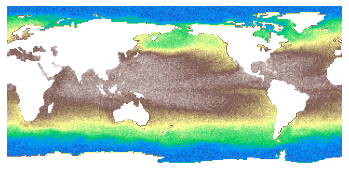

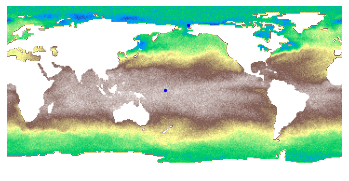

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_true_sea_temp_mthd__bn_pds_s2.pdf


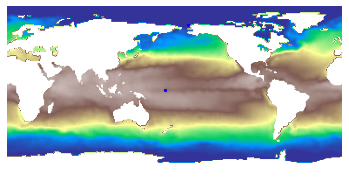

Error:  0.11612129294300662 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 37
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


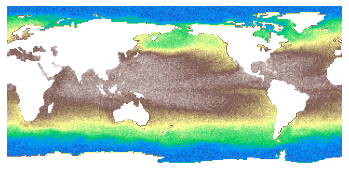

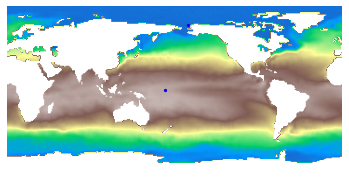

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/are/online/lstm/im_true_sea_temp_mthd__bn_are_s2_sq7_i40.pdf


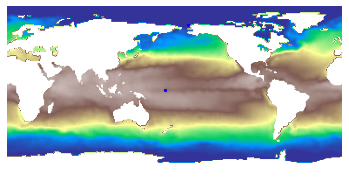

Error:  0.08072645143307901 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
reconstruction 40
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_sea_temp_mthd__bn_pds_s2.pdf


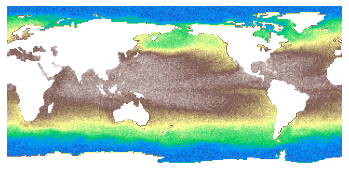

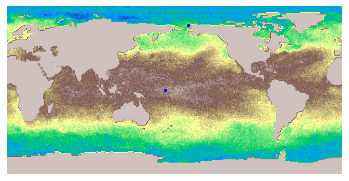

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/mthd__bn/pds/im_true_sea_temp_mthd__bn_pds_s2.pdf


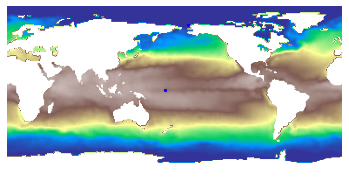

Error:  0.12219351413018234 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.08341159592169463 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.10420540438368198 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  20
reconstruction 0
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using

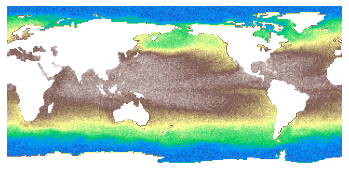

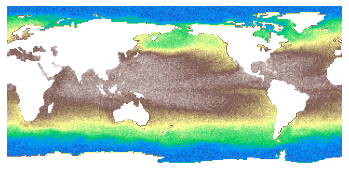

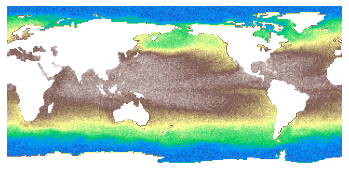

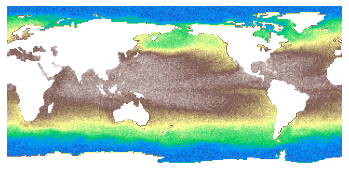

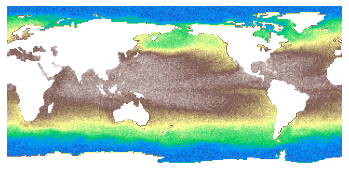

...

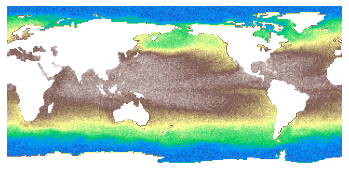

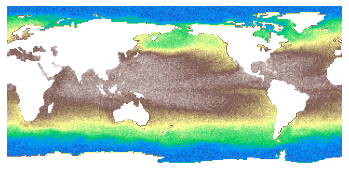

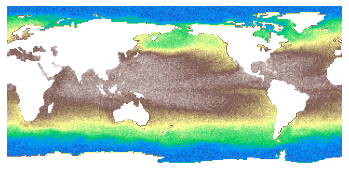

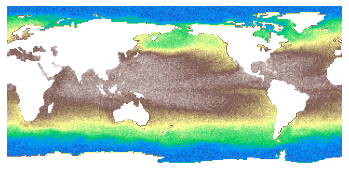

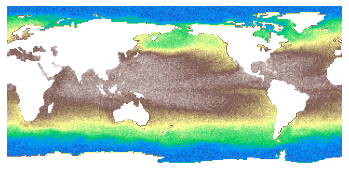

In [ ]:
def sst_mthd__bn():
  args.data_type = 'sea_temp' 
  args.exp = 'mthd__bn'

  # for bn in [5, 15, 25, 50]:

  #   num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 100, bn, 100
  #   AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)

  #   for s in [2, 4, 8]:

  #     num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, bn
  #     ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  #     num_epochs, lr, bn  = 700, 0.0009, bn
  #     PDS_train(s, bn, num_epochs, lr)

  error = np.zeros((2, 4))
  plot_s_list = np.array([2])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([40])  # 5
  plot_SNR = np.array([20])
  
  for s in [2, 4, 8]:
    for bn, i in zip([5, 15, 25, 50], count(0, 1)): 

      seq_len, bn, plot, save, use_stats, SNR = 7, bn, (1, 1, 0), (1, 1, 0), 1, 20

      er1 = ARE_test(s, seq_len, bn,
                    plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list, 
                    plot_seq_len_list=plot_seq_len_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)
      
      er2 = PDS_test(s, bn, plot, save,
                    SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)
      
      error[:, i] = [er1, er2]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_{}.csv".format(args.RNN, s)), error, delimiter=",")


sst_mthd__bn()

method and SNR(signal to noise ratio)

In [ ]:
def sst_mthd__snr():
  args.data_type = 'sea_temp' 
  args.exp = 'mthd__snr'

  # num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 100, 25, 100
  # AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)


  # for s in [1, 2, 4]:  # , 4, 64]:

  #     num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, 25
  #     ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  #     num_epochs, lr, bn  = 700, 0.0009, 25
  #     PDS_train(s, bn, num_epochs, lr)

  #     num_epochs, lr, wd  = 500, 0.0009, 1e-4
  #     SD_train(s, num_epochs, lr, wd, drop=0.1)

  SNR_range = range(5, 80, 5)
  error = np.zeros((3, len(SNR_range)))
  plot_s_list = np.array([4])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([20])
  plot_SNR = np.array([10, 70])
  
  for s in [1, 2, 4]:
    for SNR, i in zip(SNR_range, count(0, 1)):
      seq_len, bn, plot, save, use_stats = 7, 25, (1, 1, 0), (1, 1, 0), 1

      er1 = ARE_test(s, seq_len, bn,
                    plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list, 
                    plot_seq_len_list=plot_seq_len_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)
      
      er2 = PDS_test(s, bn, plot, save,
                    SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      er3 = SD_test(s, plot, save,
                    drop=0.1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      error[:, i] = [er1, er2, er3]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_{}.csv".format(args.RNN, s)), error, delimiter=",")

sst_mthd__snr()

NameError: ignored

In [ ]:
im=np.zeros_like(recon); im[np.where(recon==35)[0]]=1; plt.imshow(im.reshape(180, 360), cmap='terrain'); plt.show()

using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
autoencoder oprating with dropout: 0.35
(0) Training Loss: 3.55197072 NEW Valid Loss: 4.27964354 *
(1) Training Loss: 3.55783987 Valid Loss: 3.58130789 
(2) Training Loss: 3.51405883 NEW Valid Loss: 3.49231410 *
(3) Training Loss: 3.45538259 NEW Valid Loss: 3.35490036 *
(4) Training Loss: 3.37070584 NEW Valid Loss: 3.15182996 *
(5) Training Loss: 3.25025892 NEW Valid Loss: 2.87657475 *
(6) Training Loss: 3.09238482 NEW Valid Loss: 2.54303670 *
(7) Training Loss: 2.89237976 NEW Valid Loss: 2.19320250 *
(8) Training Loss: 2.64185214 NEW Valid Loss: 1.91326964 *
(9) Training Loss: 2.36362743 NEW Valid Loss: 1.86492705 *
(10) Training Loss: 2.06348944 NEW Valid Loss: 2.28884554 *
(11) Training Loss: 1.76510370 NEW Valid Loss: 3.43896699 *
(12) Training Loss: 1.52362025 NEW Valid Loss: 5.41774225 *
(13) Training Loss: 1.35633516 NEW Valid Loss: 7.74960089 *
(14) Training Loss: 1.29014111 N

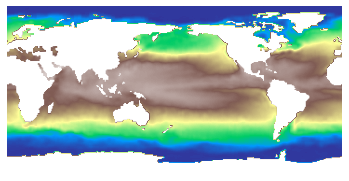

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/rndm_trials/are/autoencoder/best_train_in.pdf


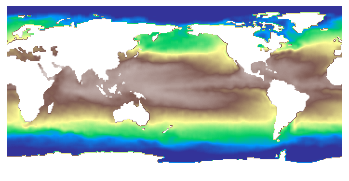

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/rndm_trials/are/autoencoder/best_valid_out.pdf


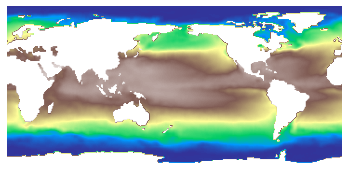

reconstruction 64799
SAVED == ../content/drive/My Drive/Colab Notebooks/are/weights_results/sea_temp/rndm_trials/are/autoencoder/best_valid_in.pdf


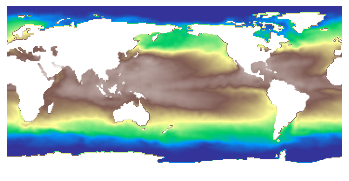

==========weights saved==========
================================ over ================================
sensor_number = 1 seq_len =  7
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
autoencoder oprating with dropout: 0.35
(397, 4) (397, 25) (97, 4) (97, 25)
397 97
data_type: sea_temp 
 using lstm cell
(699) BEST_Training Loss: 0.47336990 BEST_Valid Loss: 0.37298265 
=========saved weights=========
================================ over ================================
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
=========saved weights=========
================================ over ================================
sensor_number = 1
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
shallow_decoder oprating with drop


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


(7) Training Loss: 0.86034667 Valid Loss: 1.10627866 
(9) Training Loss: 0.83791065 Valid Loss: 1.10064816 
(10) Training Loss: 0.86277527 Valid Loss: 1.09882379 
(12) Training Loss: 0.84897995 Valid Loss: 1.09697962 
(14) Training Loss: 0.82565254 Valid Loss: 1.08690929 
(16) Training Loss: 0.80675673 Valid Loss: 1.07556379 
(17) Training Loss: 0.82604671 Valid Loss: 1.07484722 
(18) Training Loss: 0.81908673 Valid Loss: 1.07317650 
(19) Training Loss: 0.81785017 Valid Loss: 1.07432783 
(22) Training Loss: 0.84437484 Valid Loss: 1.07504356 
(23) Training Loss: 0.82200116 Valid Loss: 1.07672477 
(24) Training Loss: 0.81973386 Valid Loss: 1.08408666 
(25) Training Loss: 0.82468444 Valid Loss: 1.07542980 
(26) Training Loss: 0.82358694 Valid Loss: 1.08002031 
(27) Training Loss: 0.81680149 Valid Loss: 1.06777930 
(28) Training Loss: 0.80726141 Valid Loss: 1.07342470 
(30) Training Loss: 0.80985129 Valid Loss: 1.06479597 
(31) Training Loss: 0.79865593 Valid Loss: 1.06042814 
(32) Trainin

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.37087390995917446 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  10
reconstruction 0
number of training samples: 400
shallow_decoder oprating with drop
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.245356787895737 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  15
number of training samples: 400
autoencoder oprating with dropout: 0.35
data_type: sea_temp 
 using lstm cell
autoencoder oprating with dropout: 0.35
using previously loaded data
in autoencoder_train_data-- no noise data
number of training samples: 400
Error:  0.0931781548100281 ------------------------------------------------
using previously loaded data
in autoencoder_train_data-- noise data SNR:  1

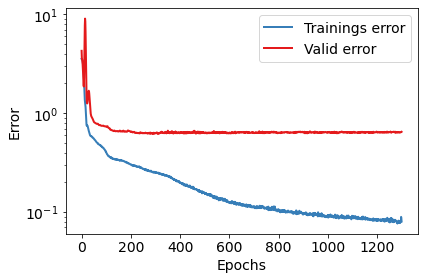

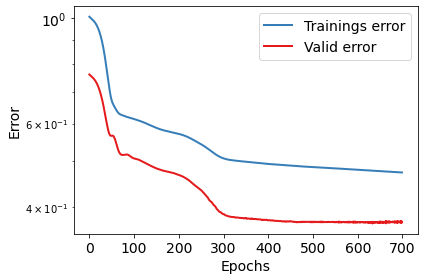

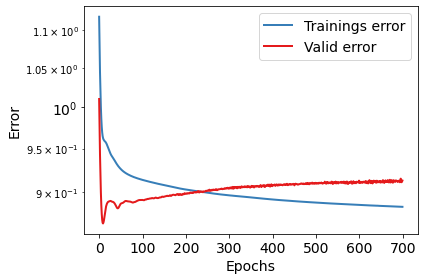

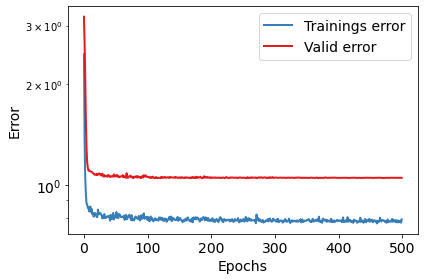

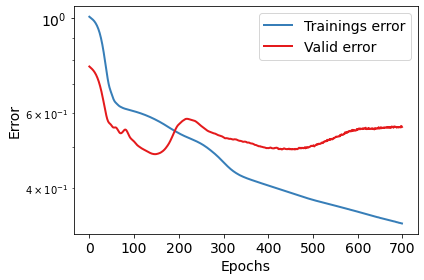

...

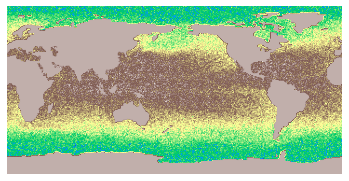

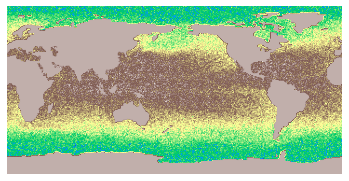

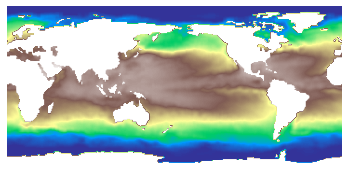

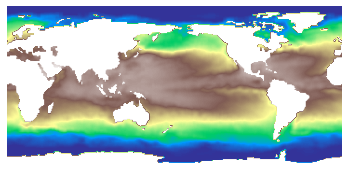

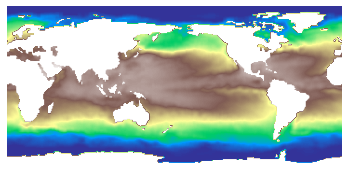

In [ ]:
def sst_rndm_trials():
  args.data_type = 'sea_temp' 
  args.exp = 'rndm_trials'

  num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 100, 25, 100
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)


  for s in [1, 2, 4, 8]:  # , 4, 64]:

      num_epochs, lr, hidden_size, seq_len, bn  = 700, 0.0006, 50, 7, 25
      ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

      num_epochs, lr, bn  = 700, 0.0009, 25
      PDS_train(s, bn, num_epochs, lr)

      num_epochs, lr, wd  = 500, 0.0009, 1e-4
      SD_train(s, num_epochs, lr, wd, drop=0.1)

  SNR_range = range(5, 80, 5)
  error = np.zeros((3, len(SNR_range)))
  plot_s_list = np.array([4])
  plot_seq_len_list = np.array([7])
  plot_image_idx = np.array([20])
  plot_SNR = np.array([10, 70])
  
  for s in [1, 2, 4, 8]:
    for SNR, i in zip(SNR_range, count(0, 1)):
      seq_len, bn, plot, save, use_stats = 7, 25, (0, 0, 0), (0, 0, 0), 1

      er1 = ARE_test(s, seq_len, bn,
                    plot, save,
                    drop=0.35, SNR=SNR,
                    plot_s_list=plot_s_list, 
                    plot_seq_len_list=plot_seq_len_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)
      
      er2 = PDS_test(s, bn, plot, save,
                    SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      er3 = SD_test(s, plot, save,
                    drop=0.1, SNR=SNR,
                    plot_s_list=plot_s_list,
                    plot_image_idx=plot_image_idx,
                    plot_SNR=plot_SNR)

      error[:, i] = [er1, er2, er3]

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_{}.csv".format(args.RNN, s)), error, delimiter=",")

sst_rndm_trials()

sensor and sequence len.

In [ ]:
def sst_snsr__seq_len():
  args.data_type = 'sea_temp' 
  args.exp = 'snsr__seq_len'

  num_epochs, lr, bs, bsv, bn, early_stop  = 1300, 0.0007, 400, 100, 25, 100
  AutoEcoder(bn, lr, num_epochs, bs, bsv, early_stop, drop=0.35)

  for s in [2, 4, 8, 16]:
    for seq_len in [5, 7, 9, 11, 13]:

        num_epochs, lr, hidden_size, s, bn  = 700, 0.0006, 50, s, 25
        ARE_train_LSTM(s, seq_len, bn, hidden_size, num_epochs, lr, drop=0.35)

  error = np.zeros((5, 5))
  plot_s_list = np.array([16])
  plot_seq_len_list = np.array([0])
  plot_image_idx = np.array([20])  # 5
  plot_SNR = np.array([50])

  for SNR in [10, 20, 30]:  
    for s, j in zip([2, 4, 8, 16], count(0, 1)):
      for seq_len, i in zip([5, 7, 9, 11, 13], count(0, 1)):  
        bn, plot, save = (25, (1, 1, 0), (1, 1, 0)) if s in [4] else (25, (0, 0, 0), (0, 0, 0)) 
        print('\n no. of sensors:',s,' seq_len:',seq_len)
        
        er1 = ARE_test(s, seq_len, bn,
                       plot, save,
                       drop=0.35, SNR=SNR,
                       plot_s_list=plot_s_list, 
                       plot_seq_len_list=plot_seq_len_list,
                       plot_image_idx=plot_image_idx,
                       plot_SNR=plot_SNR)

        error[j, i] = er1

    error_path = get_path('', 'P')
    np.savetxt(osp.join(error_path, "error_{}_SNR{}.csv".format(args.RNN, SNR)), error, delimiter=",")

sst_snsr__seq_len()

# Recycle Bin

In [ ]:
""" testing sensor locations in get_data() """

#####################################              

      recon = np.ones((m*n))*35
      for i, j in zip(args.sea_idx, count(0, 1)):
        recon[i] = args.raw_data[0][j]

      idices = np.arange(0, 44219)
      np.random.seed(323)  # changing seed will change the postion of sensors and networks will have to be retrained
      s_idx_in_flatten = np.random.choice(idices, 500, False)

      flat_sea_mask = np.zeros((44219))
      flat_sea_mask[s_idx_in_flatten] = 1
      # flat_sea_mask = np.ones((44219))
      flat_mask = np.zeros((m*n))
      for i, j in zip(args.sea_idx, count(0, 1)):
        flat_mask[i] = flat_sea_mask[j]

      mask = flat_mask.reshape(n, m)
      cords = np.where(mask == 1)
      cords = np.asarray(cords)

      recon = np.ones((m*n))*35
      for i, j in zip(args.sea_idx, count(0, 1)):
        recon[i] = args.raw_data[0][j]

      recon_im = recon.reshape(n, m)
      
      plt.figure()
      plt.imshow(recon_im, cmap='terrain')
      plt.gca().invert_yaxis()
      plt.scatter(cords[1], cords[0], marker='.', color='b', s=5, zorder=5) if cords.any() else 0
      
      
      plt.show()
      plt.close()

      
      
      pdb.set_trace()
      ######################################

In [ ]:
""" FR_PDS """

if args.data_type == 'periodic':   
  def FR_PDS(sensor_number, bottle_neck, **kwargs): 
    pretrained_weights = osp.join(folder, 'PDSweights_s{}_bn{}_Ds'.format(sensor_number, bottle_neck))
    gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord,phi,mean = PDS_train_data(sensor_number,bottle_neck, 
                                                                                                                        drop=kwargs.get('drop',None), 
                                                                                                                        SNR=kwargs.get('SNR',None), 
                                                                                                                        data_noise =kwargs.get('drop',None))
    del(gtrain_out, gvalid_out, strain_in, svalid_in)
    # Setting up the neural network
    modell = PDSnetwork(sensor_number, bottle_neck)

    # Load saved neural network weights
    modell.load_state_dict(torch.load(pretrained_weights))
    modell.eval()

    # Load snapshots of sensor data and gc for testing
    test = sensorgcdatasetDS(stest_in_stacked, gtest_stan)
    #print(stest_in_stacked.shape)
    #print( gtest_stan.shape)

    gc_pred = np.zeros([len(test), bottle_neck])
    gc_pod = np.zeros([len(test), bottle_neck])
    for i, (sensor, gc) in enumerate(test):
        y = modell(sensor)
        gc_out = y.data.numpy()
        gc_pred[i, :] = gc_out
        gcc = gc.data.numpy()
        gc_pod[i, :] = gcc

    #print(gc_pred)
    #acc_avg = np.mean(err)
    gc_pred = gc_pred * gstats[1, :] + gstats[0, :]
    gc_pod = gc_pod*gstats[1, :] + gstats[0, :]

    trainAE, validAE, testAE, stats = autoencoder_train_data(drop=0, SNR=kwargs.get('SNR',10))
    mean = np.mean(trainAE, axis = 0)
    #X = trainAE - mean
    #X = X.transpose()
    #phi, s, V = np.linalg.svd(X,full_matrices=False)
    del(trainAE,validAE)
    #phi = phi[:,0:bottle_neck]

    t_pred = gc_pred.dot(phi.T) 
    t_true = testAE - mean#np.mean(total[:,:].transpose(), axis = 1)

    t_pred = gc_pred.dot(phi.T) + mean#np.mean(total[:,:].transpose(), axis = 1)
    t_pod = gc_pod.dot(phi.T) + mean#np.mean(total[:,:].transpose(), axis = 1)
    t_true = testAE

    #gc_pod = gtest_out*gstats[1, :] + gstats[0, :]
    #t_pred = gc_pod.dot(phi.T) + mean
    #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
    #print(error)

    #plot_image(t_pred,t_true, stats)


    Terr = []
    for i in range(0,60):
        Terr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

    Terr_avg = np.mean(Terr)
    print("Error",sensor_number, Terr_avg)

    #nx=299 ny=251 ns = nx*ny
    m,n = mn()
    ny,nx = m,n
    x2 = np.arange(0, ny, 1)
    y2 = np.arange(0, nx, 1)
    mX, mY = np.meshgrid(x2, y2)

    for i in [39] :
      # continue
      print(i)
      t_predd = t_pred[i,:].reshape((ny, nx))
      minmax = np.max(np.abs(t_predd)) * 0.65
      plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
      im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
      plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
      # im_name = 'im_PDSv3_s{}_Ds_noise.eps'.format(sensor_number)
      im_name = 'im_PDSv3_s{}_Ds_SNR{}.eps'.format(sensor_number, SNR)
      jjkjkj = osp.join(folder_save_results, dir1)
      plt.savefig(osp.join(jjkjkj, '{}'.format(im_name, kwargs.get('SNR',10))) ,format='eps')
      print('SAVED -', osp.join(jjkjkj, '{}'.format(im_name, kwargs.get('SNR',10))))
      plt.show()
      #plt.pcolormesh(t_predd.T, cmap=plt.cm.jet, vmin=-0.0003, vmax=0.0003)
      #plt.pcolormesh(t_predd.T)
      #plt.show()
      #********************************************************
      # t_podd = t_pod[i,:].reshape((ny, nx))
      # minmax = np.max(np.abs(t_podd)) * 0.65
      # plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
      # im = plt.imshow(t_podd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      # plt.contourf(mX, mY, t_podd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
      # plt.show()
      #********************************************************  
      t_truee = t_true[i,:].reshape((ny, nx))
      minmax = np.max(np.abs(t_truee)) * 0.65
      plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
      im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
      if s == 1:
        im_name = 'im_true_39_Ds.eps'
        # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4/pr/{}'.format(im_name),format='eps')
        # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/pr/{}'.format(im_name))

      # plt.show()
    del(t_pred,t_pod,t_true)

    return Terr_avg

using previously loaded data


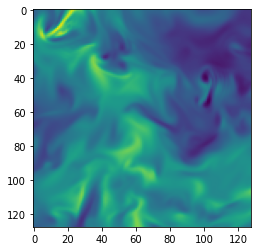

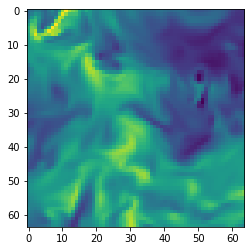

(25, 64, 64)


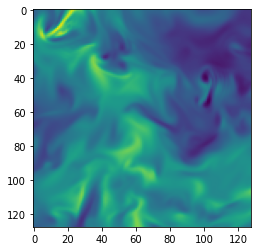

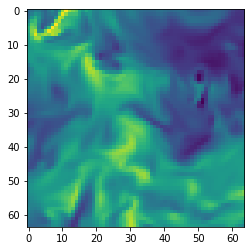

True

In [ ]:
""" testing skimage resize for turbulence """

get_data()
t = args.raw_data[20].reshape((128, 128)) 
from skimage.transform import resize
tr = resize(t, (64, 64))
tr1 = resize(t, (64, 64))

plt.figure()
plt.imshow(t)
plt.figure()
plt.imshow(tr)
plt.show()

(tr==tr1).any()

t1 = args.raw_data[0:25].reshape((25, 128, 128)) 
tr2 = resize(t1, (25, 64, 64))

print(tr2.shape)

plt.figure()
plt.imshow(t1[20])
plt.figure()
plt.imshow(tr2[20])
plt.show()

(tr==tr2).any()

In [ ]:
""" ADE network """

class ADEnetwork(nn.Module): 

    def __init__(self, sensor_number,bottle_neck):
        super(ADSnetwork, self).__init__()

        if args.data_type == 'transient':
          H = 200
        if args.data_type == 'periodic':
          H = 50

        self.layer1 = nn.Linear(sensor_number, H, bias=True)
        self.layer2 = nn.Linear(H, H, bias=True)
        #self.layer3 = nn.Linear(500, 100, bias=True)
        self.output = nn.Linear(H, bottle_neck, bias=True)
        #self.dropout = nn.Dropout(p=0.2)  # dropout after relu
        #self.bn = nn.BatchNorm1d(num_features=500)  # bn before relu

    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = F.relu(self.layer2(x))
        x = self.output(x)
        return x

In [ ]:
""" PDS_train_data """

if args.data_type == 'periodic':
  def PDS_train_data(sensor_num, bottle_neck, **kwargs):
    
    trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
    #total = np.concatenate((trainAE, validAE), axis=0)
    mean = np.mean(trainAE, axis = 0)
    X = trainAE - mean
    X = X.transpose()
    #phi = POD(X)
    phi, s, V = np.linalg.svd(X,full_matrices=False)
    del(s,V)
    phi = phi[:,0:bottle_neck]

    gtrain_transpose = np.dot(phi.transpose(),X)
    del(X)
    gtotal_out = gtrain_transpose.transpose()
    del(gtrain_transpose)
    gtrain_out = (gtotal_out - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)

    XX = validAE - np.mean(trainAE, axis = 0)
    XX = XX.transpose()
    gvalid_transpose = np.dot(phi.transpose(),XX)
    del(XX)
    gvalid_out = gvalid_transpose.transpose()
    del(gvalid_transpose)
    gvalid_out = (gvalid_out - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)

    XXX = testAE - np.mean(trainAE, axis = 0)
    XXX = XXX.transpose()
    gtest_transpose = np.dot(phi.transpose(),XXX)
    del(XXX)
    gtest_out = gtest_transpose.transpose()
    del(gtest_transpose)
    gtest_out = (gtest_out - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)
    
    gstats = np.array([np.mean(gtotal_out[:,:], axis = 0),np.std(gtotal_out[:,:], axis = 0)])
    del(gtotal_out)


    trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
    del(trainAE)
    validAE_stan = (validAE - stats[0, :])/stats[1, :]
    testAE_stan = (testAE - stats[0, :])/stats[1, :]
  
    del(validAE,testAE)


    n_snapshots_train, n_pix = trainAE_stan.shape
    n_snapshots_valid, _ = validAE_stan.shape
    n_snapshots_test, __ = testAE_stan.shape

    m, n = 251, 168
    sensor_num = sensor_num
    mask = np.zeros((m,n))
    x_cord =sensor_cord_data(sensor_num) 
    mask[x_cord[:,0], x_cord[:,1]] = 1
    pivots = np.where(mask.reshape(-1) == 1)
    pivots = np.asarray(pivots).ravel()


    strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
    #print(strain_in)
    svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
    stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
    #print(svalid_in.shape)

    gc_pod = gtest_out*gstats[1, :] + gstats[0, :]
    t_pred = gc_pod.dot(phi.T) + mean#np.mean(trainAE[:,:].transpose(), axis = 1)

    # nx=n
    # ny=m
    # x2 = np.arange(0, ny, 1)
    # y2 = np.arange(0, nx, 1)
    # mX, mY = np.meshgrid(x2, y2)
    
    #for i in range(310,355):
      #print(i)
      #t_predd = t_pred[i,:].reshape((ny, nx))
      #minmax = np.max(np.abs(t_predd)) * 0.65
      #plt.figure(facecolor="white",  edgecolor='k', figsize=(6,3))
      #im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      #plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
      #plt.show()

    del(trainAE_stan,validAE_stan,testAE_stan)#,t_pred)
    return gtrain_out, gvalid_out, strain_in, svalid_in, gtest_out, stest_in, gstats, x_cord,phi,mean   


In [ ]:
if args.data_type == 'periodic':   
  def PDS_train(sensor_number, bottle_neck):
    gtrain_out, gvalid_out, strain_DS, svalid_DS, gtest_stan, stest_DS, gstats, x_cord,phi,mean = PDS_train_data(sensor_number, bottle_neck)
    #print(gtrain_out,gtrain_out.shape)
    #print(gvalid_out,gvalid_out.shape)
    del(gtest_stan, stest_DS,phi,mean)
    train = sensorgcdatasetDS(strain_DS, gtrain_out)
    valid = sensorgcdatasetDS(svalid_DS, gvalid_out)

    # bs = 399  # batch size
    # bsv = 133
    bs = len(train)  # batch size
    bsv = len(valid)
    train_data_gen = torch.utils.data.DataLoader(train, shuffle=True, batch_size=bs)
    valid_data_gen = torch.utils.data.DataLoader(valid, shuffle=True, batch_size=bsv)
    
    dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
    dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}
    batch ={'train':bs, 'valid':bsv}

    model = PDSnetwork(sensor_number, bottle_neck).to(device)

    # Loss and Optimizer
    criterion = nn.MSELoss()
    #criterion = nn.L1Loss().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0009, weight_decay=1e-5)
    #optimizer = torch.optim.SGD(model.parameters(), lr=0.06, momentum=0.9)
    #exp_lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[500], gamma=0.1)


    num_epochs = 1200
    prev_loss = 100  # large number
    stop = 0
    rerror_train = []
    rerror_valid = []
    for epochs in range(num_epochs):
      for phase in ['train','valid']:
        running_loss=0
        if phase == 'train':
          model.train()
        else:
          model.eval()

        for i, (sensor, gc) in enumerate(dataloaders[phase]):
            sensor = Variable(sensor).to(device)
            gc = Variable(gc).to(device)
            #print(sensor,sensor.shape)
            #print(gc,gc.shape)

            # clear gradients
            optimizer.zero_grad()
            # forward
            gc_out = model(sensor)
            #print(gc_out,gc)

            # calculate loss
            loss = criterion(gc_out, gc)

            if phase=='train':
              #backward
              loss.backward()
              #update weights
              optimizer.step()
              #exp_lr_scheduler.step()
            

            running_loss = gc_out.shape[0] * loss.data + running_loss

        if phase == 'train':
          train_epoch_loss = running_loss/dataset_sizes[phase]
        elif phase == 'valid':
          valid_epoch_loss = running_loss/dataset_sizes[phase]
      stop = stop + 1

      if (valid_epoch_loss < prev_loss):
        model_wts = model.state_dict()
        #print('k.o.')
        prev_loss = valid_epoch_loss
        #print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
        stop = 0

      else:
        #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))

      if stop == 200:
          # print('Early stopping criteria fulfilled')
          break
      rerror_train.append(train_epoch_loss)
      rerror_valid.append(valid_epoch_loss)

    plot_graph(rerror_train,rerror_valid)
    model_wts = model.state_dict()
    torch.save(model_wts, '../content/drive/My Drive/Colab Notebooks/PDSweights_s{}_bn{}_Ds'.format(sensor_number, bottle_neck))


(427, 64800)
[ 1.0e+33  1.0e+33  1.0e+33 ... -1.8e+00 -1.8e+00 -1.8e+00]
(array([    0,     1,     2, ..., 62253, 62254, 62255]),)
(20581,)
[    0     1     2 ... 64797 64798 64799] [ 4483  4484  4485 ... 64797 64798 64799]
[35.  35.  35.  ... -1.8 -1.8 -1.8]
[False False False ...  True  True  True] 35.0


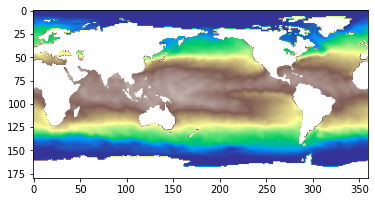

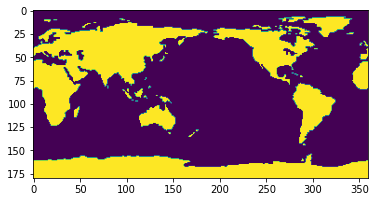

In [ ]:
# get_data()
# td = args.raw_data  
print(td.shape)
# td11 = td*1e+8
# print(td11[0, 7000:7500]**-1)


td11 = td[0, 7120:7140]
td11 = td[0]

n_pixel = len(td11)
land_pos = np.where(td11 > 1e+30)

sea = np.delete(td11, land_pos)

print(td11)
print(land_pos)
print(land_pos[0].shape)

full_idx = np.arange(n_pixel)
sea_idx = np.delete(full_idx, land_pos)

print(full_idx, sea_idx)

recon = np.ones_like(td11)*35  # 1.00e+33

for i, j in zip(sea_idx, count(0, 1)):
  recon[i] = sea[j]

print(recon)
print(recon==td11, np.max(recon))

recon_im = np.flip(recon.reshape(180, 360), 0)
td_im = np.flip(td11.reshape(180, 360), 0)

plt.figure()
plt.imshow(recon_im, cmap='terrain')
plt.figure()
plt.imshow(td_im)
plt.show()

In [ ]:
""" plot image """

def image_select(i, t_out_tensor, t, statsAE, x_cord, s, **kwargs):

  seq_len, seq_impct = kwargs.get('seq_len'), kwargs.get('seq_impct')
  add1 = 'sq{}_i{}_'.format(seq_len, i+seq_impct, args.RNN) if method == 'are' else ''
  add2 = 'SNR{}_'.format(kwargs.get('SNR', '')) if args.exp == 'mthd__snr' else ''

  if s in kwargs.get('plot_s_list', None):
    if seq_len in kwargs.get('plot_seq_len_list', None):
      if i in kwargs.get('plot_image_idx', None)-seq_impct:
        save_path = osp.join(folder_save_results, dir3)
        plot_image(t_out_tensor, 
                    t, 
                    statsAE, 
                    x_cord, 
                    name1 = 'im_{}_{}_s{}_'.format(args.data_type, args.exp, s) + add1 + add2 + '.eps', 
                    plot1=1, save1=0,
                    plot2=0, save2=0, 
                    name2 = 'im_true_{}_{}_s{}_'.format(args.data_type, args.exp, s) + add1 + add2 + '{}.eps',
                    save_path=save_path)


def plot_image(output,img,stats,sensor_locations, **kwargs):

  if isinstance(images, tuple):
    istupl = True

  len_tuple = len(images) if istupl else 1

  # for idx in range(len_tuple):


  name1 = kwargs.get('name1', None)
  save1 = kwargs.get('save1', None)
  save2  = kwargs.get('save2', None)
  name2 = kwargs.get('name2', None) 
  x_cord = sensor_locations
  t_pred = output.cpu().data.numpy()
  t_true = img.cpu().data.numpy()
  t_pred = t_pred * stats[1, :] + stats[0, :]
  t_true = t_true * stats[1, :] + stats[0, :]
  ny, nx = m, n = mn()
  x2 = np.arange(0, ny, 1)
  y2 = np.arange(0, nx, 1)
  mX, mY = np.meshgrid(x2, y2)

  if kwargs.get('plot1', None):

      t_predd = t_pred[0,:].reshape((ny, nx))
      print('reconstruction',i)
      minmax = np.max(np.abs(t_predd)) * 0.65
      plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
      im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
      plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
      if save1 ==1:
        plt.savefig(osp.join(kwargs.get('save_path', None), '{}'.format(name1)),format='eps')
        print('SAVED -',osp.join(kwargs.get('save_path', None), '{}'.format(name1)))
      plt.show()
    
  if kwargs.get('plot2', None):

      t_truee = t_true[0,:].reshape((ny, nx))
      minmax = np.max(np.abs(t_truee)) * 0.65
      plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
      im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
      if save2 ==1:
        plt.savefig(osp.join(kwargs.get('save_path', None), '{}'.format(name2)),format='eps')
        print('SAVED -',osp.join(kwargs.get('save_path', None), '{}'.format(name1)))
      plt.show()

In [ ]:
""" Autoencoder Train loop for Periodic data """

if args.data_type == 'periodic':
  def AutoEcoder(bottle_neck, **kwargs):

    trainAE, validAE, waste, stats = autoencoder_train_data(drop=0, SNR=kwargs.get('SNR',10))

    #Reading data
    train = sensorgcdatasetAE(trainAE[:], stats)
    valid = sensorgcdatasetAE(validAE[:], stats)

    bs = 399#len(trainAE) #batch size
    bsv = 133#len(validAE)
    train_data_gen = torch.utils.data.DataLoader(train, shuffle=True, batch_size=bs)
    valid_data_gen = torch.utils.data.DataLoader(valid, batch_size=bsv)
    dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
    dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}

    model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
    criterion = nn.MSELoss().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr,  weight_decay=1e-6)

    prev_loss = 100  #large number
    stop=0
    rerror_train = []
    rerror_valid = []
    ii = 0
    for epochs in range(num_epochs):
      for phase in ['train','valid']:
        running_loss=0

        if phase == 'train':
          model.train()
        else:
          model.eval()

        for data in enumerate(dataloaders[phase]):
            img = data[1]
            #print(img.shape)
            img = Variable(img).to(device)
            # ===================forward=====================
            output,waste = model(img)
            #print(output.size(),'oo')
            loss = criterion(output, img)
            # ===================backward====================
            optimizer.zero_grad()

            if phase=='train':
                #backward
                loss.backward()
                #update weights
                optimizer.step()

            running_loss += output.shape[0]*loss.data

        if phase == 'train':
          train_epoch_loss = running_loss/dataset_sizes[phase]
          train_last_output = output 
          img_last = img 
        elif phase == 'valid':
          valid_epoch_loss = running_loss/dataset_sizes[phase]
      stop = stop+1
      if (train_epoch_loss < prev_loss):
        model_wts = model.state_dict()
        prev_loss = train_epoch_loss
        prev_T_loss = train_epoch_loss
        print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
        stop = 0
        output_last = output
        img_last = img
        Z = []
        # for  param in model.parameters():
        #   z = param.cpu().detach().numpy()
        #   Z.append(z)
        #   #if k == 7:
        #     #print(param.data,'param.data')
        #     #print(z,'zzz')
        #   k = k+1
        #print(param.data,'tparam.data')
        #print(z,'tzzz')    
        #if valid_epoch_loss < 0.0016:
          #optimizer = torch.optim.SGD(model.parameters(), lr=0.0006, momentum=0.9)
          
        
      else:
        #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))
        #print(z)
        nothing = 1

      if stop== 200:
        print('Early stopping criteria fulfilled')
        j= 0
        break
        #for  param in model.parameters():
          #print('.')
          #print(param)      
        # for  param in model.parameters():
        #   param.data = torch.from_numpy(Z[j]).to(device)
        #   j = j+1
        #print(param)  
        # optimizer = torch.optim.SGD(model.parameters(), lr=0.0006, momentum=0.9)
        #for  param in model.parameters():
          #print('.')
          #print(param)
        break
      rerror_train.append(train_epoch_loss)
      rerror_valid.append(valid_epoch_loss)

    #plot_image(output_last,img_last,stats)
    m, n = 251, 168
    sensor_num = 5
    # x_cord = sensor_cord_data(sensor_num)

    #plot_image(train_last_output, img_last,stats,x_cord)
    #for i in range(len(stats[1,:])):
      # if stats[1,i] == 0:
      #  print(i)
    # print('({}) BEST_Training Loss: {:.8f} BEST_Valid Loss: {:.8f} '.format(epochs, prev_T_loss, prev_loss))
    plot_graph(rerror_train,rerror_valid)
    if kwargs.get('drop',None):
      torch.save(model_wts, osp.join(path2, 'nnv2_Ds33_dropout_bn{}_weights'.format(bottle_neck)))
      print('nnv2_Ds33_dropout_bn{}_weights')
    else:
      torch.save(model_wts, osp.join(path2, 'nnv2_Ds_bn{}_weights'.format(bottle_neck)))
      print('saved nnv2_Ds_bn{}_weights')

    # torch.save(model_wts, '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_bn{}_weights'.format(bottle_neck))
    # # torch.save(model_wts, '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck))
    # print('saved')

data loaded
--- 2.5873823165893555 seconds --
reconstruction 0


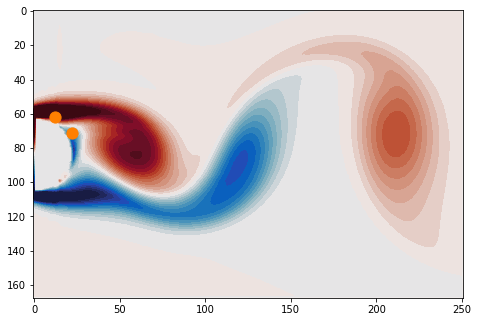

reconstruction 9


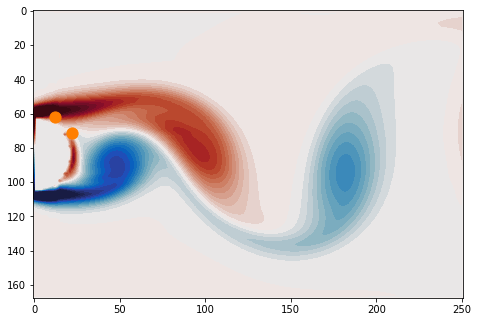

reconstruction 27


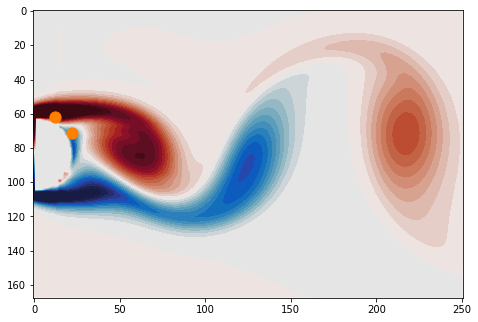

reconstruction 30


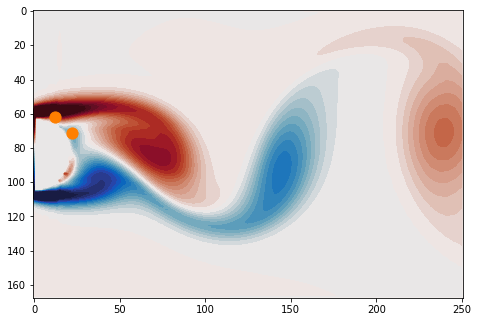

In [ ]:
""" Data sample """

get_data()
td = args.raw_data

nx=168
ny=251
ns = nx*ny
x2 = np.arange(0, ny, 1)
y2 = np.arange(0, nx, 1)
mX, mY = np.meshgrid(x2, y2)
x_cord = sensor_cord_data(sensor_num = 2)

for i in [0,9,27,30]:
    t_predd = td[i,:].reshape((ny, nx))
    print('reconstruction',i)
    minmax = np.max(np.abs(t_predd)) * 0.65
    plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,5.29))
    im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    plt.show()

In [ ]:
""" ADS_train_data """

if args.data_type == 'transient':
  def ADS_train_data(sensor_num, bottle_neck):

    trainAE, validAE, testAE, stats = autoencoder_train_data()
    n_pix = len(trainAE[0,:])
    total = np.concatenate((trainAE, validAE, testAE), axis=0)
    train = sensorgcdatasetAE(total, stats)
    pretrained_weightsAE = osp.join(path2, 'nnv2_D3_bn{}_weights'.format(bottle_neck)

    train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))
    model = autoencoder(bottle_neck).to(device)
    model.load_state_dict(torch.load(pretrained_weightsAE))
    model.eval()
    for data in enumerate(train_data_gen):
      img = data[1]
      img = Variable(img).to(device)
      waste,gg = model(img)
      gtotal_out = gg.cpu().data.numpy()
      del(img,waste,gg)
      #print(gtotal_out,gtotal_out.shape)
      #print(gtotal_out.shape,'gtotal_out')

    del(model,total,train,data)
    len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
    len_train = len(trainAE[:,0])

    gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])
    gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)
    #print(gtotal.shape)
    del(gtotal_out,pretrained_weightsAE)

    gtrain_out = gtotal[:len_train, :]
    #print(gtrain_out.shape)
    gvalid_out = gtotal[len_train: len_train_and_valid,:]
    #print(gvalid_out.shape)
    gtest = gtotal[len_train_and_valid : len(gtotal[:,0]),:]
    #print(gtest.shape)
    del(gtotal)
    ###################################################################
    #m, n = 502, 252
    #sensor_num = sensor_num

    #mask = np.zeros((m,n))
    #x_cord = sensor_cord_data(m,n,sensor_num)
    #gc_pred = gvalid_out * gstats[1, :] + gstats[0, :]

    #kAA =  502*252

    #pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnvalid_D3_bn25_weights';

    #trainAE, validAE, testAE, statsAE = autoencoder_train_data()
    #del(trainAE,testAE)
    #statsAE = stats
    #model = autoencoder(bottle_neck)

    #model.load_state_dict(torch.load(pretrained_weightsAE))
    #del(pretrained_weightsAE)
    #model.eval()

    #testAA = sensorgcdatasetAA(gc_pred, validAE[:,:], statsAE)
    #train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

    #t_pred = np.zeros([399, kAA])
    #t_true = np.zeros([399, kAA])
    #print('jijijij')

    #for i, (gc_pre, t) in enumerate(train_data_genn):
    #    t_out_tensor = model(gc_pre[None, :])
    #    t_out = t_out_tensor.data.numpy()
    #    t_pred[i, :] = t_out
    #    t_true[i, :] = t
    #    #print(t_out_tensor.shape)
    #    if i == 60 or i ==340 or i ==380 or i ==200 or i==300:
    #      plot_image(t_out_tensor, t, statsAE, x_cord)
    #del(t_pred,t_true,testAA)
    ######################################################################

    trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
    validAE_stan = (validAE - stats[0, :])/stats[1, :]
    testAE_stan = (testAE - stats[0, :])/stats[1, :]
    del(trainAE,validAE,testAE)

    n_snapshots_train, n_pix = trainAE_stan.shape
    n_snapshots_valid, _ = validAE_stan.shape
    n_snapshots_test, __ = testAE_stan.shape

    m, n =mn()
    sensor_num = sensor_num

    mask = np.zeros((m,n))
    x_cord = sensor_cord_data(m,n,sensor_num)
    mask[x_cord[:,0], x_cord[:,1]] = 1
    pivots = np.where(mask.reshape(-1) == 1)
    pivots = np.asarray(pivots).ravel()

    strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
    svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
    stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
    #print(svalid_in.shape)
    del(trainAE_stan,validAE_stan,testAE_stan)

    return gtrain_out, gvalid_out, strain_in, svalid_in, gtest, stest_in, gstats, x_cord

if args.data_type == 'periodic':
  def ADS_train_data(sensor_num, bottle_neck, **kwargs):

  trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
  total = np.concatenate((trainAE, validAE, testAE), axis=0)
  train = sensorgcdatasetAE(total, stats)

  if kwargs.get('drop',None):
    pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck);
  else:
    pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_bn{}_weights'.format(bottle_neck);
  
  train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))
  model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
  model.load_state_dict(torch.load(pretrained_weightsAE))
  model.eval()
  for data in enumerate(train_data_gen):
    img = data[1]
    img = Variable(img).to(device)
    waste,gg = model(img)
    gtotal_out = gg.cpu().data.numpy()
    del(img,waste,gg)
    #print(gtotal_out,gtotal_out.shape)
    #print(gtotal_out.shape,'gtotal_out')

  del(model,total,train,data)
  len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
  len_train = len(trainAE[:,0])

  gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])
  gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)
  #print(gtotal.shape)
  del(gtotal_out,pretrained_weightsAE)

  gtrain_out = gtotal[:len_train, :]
  #print(gtrain_out.shape)
  gvalid_out = gtotal[len_train: len_train_and_valid,:]
  #print(gvalid_out.shape)
  gtest = gtotal[len_train_and_valid : len(gtotal[:,0]),:]
  #print(gtest.shape)
  del(gtotal)
  ###################################################################
  #m, n = 251, 168
  #sensor_num = sensor_num

  #mask = np.zeros((m,n))
  #x_cord = sensor_cord_data(m,n,sensor_num)
  #gc_pred = gvalid_out * gstats[1, :] + gstats[0, :]

  #kAA =  251*168

  #pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnvalid_Ds_bn25_weights';

  #trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  #del(trainAE,testAE)
  #statsAE = stats
  #model = autoencoder(bottle_neck)

  #model.load_state_dict(torch.load(pretrained_weightsAE))
  #del(pretrained_weightsAE)
  #model.eval()

  #testAA = sensorgcdatasetAA(gc_pred, validAE[:,:], statsAE)
  #train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

  #t_pred = np.zeros([399, kAA])
  #t_true = np.zeros([399, kAA])
  #print('jijijij')

  #for i, (gc_pre, t) in enumerate(train_data_genn):
  #    t_out_tensor = model(gc_pre[None, :])
  #    t_out = t_out_tensor.data.numpy()
  #    t_pred[i, :] = t_out
  #    t_true[i, :] = t
  #    #print(t_out_tensor.shape)
  #    if i == 60 or i ==340 or i ==380 or i ==200 or i==300:
  #      plot_image(t_out_tensor, t, statsAE, x_cord)
  #del(t_pred,t_true,testAA)
  ######################################################################

  trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
  validAE_stan = (validAE - stats[0, :])/stats[1, :]
  testAE_stan = (testAE - stats[0, :])/stats[1, :]
  del(trainAE,validAE,testAE)

  n_snapshots_train, n_pix = trainAE_stan.shape
  n_snapshots_valid, _ = validAE_stan.shape
  n_snapshots_test, __ = testAE_stan.shape

  m, n = mn()
  sensor_num = sensor_num

  mask = np.zeros((m,n))
  x_cord = sensor_cord_data(sensor_num)
  mask[x_cord[:,0], x_cord[:,1]] = 1
  pivots = np.where(mask.reshape(-1) == 1)
  pivots = np.asarray(pivots).ravel()

  strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
  svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
  stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
  #print(svalid_in.shape)
  del(trainAE_stan,validAE_stan,testAE_stan)

  return gtrain_out, gvalid_out, strain_in, svalid_in, gtest, stest_in, gstats, x_cord

SyntaxError: ignored

In [ ]:
""" PLOT IMAGES """

if args.data_type == 'transient':
  def image_select(i, t_out_tensor, t, statsAE, x_cord, s, seq_len, seq_impct, **kwargs):
    if s in kwargs.get('plot_s_list', None):
      if seq_len in kwargs.get('plot_seq_len_list', None):
        if i in kwargs.get('plot_image_idx', None)-seq_impct:
          save_path = osp.join(folder_save_results, dir3)
          plot_image(t_out_tensor, 
                     t, 
                     statsAE, 
                     x_cord, 
                     name = 'im_{}_s{}_sq{}_i{}_SNR{}_Tr.eps'.format(args.RNN, s,seq_len,i+seq_impct, kwargs.get('SNR', None)), 
                     plot1=1, save=0,
                     plot2=0, save2=0, 
                     name2 = 'im_{}_true_s{}_sq{}_i{}_SNR{}_Tr.eps'.format(args.RNN, s,seq_len,i+seq_impct, kwargs.get('SNR', None)), 
                     save_path=save_path)


  def plot_image(output,img,stats,sensor_locations, **kwargs):
    name1 = kwargs.get('name', None)
    save = kwargs.get('save', None)
    save2  = kwargs.get('save2', None)
    name2 = kwargs.get('name2', None) #'im_RNNv3_true_s{}_sq{}_{}_D3'.format(sensor_number,seq_len,i) 
    x_cord = sensor_locations
    t_pred = output.cpu().data.numpy()
    t_true = img.cpu().data.numpy()
    t_pred = t_pred * stats[1, :] + stats[0, :]
    #print(t_pred.shape)
    #print(t_true.shape)
    t_true = t_true * stats[1, :] + stats[0, :]
    m,n = mn()
    nx=n
    ny=m
    ns = nx*ny
    x2 = np.arange(0, ny, 1)
    y2 = np.arange(0, nx, 1)
    mX, mY = np.meshgrid(x2, y2)

    if kwargs.get('plot1', None):
    # for i in range(250,325):
    #   try:
    #     t_predd = t_pred[i,:].reshape((ny, nx))
    #     print('reconstruction',i)
    #     minmax = np.max(np.abs(t_predd)) * 0.65
    #     plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    #     im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    #     plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    #     plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    #     plt.show()
    #     #plt.pcolormesh(t_pred[i, :ns].reshape((ny, nx),order ='F'), cmap=plt.cm.jet, vmin=-0.0003, vmax=0.0003)
    #     #plt.pcolormesh(t_pred[i,:].reshape((384, 199)))
    #   except :
        t_predd = t_pred[0,:].reshape((ny, nx))
        print('reconstruction',i)
        minmax = np.max(np.abs(t_predd)) * 0.65
        plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
        im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
        plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
        plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
        if save ==1:
          plt.savefig(osp.join(kwargs.get('save_path', None), '{}'.format(name1)),format='eps')
          print('SAVED -',osp.join(kwargs.get('save_path', None), '{}'.format(name1)))
        plt.show()
        # break
      
    if kwargs.get('plot2', None):
    # for i in range(250,325):
    #   try:
    #     t_truee = t_true[i,:].reshape((ny, nx))
    #     minmax = np.max(np.abs(t_truee)) * 0.65
    #     plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    #     im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    #     plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    #     #plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    #     plt.show()
    #   except:
        t_truee = t_true[0,:].reshape((ny, nx))
        minmax = np.max(np.abs(t_truee)) * 0.65
        plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
        im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
        plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
        #plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
        if save2 ==1:
          mm=0
          plt.savefig(osp.join(kwargs.get('save_path', None), '{}'.format(name2)),format='eps')
          print('SAVED -',osp.join(kwargs.get('save_path', None), '{}'.format(name1)))
          # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4//tr{}'.format(name2),format='eps')
          # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/tr/{}'.format(name2) )
        plt.show()
        # break

if args.data_type == 'periodic':
  def image_select(i, t_out_tensor, t, statsAE, x_cord, s, seq_len, seq_impct, **kwargs):
    if s in kwargs.get('plot_s_list', None):
      if seq_len in kwargs.get('plot_seq_len_list', None):
        if i in kwargs.get('plot_image_idx', None)-seq_impct:
          save_path = osp.join(folder_save_results, dir3)
          plot_image(t_out_tensor, 
                      t, 
                      statsAE, 
                      x_cord, 
                      name = 'im_{}_s{}_sq{}_i{}_SNR{}_Pr.eps'.format(args.RNN, s,seq_len,i+seq_impct, kwargs.get('SNR', None)), 
                      plot1=1, save=0,
                      plot2=0, save2=0, 
                      name2 = 'im_{}_true_s{}_sq{}_i{}_SNR{}_Pr.eps'.format(args.RNN, s,seq_len,i+seq_impct, kwargs.get('SNR', None)), 
                      save_path=save_path )

  def plot_image(output,img,stats,sensor_locations, **kwargs):
    name1 = kwargs.get('name', None)
    save = kwargs.get('save', None)
    save2  = kwargs.get('save2', None)
    name2 = kwargs.get('name2', None) #'im_RNNv3_true_s{}_sq{}_{}_D3'.format(sensor_number,seq_len,i) 

    x_cord = sensor_locations
    t_pred = output.cpu().data.numpy()
    t_true = img.cpu().data.numpy()
    t_pred = t_pred * stats[1, :] + stats[0, :]
    #print(t_pred.shape)
    #print(t_true.shape)
    t_true = t_true * stats[1, :] + stats[0, :]
    nx=168
    ny=251
    ns = nx*ny
    x2 = np.arange(0, ny, 1)
    y2 = np.arange(0, nx, 1)
    mX, mY = np.meshgrid(x2, y2)

    if kwargs.get('plot1', None):
    # for i in range(250,325):
    #   try:
    #     t_predd = t_pred[i,:].reshape((ny, nx))
    #     print('reconstruction',i)
    #     minmax = np.max(np.abs(t_predd)) * 0.65
    #     plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    #     im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    #     plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    #     plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    #     plt.show()
    #     #plt.pcolormesh(t_pred[i, :ns].reshape((ny, nx),order ='F'), cmap=plt.cm.jet, vmin=-0.0003, vmax=0.0003)
    #     #plt.pcolormesh(t_pred[i,:].reshape((384, 199)))
    #   except :
        t_predd = t_pred[0,:].reshape((ny, nx))
        #print('reconstruction',i)
        minmax = np.max(np.abs(t_predd)) * 0.65
        plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
        im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
        plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
        plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
        if save ==1:
          plt.savefig(osp.join(kwargs.get('save_path', None), '{}'.format(name1)),format='eps')
          print('SAVED -',osp.join(kwargs.get('save_path', None), '{}'.format(name1)))
          # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4/pr/{}'.format(im_name),format='eps')
          # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/pr/{}'.format(im_name))
        plt.show()
        # break
      
    if kwargs.get('plot2', None):
    # for i in range(250,325):
    #   try:
    #     t_truee = t_true[i,:].reshape((ny, nx))
    #     minmax = np.max(np.abs(t_truee)) * 0.65
    #     plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    #     im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    #     plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    #     #plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    #     plt.show()
    #   except:
        t_truee = t_true[0,:].reshape((ny, nx))
        minmax = np.max(np.abs(t_truee)) * 0.65
        plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
        im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
        plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)#vmin=-minmax+3, vmax=minmax-3)
        #plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
        if save2 ==1:
          plt.savefig(osp.join(kwargs.get('save_path', None), '{}'.format(name1)),format='eps')
          print('SAVED -',osp.join(kwargs.get('save_path', None), '{}'.format(name1)))
          # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4/pr{}'.format(name2),format='eps')
          # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/pr/{}'.format(name2) )      
        plt.show()
        # break


In [ ]:
""" ARE Test Loop """

if args.data_type == 'transient':
  def FR_rnn(sensor_number,seq_len, bottle_neck, **kwargs):

    if args.RNN == 'lstm':
      if kwargs.get('drop',None):
        print('using Ds_dropout1_AREdrop0_weights')
        pretrained_weightsRNN = osp.join(path3, 'LSTMV3_s{}_sq{}_bn{}_D333_dropout1_AREdrop0_weights'.format(sensor_number,seq_len, bottle_neck))
      else:
        no=0
        pretrained_weightsRNN = osp.join(path3, 'LSTMv3_s{}_sq{}_bn{}_D3_weights'.format(sensor_number,seq_len, bottle_neck))
    elif args.RNN == 'rnn':
      if kwargs.get('drop',None):
        print('using Ds_dropout1_AREdrop0_weights')
        pretrained_weightsRNN = osp.join(path3, 'RNNV3_s{}_sq{}_bn{}_D3_dropout1_AREdrop0_weights'.format(sensor_number,seq_len, bottle_neck))
      else:
        no=0
        pretrained_weightsRNN = osp.join(path3, 'RNNv3_s{}_sq{}_bn{}_D3_weights'.format(sensor_number,seq_len, bottle_neck))
    
      
    sensor_number = sensor_number
    hidden_size = 50
    layers = 1
    seq_impct = int((seq_len-1)/2)

    gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord  = ARE_train_data(sensor_number, 
                                                                                                                bottle_neck, 
                                                                                                                seq_len, 
                                                                                                                drop=kwargs.get('drop',None), 
                                                                                                                SNR=kwargs.get('SNR',None), 
                                                                                                                data_noise=kwargs.get('drop',None))
    #print(gtest_stan.shape,'jkj'))
    del(gtrain_out, gvalid_out, strain_in, svalid_in)
    # Setting up the neural network
    if args.RNN == 'lstm':
      model = are_lstm_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)
    elif args.RNN == 'rnn':
      model = RNNv3network(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

    # Load saved neural network weights
    model.load_state_dict(torch.load(pretrained_weightsRNN))
    model.eval()

    # Load snapshots of sensor data and gc for testing
    test = sensorgcdatasetRNN(stest_in_stacked, gtest_stan)
    #test = sensorgcdatasetRNN(svalid_in, gvalid_out)
    test_data_genn = torch.utils.data.DataLoader(test, shuffle=False, batch_size=1)

    # predicting generalized coordinates from sensor data
    #err = []
    gc_pred = np.zeros([len(test), bottle_neck])
    for i, (sensor, gc) in enumerate(test):
        if args.operation_mode == 'online': 
          y = torch.zeros((seq_impct+1),1, sensor_number)
          for j in range(0, (seq_impct+1)):
              y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
                    
        elif args.operation_mode == 'offline':
          y = torch.zeros(seq_len,1, sensor_number)
          for j in range(0, seq_len):
              y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
              
        gc_out = model(y.to(device)).cpu().data.numpy()
        gc_pred[i, :] = gc_out
        #del(gc_out, y, sensor, gc)
        #err.append(np.linalg.norm(gc.numpy() - gc_pred[i, :]) ** 2 / gc_pred[i, :].size)  # /np.linalg.norm(gc) )
       
    del(stest_in_stacked, gtest_stan)
    #print(gc_pred)
    #acc_avg = np.mean(err)
    gc_pred = gc_pred * gstats[1, :] + gstats[0, :]

    if kwargs.get('drop',None):
      pretrained_weightsAE = osp.join(path2, 'nnv2_D333_dropout_bn25_weights')
    else:
      no=0
      pretrained_weightsAE = osp.join(path2, 'nnv2_D3_bn{}_weights'.format(bottle_neck))


    trainAE, validAE, testAE, statsAE = autoencoder_train_data()
    del(trainAE,validAE)

    model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)

    model.load_state_dict(torch.load(pretrained_weightsAE))
    model.eval()

    if args.operation_mode == 'online': 
      testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:399,:], statsAE)
                   
    elif args.operation_mode == 'offline':
      testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:399-seq_impct,:], statsAE)
    
    train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

    #err = []
    t_pred = np.zeros([len(test), len(testAE[0,:]) ])
    t_true = np.zeros([len(test), len(testAE[0,:]) ])
    #print('jijijij')
    for i, (gc_pre, t) in enumerate(train_data_genn):
        t_out_tensor = model(gc_pre[None, :].to(device))
        t_out = t_out_tensor.cpu().data.numpy()
        t_pred[i, :] = t_out
        t_true[i, :] = t
        #err.append(np.linalg.norm(t.numpy() - t_pred[i, :]) ** 2 / t_pred[i, :].size)
        #print(t_out_tensor.shape)
        image_select(i, t_out_tensor[0], t, statsAE, x_cord, s, seq_len, seq_impct, **kwargs)
        # if s == 1 or s == 2:
        #   if i ==285-seq_impct:# or i ==280-seq_impct or i ==290-seq_impct:
        #     nothing = 0
        #     # plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_RNNv3_s{}_sq{}_i{}_D3.eps'.format(sensor_number,seq_len,i+seq_impct), save = 0,save2  =0, name2 = 'im_RNNv3_true_s{}_sq{}_i{}_D3.eps'.format(sensor_number,seq_len,i+seq_impct) )
        # if seq_len == 11:
        #   if i == 350- seq_impct :
        #     nothing = 0
        #     # plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_LSTMv3_s{}_sq{}_D3.eps'.format(sensor_number,seq_len), save = 0)

    #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
    #print(error)

    t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
    t_true = t_true * statsAE[1, :] + statsAE[0, :]

    #acc_avg = np.mean(err)
    #print(acc_avg)
    #print(min(err))

    #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
    #print(error)

    Ferr = []
    if args.operation_mode == 'online':      
        for i in range(200,399-seq_impct):
          Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
    elif args.operation_mode == 'offline':
      for i in range(200,399-2*seq_impct):
          Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

    del(t_true,t_pred)
    Ferr_avg = np.mean(Ferr)
    #Terr_max = max(Terr)
    print("Error =",seq_len, Ferr_avg)
    return (seq_len, Ferr_avg)
    #print("Max error =", Terr_max)
  #######################################################$$$$$$$$$$$$$%%%%)

if args.data_type == 'periodic':
  def FR_rnn(sensor_number,seq_len, bottle_neck, **kwargs):
    if args.RNN == 'lstm':
      if kwargs.get('drop',None):
        print('using Ds_dropout1_AREdrop0_weights')
        pretrained_weightsRNN = osp.join(path3, 'RNNv3_LSTM_s{}_sq{}_bn{}_Ds33_dropout1_AREdrop0_weights'.format(sensor_number,seq_len, bottle_neck))
      else:
        no=0
        pretrained_weightsRNN = osp.join(path3, 'RNNv3_LSTM_s{}_sq{}_bn{}_Ds_weights'.format(sensor_number,seq_len, bottle_neck))
    elif args.RNN == 'rnn':
      if kwargs.get('drop',None):
        print('using Ds_dropout1_AREdrop0_weights')
        pretrained_weightsRNN = osp.join(path3, 'RNNV3_s{}_sq{}_bn{}_Pr_dropout1_AREdrop0_weights'.format(sensor_number,seq_len, bottle_neck))
      else:
        no=0
        pretrained_weightsRNN = osp.join(path3, 'RNNv3_s{}_sq{}_bn{}_Pr_weights'.format(sensor_number,seq_len, bottle_neck))

    nx = 168
    ny = 251
    sensor_number = sensor_number
    hidden_size = 50
    layers = 1
    seq_impct = int((seq_len-1)/2)

    gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord  = ARE_train_data(sensor_number, 
                                                                                                                bottle_neck, 
                                                                                                                seq_len, 
                                                                                                                drop=kwargs.get('drop',None), 
                                                                                                                SNR=kwargs.get('SNR',None), 
                                                                                                                data_noise=kwargs.get('drop',None))
    #print(gtest_stan.shape,'jkj'))
    del(gtrain_out, gvalid_out, strain_in, svalid_in)
    # Setting up the neural network
    if args.RNN == 'lstm':
      model = are_lstm_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)
    elif args.RNN == 'rnn':
      model = RNNv3network(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)


    # Load saved neural network weights
    model.load_state_dict(torch.load(pretrained_weightsRNN))
    model.eval()

    # Load snapshots of sensor data and gc for testing
    test = sensorgcdatasetRNN(stest_in_stacked, gtest_stan)
    #test = sensorgcdatasetRNN(svalid_in, gvalid_out)
    test_data_genn = torch.utils.data.DataLoader(test, shuffle=False, batch_size=1)

    # predicting generalized coordinates from sensor data
    #err = []
    gc_pred = np.zeros([len(test), bottle_neck])
    for i, (sensor, gc) in enumerate(test):
        if args.operation_mode == 'online': 
          y = torch.zeros((seq_impct+1),1, sensor_number)
          for j in range(0, (seq_impct+1)):
              y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
                    
        elif args.operation_mode == 'offline':
          y = torch.zeros(seq_len,1, sensor_number)
          for j in range(0, seq_len):
              y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
        
        gc_out = model(y.to(device)).cpu().data.numpy()
        gc_pred[i, :] = gc_out
        #del(gc_out, y, sensor, gc)
        #err.append(np.linalg.norm(gc.numpy() - gc_pred[i, :]) ** 2 / gc_pred[i, :].size)  # /np.linalg.norm(gc) )
        #print(i)
    del(stest_in_stacked, gtest_stan)
    #print(gc_pred)
    #acc_avg = np.mean(err)
    gc_pred = gc_pred * gstats[1, :] + gstats[0, :]

    kAA =  168*251
    if kwargs.get('drop',None):
      pretrained_weightsAE = osp.join(path2, 'nnv2_Ds33_dropout_bn25_weights')
    else:
      no=0
      pretrained_weightsAE = osp.join(path2, 'nnv2_Ds_bn{}_weights'.format(bottle_neck))


    trainAE, validAE, testAE, statsAE = autoencoder_train_data()
    del(trainAE,validAE)

    model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)

    model.load_state_dict(torch.load(pretrained_weightsAE))
    model.eval()

    if args.operation_mode == 'online': 
      testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:399,:], statsAE)
                   
    elif args.operation_mode == 'offline':
      testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:399-seq_impct,:], statsAE)
    
    train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

    #err = []
    t_pred = np.zeros([len(test), len(testAE[0,:]) ])
    t_true = np.zeros([len(test), len(testAE[0,:]) ])
    #print('jijijij')
    for i, (gc_pre, t) in enumerate(train_data_genn):
        t_out_tensor = model(gc_pre[None, :].to(device))
        t_out = t_out_tensor.cpu().data.numpy()
        t_pred[i, :] = t_out
        t_true[i, :] = t
        #err.append(np.linalg.norm(t.numpy() - t_pred[i, :]) ** 2 / t_pred[i, :].size)
        #print(t_out_tensor.shape)
        image_select(i, t_out_tensor[0], t, statsAE, x_cord, s, seq_len, seq_impct, **kwargs)
        # if s == 1 or s == 2:
        #   if i ==285-seq_impct:# or i ==280-seq_impct or i ==290-seq_impct:
        #     nothing = 0
        #     # plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_RNNv3_s{}_sq{}_i{}_D3.eps'.format(sensor_number,seq_len,i+seq_impct), save = 0,save2  =0, name2 = 'im_RNNv3_true_s{}_sq{}_i{}_D3.eps'.format(sensor_number,seq_len,i+seq_impct) )
        # if seq_len == 11:
        #   if i == 350- seq_impct :
        #     nothing = 0
        #     # plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_LSTMv3_s{}_sq{}_D3.eps'.format(sensor_number,seq_len), save = 0)

    #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
    #print(error)

    t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
    t_true = t_true * statsAE[1, :] + statsAE[0, :]

    #acc_avg = np.mean(err)
    #print(acc_avg)
    #print(min(err))

    #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
    #print(error)

    Ferr = []
    if args.operation_mode == 'online':      
        for i in range(0,60-seq_impct):
          Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
    elif args.operation_mode == 'offline':
      for i in range(0,60-2*seq_impct):
          Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
          
    # for i in range(0,60-2*seq_impct):
    #     Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
    del(t_true,t_pred)
    Ferr_avg = np.mean(Ferr)
    #Terr_max = max(Terr)
    print("Error =",seq_len, Ferr_avg)
    #print("Max error =", Terr_max)
    return (seq_len, Ferr_avg)
  #######################################################$$$$$$$$$$$$$%%%%)


noise_error = np.zeros((1, 1, 25))
for s, i in [[5, 0]]:#, [2, 1]]:#, [5, 2]]:
  for seq_len in [7]:#[3, 5, 7, 9]:
    for bn in [25]:
      for SNR in range(0,100,4):
        print('no. of sensors',s,'SNR',SNR)
        aaa = FR_rnn(s,seq_len,bn,drop=1,SNR=SNR)
        noise_error[i, int((seq_len-7)/2), int(SNR/4)] = aaa[1]
# np.savetxt(osp.join(path3, "noise_error_s_1_{}.csv".format(args.RNN)), noise_error[0], delimiter=",")
# np.savetxt(osp.join(path3, "noise_error_s_2_{}.csv".format(args.RNN)), noise_error[1], delimiter=",")
np.savetxt(osp.join(path3, "noise_error_s_5_{}.csv".format(args.RNN)), noise_error[0], delimiter=",")

error = np.zeros((2, 5))
plot_s_list = np.array([10])
plot_seq_len_list = np.array([7])
plot_image_idx = np.array([335])
for s, i in [[1, 0], [2, 1]]:#, [5, 2]]:
  for seq_len in [3,5,7,9]:
    for bn in [25]:
        # FR_rnn(s,seq_len,bn,drop=0,SNR=10)
        aba = FR_rnn(s,
                     seq_len, 
                     bn,
                     drop=0,SNR=1000, 
                     plot_s_list=plot_s_list, 
                     plot_seq_len_list=plot_seq_len_list, 
                     plot_image_idx=plot_image_idx)
        error[i, int((seq_len-3)/2)] = aba[1]

np.savetxt(osp.join(path3, "error_s_1_{}.csv".format(args.RNN)), error[0], delimiter=",")
np.savetxt(osp.join(path3, "error_s_2_{}.csv".format(args.RNN)), error[1], delimiter=",")
# np.savetxt(osp.join(path3, "error_s_5_{}.csv".format(args.RNN)), error[2], delimiter=",")

# for s in [1]:
#   for seq_len in [3, 5, 7, 9]:
#     for bn in [25]:
#         FR_rnn(s,seq_len,bn,drop=0,SNR=10)

no. of sensors 5 SNR 0
using Ds_dropout1_AREdrop0_weights
in autoencoder_train_data--noise data SNR = 0


NameError: ignored

In [ ]:
""" old path setting """

import torch
if args.operation_mode == 'offline':
  if args.data_type == 'periodic':
      if args.RNN == 'rnn':
        dir1 = 'Pr'
        dir2 = 'Pr/PrOffline'
        dir3 = 'Pr/PrOffline/rnn'
      elif args.RNN == 'lstm':
        dir1 = 'Pr'
        dir2 = 'Pr/PrOffline'
        dir3 = 'Pr/PrOffline/lstm'
  elif args.data_type == 'transient':
      if args.RNN == 'rnn':
        dir1 = 'Tr'
        dir2 = 'Tr/TrOffline'
        dir3 = 'Tr/TrOffline/rnn'
      elif args.RNN == 'lstm':
        dir1 = 'Tr'
        dir2 = 'Tr/TrOffline'
        dir3 = 'Tr/TrOffline/lstm'


elif args.operation_mode == 'online':
  if args.data_type == 'periodic':
      if args.RNN == 'rnn':
          dir1 = 'Pr'
          dir2 = 'Pr/PrOnline'
          dir3 = 'Pr/PrOnline/rnn'
      elif args.RNN == 'lstm':
          dir1 = 'Pr'
          dir2 = 'Pr/PrOnline'
          dir3 = 'Pr/PrOnline/lstm'

  elif args.data_type == 'transient':
      if args.RNN == 'rnn':
          dir1 = 'Tr'
          dir2 = 'Tr/TrOnline'
          dir3 = 'Tr/TrOnline/rnn'
      elif args.RNN == 'lstm':
          dir1 = 'Tr'
          dir2 = 'Tr/TrOnline'
          dir3 = 'Tr/TrOnline/lstm'

folder = '../content/drive/My Drive/Colab Notebooks/Weights'
folder2 = osp.join(folder, dir1)
folder3 = osp.join(folder, dir2)
folder4 = osp.join(folder, dir3)
folder_save_results = '../content/drive/My Drive/Colab Notebooks/contours'
path2 = folder2
path3 = folder4

In [ ]:
""" 
TESTNING shallow decoder net
""" 

torch.manual_seed(0)
model1 = shallow_decoder(2, 3)
model2 = shallow_decoder(2, 3, drop=1)
# model3 = shallow_decoder_drop(2, 3)

x = torch.randn(4, 1, 3)
""" x.shape[1] = 1 as there is 1 value of running mean """ 

# model1.train()
# model1.eval()
y1 = model1(x)
print(y1)
y2 = model2(x)
print(y2)
# y3 = model3(x)
# print(y3)

shallow_decoder oprating without drop
shallow_decoder oprating with drop
tensor([[[-0.0175, -0.0193]],

        [[-0.0294, -0.0135]],

        [[-0.0648, -0.0412]],

        [[-0.0106,  0.0975]]], grad_fn=<AddBackward0>)
tensor([[[ 0.0284, -0.0934]],

        [[ 0.0051,  0.0332]],

        [[-0.0429, -0.2005]],

        [[-0.0993, -0.2215]]], grad_fn=<AddBackward0>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.


In [ ]:
if args.data_type == 'periodic':
  def LSTM(sensor_number, seq_len, bottle_neck, **kwargs):    
    print('sensor_number =',sensor_number,'seq_len = ',seq_len)
    hidden_size = 50
    layers = 1
    seq_impct = int((seq_len-1)/2)

    gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats,x_cord  = ARE_train_data(sensor_number, 
                                                                                                                bottle_neck,
                                                                                                                seq_len, 
                                                                                                                drop =kwargs.get('drop',None), 
                                                                                                                data_noise=None)
    del(gtest_stan, stest_in_stacked)
    train = sensorgcdatasetRNN(strain_in, gtrain_out)
    valid = sensorgcdatasetRNN(svalid_in, gvalid_out)
    print(strain_in.shape)
    print(gtrain_out.shape)
    print(svalid_in.shape)
    print(gvalid_out.shape)

    bs = len(train)  # batch size
    print(bs)
    bsv = len(valid)
    print(bsv)
    train_data_gen = torch.utils.data.DataLoader(train, shuffle=False, batch_size=bs)
    valid_data_gen = torch.utils.data.DataLoader(valid, shuffle=False, batch_size=bsv)
    dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
    dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}
    batch ={'train':bs, 'valid':bsv}
    # Setting up the neural network

    if args.RNN == 'lstm':
      model = are_lstm_net(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)
    elif args.RNN == 'rnn':
      model = RNNv3network(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

    # Loss and Opti mizer
    #criterion = nn.MSELoss(reduction='mean').to(device)
    criterion = nn.MSELoss().to(device)
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.008, betas=(0.8, 0.8), eps=1e-08, weight_decay=0.01,)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr,  weight_decay=1e-5)
    #optimizer = torch.optim.SGD(model.parameters(), lr=0.06, momentum=0.9)
    #exp_lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[500], gamma=0.1)

    prev_loss = 100  # large number
    stop = 0
    rerror_train = []
    rerror_valid = []
    for epochs in range(num_epochs):
      for phase in ['train','valid']:
        running_loss=0
        if phase == 'train':
          model.train()
        else:
          model.eval()
        #print(phase)
        for i, (sensor, gc) in enumerate(dataloaders[phase]):
            #print(sensor)
            if args.operation_mode == 'online': 
              y = torch.zeros((seq_impct+1), batch[phase], sensor_number)
              for i in range(0, batch[phase]):
                  for j in range(0, (seq_impct+1)):
                      y[j, i,:] = sensor[i, sensor_number*j: sensor_number*j + sensor_number]
                
            elif args.operation_mode == 'offline':
              y = torch.zeros(seq_len, batch[phase], sensor_number)
              for i in range(0, batch[phase]):
                  for j in range(0, seq_len):
                      y[j, i,:] = sensor[i, sensor_number*j: sensor_number*j + sensor_number]
                         
            sensor = Variable(y).to(device)
            gc = Variable(gc).to(device)

            # clear gradients
            optimizer.zero_grad()
            # forward
            gc_out = model(sensor)
            #print(gc_out,gc)

            # calculate loss
            loss = criterion(gc_out, gc)
            if phase=='train':
              #backward
              loss.backward()
              #update weights
              optimizer.step()
              #exp_lr_scheduler.step()

            running_loss = gc_out.shape[0] * loss.data + running_loss

        if phase == 'train':
          train_epoch_loss = running_loss/dataset_sizes[phase]
        elif phase == 'valid':
          valid_epoch_loss = running_loss/dataset_sizes[phase]
      stop = stop + 1

      if (valid_epoch_loss < prev_loss):
        model_wts = model.state_dict()
        prev_loss = valid_epoch_loss
        prev_T_loss = train_epoch_loss
        # print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
        stop = 0
        output_last = gc_out
        gc_last = gc
        Z = []
        for  param in model.parameters():
          z = param.cpu().detach().numpy()
          Z.append(z)

      else:
        nothing = 1
        #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))
      
      if stop == 230:
          print('Early stopping criteria fulfilled')
          break
          j = 0
          # for  param in model.parameters():
          #   param.data = torch.from_numpy(Z[j]).to(device)
          #   j = j+1  
          # optimizer = torch.optim.SGD(model.parameters(), lr=0.0005, momentum=0.9)
          # #break
      rerror_train.append(train_epoch_loss)
      rerror_valid.append(valid_epoch_loss)

    #plot_image(output_last, img_last, gstats)
    print('({}) BEST_Training Loss: {:.8f} BEST_Valid Loss: {:.8f} '.format(epochs, prev_T_loss, prev_loss))
    print('overrrrrrrrrrrrrr')
    plot_graph(rerror_train,rerror_valid)

    if args.RNN == 'lstm':
      if kwargs.get('drop',None):
        # print('here')
        torch.save(model_wts, osp.join(path3, 'RNNv3_LSTM_s{}_sq{}_bn{}_Ds33_dropout1_AREdrop0_weights'.format(sensor_number,seq_len, bottle_neck)))
        print('saved Ds_dropout1_AREdrop0_weights')
      else:
        no=0
        torch.save(model_wts, osp.join(path3, 'RNNv3_LSTM_s{}_sq{}_bn{}_Ds_weights'.format(sensor_number,seq_len, bottle_neck)))
        print('saved RNNv3_LSTM_s{}_sq{}_bn{}_Ds_weights')
    elif args.RNN == 'rnn':
      if kwargs.get('drop',None):
        torch.save(model_wts, osp.join(path3, 'RNNV3_s{}_sq{}_bn{}_Pr_dropout1_AREdrop0_weights'.format(sensor_number,seq_len, bottle_neck)))
        print('saved RNNV3_s{}_sq{}_bn{}_Pr_dropout1_AREdrop0_weights')
      else:
        no=0
        torch.save(model_wts, osp.join(path3, 'RNNv3_s{}_sq{}_bn{}_Pr_weights'.format(sensor_number,seq_len, bottle_neck)))
        print('saved RNNv3_s{}_sq{}_bn{}_Pr_weights')
        

In [ ]:
if args.data_type == 'periodic':
  if args.operation_mode == 'online':
    def ARE_train_data1(sensor_num, bottle_neck, seq_len, **kwargs):

      seq_impct = int((seq_len-1)/2)

      # print('in rrntriandata',kwargs.get('drop',None))
      trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
      total = np.concatenate((trainAE, validAE, testAE), axis=0)
      train = sensorgcdatasetAE(total, stats)


      path_to_weights = get_path('are', W_AE=1)
      weights_name = get_name('are', drop=kwargs.get('drop'), W_AE=1, bottle_neck=bottle_neck)
      pretrained_weightsAE = osp.join(path_to_weights, weights_name)

      train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))
      model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
      model.load_state_dict(torch.load(pretrained_weightsAE))
      model.eval()
      for data in enumerate(train_data_gen):
        img = data[1]
        img = Variable(img).to(device)
        waste,gg = model(img)
        del(waste,img)
        gtotal_out = gg.cpu().data.numpy()
        del(gg)
        #print(gtotal_out,gtotal_out.shape)
        #print(gtotal_out.shape,'gtotal_out')

      len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
      len_train = len(trainAE[:,0])

      gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)

      gtrain_out = gtotal[seq_impct:len_train, :] 
      gvalid_out = gtotal[len_train+seq_impct: len_train_and_valid,:]
      gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0]),:]
      del(total,train,gtotal)
      
      #########################################  Standardizing trainAE
      trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
      validAE_stan = (validAE - stats[0, :])/stats[1, :]
      testAE_stan = (testAE - stats[0, :])/stats[1, :]
      #########
      gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])

      del(trainAE,validAE,testAE)

      n_snapshots_train, n_pix = trainAE_stan.shape
      n_snapshots_valid, _ = validAE_stan.shape
      n_snapshots_test, __ = testAE_stan.shape
      m, n = mn() #251, 168
      sensor_num = sensor_num

      mask = np.zeros((m,n))
      x_cord = sensor_cord_data(sensor_num)

      mask[x_cord[:,0], x_cord[:,1]] = 1
      pivots = np.where(mask.reshape(-1) == 1)
      pivots = np.asarray(pivots).ravel()

      strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
      svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
      stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)

      strain_in_stacked = np.zeros((n_snapshots_train-seq_impct,(seq_impct+1)*sensor_num))
      svalid_in_stacked = np.zeros((n_snapshots_valid-seq_impct,(seq_impct+1)*sensor_num))
      stest_in_stacked = np.zeros((n_snapshots_test-seq_impct,(seq_impct+1)*sensor_num))
      
      for i in range(0,n_snapshots_train-seq_impct):
        strain_in_stacked[i] = np.concatenate([(strain_in[i+sl,:]) for sl in range(seq_impct+1)], axis=None)
      for i in range(0,n_snapshots_valid-seq_impct):
        svalid_in_stacked[i] = np.concatenate([(svalid_in[i+sl,:]) for sl in range(seq_impct+1)], axis=None)
      for i in range(0,n_snapshots_test-seq_impct):
        stest_in_stacked[i] = np.concatenate([(stest_in[i+sl,:]) for sl in range(seq_impct+1)], axis=None)

      return gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, x_cord


In [ ]:
elif args.data_type == 'periodic': 
  class are_lstm_net(nn.Module):

      def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
          super(are_lstm_net, self).__init__()
          self.hidden_size = hidden_size
          print('args.data_type == periodic', '\n', 'using lstm cell')

          if args.operation_mode == 'online':      
            self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, dropout=0.5)#, nonlinearity = 'relu')#)
            self.l1 = nn.Linear(hidden_size, out_features=50, bias=True)            
            
            self.l2 = nn.Linear(50, out_features=50, bias=True)
            self.l3 = nn.Linear(50, out_features=bottle_neck, bias=True)

          if args.operation_mode == 'offline':
            self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, dropout=0.5)#, nonlinearity = 'relu')#)
            self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)#, dropout=0.5)#, nonlinearity = 'relu')#)
            self.l1 = nn.Linear(hidden_size*2, out_features=50, bias=True)

            self.l2 = nn.Linear(50, out_features=50, bias=True)
            self.l3 = nn.Linear(50, out_features=bottle_neck, bias=True)


      def reset_hidden_states(self, for_batch=None):
          if for_batch is not None:
              batch_size = for_batch.shape[1]

          # Initialize recurrent hidden states
          if args.operation_mode == 'online':      
            self.rl_h = self.init_hidden(batch_size=batch_size)
            self.rl_c = self.init_hidden(batch_size=batch_size)

          if args.operation_mode == 'offline':
            self.rl_h = self.init_hidden(batch_size=batch_size)
            self.rlr_h = self.init_hidden(batch_size=batch_size)
            self.rl_c = self.init_hidden(batch_size=batch_size)
            self.rlr_c = self.init_hidden(batch_size=batch_size)

          if for_batch is not None:
              device = for_batch.device

              if args.operation_mode == 'online':      
                self.rl_h = self.rl_h.to(device)
                self.rl_c = self.rl_c.to(device)

              if args.operation_mode == 'offline':
                  self.rl_h = self.rl_h.to(device)
                  self.rlr_h = self.rlr_h.to(device)
                  self.rl_c = self.rl_c.to(device)
                  self.rlr_c = self.rlr_c.to(device)


      def init_hidden(self, batch_size):
          layers =1
          return Variable(torch.zeros(layers, batch_size, self.hidden_size))

      def forward(self, leading_dna):
          self.reset_hidden_states(for_batch=leading_dna)
          
          batch = len(leading_dna[0,:,0])
          sensor_number = len(leading_dna[0,0,:])
          seq_len = len(leading_dna[:,0,0])
          seq_impct = int((seq_len-1)/2)

          if args.operation_mode == 'online':      
            split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data1 = leading_dna[0:seq_impct+1,:,:] 

            rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
            r_out = rl_out[seq_impct]

          if args.operation_mode == 'offline':
            split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
            split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
            split_data2 = leading_dna[seq_impct:seq_len,:,:]

            rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
            rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), (self.rlr_h, self.rlr_c))
            r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)

          l1_out = F.relu(self.l1(r_out))
          l2_out = F.relu(self.l2(l1_out))
          l3_out = self.l3(l2_out)
          return l3_out


      def flip_input(self, input):
          device = input.device
          flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
          return Variable(torch.from_numpy(flipped_array).to(device))
          

In [ ]:


import random

a = np.array([[1,2,3],[4,5,7]])

vd = []  
res = []  
random.seed(36123)
res = random.sample(range(41), 15)
for j in range(15):
  vd.append(res[j]*3)
  vd.append(vd[j*3]+1)
  vd.append(vd[j*3]+2)
print(vd)

#b = np.array([[2,3],[7,6]])
#c = np.array([a,b])
#print(c)

#trainAE, validAE, waste, stats = autoencoder_train_data()
#print(trainAE,trainAE.shape)
#print(waste,waste.shape)
#print(stats,stats.shape)
#trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
#ii = (trainAE[4,:] - stats[0, :])/stats[1, :]
#if ii.all() == trainAE_stan[4,:].all():
  #print('perfect')
#print(trainAE,'kokok')
#print(trainAE_stan,'kooko')
#cc = np.concatenate((a, b), axis=1)
#print(cc)
#gtrain_out, gvalid_out, X, Y, gtest, Z, gstats = ds_train_data(15)
#print(Y.shape)
#gtrain_out, gvalid_out, X, Y, gtest, Z, gstats = ds_train_data(5)
#print(X)

m, n = mn()
sensor_num = 5
xk =sensor_cord_data(m,n,sensor_num)
print(xk)


arr = np.array([[1,2,3,4], [5,6,7,8], [9,10,11,12]])
del_rows = np.array([0,2])
np.delete(arr, del_rows, 0)

sensor_number = 10 seq_len =  15


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:181: DeprecationWarning: using a non-integer array as obj in delete will result in an error in the future


(1183, 150)
(1183, 25)
(385, 150)
(385, 25)
1183
385


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:239: DeprecationWarning: using a non-integer array as obj in delete will result in an error in the future


(2499) BEST_Training Loss: 0.00068136 BEST_Valid Loss: 0.00108064 
overrrrrrrrrrrrrr


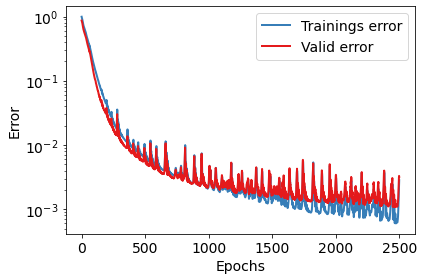

In [ ]:
def RNN(sensor_number, seq_len, bottle_neck, **kwargs):    
  print('sensor_number =',sensor_number,'seq_len = ',seq_len)
  hidden_size = 50
  layers = 1
  seq_impct = int((seq_len-1)/2)

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats,x_cord  = ARE_train_data(sensor_number, 
                                                                                                              bottle_neck,
                                                                                                              seq_len, 
                                                                                                              drop =kwargs.get('drop',None), 
                                                                                                              data_noise=None))
  del(gtest_stan, stest_in_stacked)
  train = sensorgcdatasetRNN(strain_in, gtrain_out)
  valid = sensorgcdatasetRNN(svalid_in, gvalid_out)
  print(strain_in.shape)
  print(gtrain_out.shape)
  print(svalid_in.shape)
  print(gvalid_out.shape)

  bs = len(train)  # batch size
  print(bs)
  bsv = len(valid)
  print(bsv)
  train_data_gen = torch.utils.data.DataLoader(train, shuffle=False, batch_size=bs)
  valid_data_gen = torch.utils.data.DataLoader(valid, shuffle=False, batch_size=bsv)
  dataloaders = {'train': train_data_gen, 'valid':valid_data_gen}
  dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}
  batch ={'train':bs, 'valid':bsv}
  # Setting up the neural network
  model = RNNv3network(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

  # Loss and Optimizer
  #criterion = nn.MSELoss(reduction='mean').to(device)
  criterion = nn.MSELoss().to(device)
  #optimizer = torch.optim.Adam(model.parameters(), lr=0.008, betas=(0.8, 0.8), eps=1e-08, weight_decay=0.01,)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.0006,  weight_decay=1e-5)
  #optimizer = torch.optim.SGD(model.parameters(), lr=0.06, momentum=0.9)
  #exp_lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[500], gamma=0.1)

  num_epochs = 2500
  prev_loss = 100  # large number
  stop = 0
  rerror_train = []
  rerror_valid = []
  for epochs in range(num_epochs):
    for phase in ['train','valid']:
      running_loss=0
      if phase == 'train':
        model.train()
      else:
        model.eval()
      #print(phase)
      for i, (sensor, gc) in enumerate(dataloaders[phase]):
          #print(sensor)
          kk = 0
          y = torch.zeros(seq_len, batch[phase], sensor_number)
          for i in range(0, batch[phase]):
              for j in range(0, seq_len):
                try:
                  y[j, i,:] = sensor[i, sensor_number*j: sensor_number*j + sensor_number]
                except:
                  kk = 9
                  break
          if kk==9:
            break
          #print('expended')
          #print(y)
          sensor = Variable(y).to(device)
          gc = Variable(gc).to(device)

          # clear gradients
          optimizer.zero_grad()
          # forward
          gc_out = model(sensor)
          #print(gc_out,gc)

          # calculate loss
          loss = criterion(gc_out, gc)
          if phase=='train':
            #backward
            loss.backward()
            #update weights
            optimizer.step()
            #exp_lr_scheduler.step()

          running_loss = gc_out.shape[0] * loss.data + running_loss

      if phase == 'train':
        train_epoch_loss = running_loss/dataset_sizes[phase]
      elif phase == 'valid':
        valid_epoch_loss = running_loss/dataset_sizes[phase]
    stop = stop + 1

    if (valid_epoch_loss < prev_loss):
      model_wts = model.state_dict()
      prev_loss = valid_epoch_loss
      prev_T_loss = train_epoch_loss
      #print('({}) Training Loss: {:.8f} NEW Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
      stop = 0
      output_last = gc_out
      gc_last = gc
      Z = []
      for  param in model.parameters():
        z = param.cpu().detach().numpy()
        Z.append(z)

    else:
      nothing = 1
      #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))
    
    if stop == 230:
        print('Early stopping criteria fulfilled')
        j = 0
        for  param in model.parameters():
          param.data = torch.from_numpy(Z[j]).to(device)
          j = j+1  
        optimizer = torch.optim.SGD(model.parameters(), lr=0.0005, momentum=0.9)
        #break
    rerror_train.append(train_epoch_loss)
    rerror_valid.append(valid_epoch_loss)

  #plot_image(output_last, img_last, gstats)
  print('({}) BEST_Training Loss: {:.8f} BEST_Valid Loss: {:.8f} '.format(epochs, prev_T_loss, prev_loss))
  print('overrrrrrrrrrrrrr')
  plot_graph(rerror_train,rerror_valid)

  torch.save(model_wts, '../content/drive/My Drive/Colab Notebooks/RNNv3_s{}_sq{}_bn{}_D3_weights'.format(sensor_number,seq_len, bottle_neck))

#(2099) BEST_Training Loss: 0.00088292 BEST_Valid Loss: 0.00148734 
#(2999) BEST_Training Loss: 0.00059425 BEST_Valid Loss: 0.00144180
for s in [10]:#[1,2,5,10]:
  for seq_len in [15]:#[3,7,11,15]:
    bn = 25
    RNN(s,seq_len, bn)

In [ ]:
class RNNv3network(nn.Module):

    DROPOUT = 0.5

    def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
        super(RNNv3network, self).__init__()
        self.hidden_size = hidden_size

        # Recurrent layers
        self.rl = nn.RNN(sensor_number , self.hidden_size, num_layers=layers, nonlinearity = 'relu')#, dropout=self.DROPOUT)
        self.rlr = nn.RNN(sensor_number, self.hidden_size, num_layers=layers, nonlinearity = 'relu')#, dropout=self.DROPOUT)

        # Final feed-forward layer
        self.l1 = nn.Linear(hidden_size*2, 200, bias=True)
        self.l2 = nn.Linear(200, 200, bias=True)
        self.l3 = nn.Linear(200, bottle_neck, bias=True)
        #self.reset_hidden_states()


    def reset_hidden_states(self, for_batch=None):
        if for_batch is not None:
            batch_size = for_batch.shape[1]

        # Initialize recurrent hidden states
        self.rl_h = self.init_hidden(batch_size=batch_size)
        self.rlr_h = self.init_hidden(batch_size=batch_size)

        if for_batch is not None:
            device = for_batch.device
            self.rl_h = self.rl_h.to(device)
            self.rlr_h = self.rlr_h.to(device)


    def init_hidden(self, batch_size):
        layers =1
        return Variable(torch.zeros(layers, batch_size, self.hidden_size))


    def forward(self, leading_dna):
        self.reset_hidden_states(for_batch=leading_dna)
        
        batch = len(leading_dna[0,:,0])
        #print(batch)
        sensor_number = len(leading_dna[0,0,:])
        #print(sensor_number)
        seq_len = len(leading_dna[:,0,0])
        #print(seq_len)
        seq_impct = int((seq_len-1)/2)

        split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
        split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
        split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
        split_data2 = leading_dna[seq_impct:seq_len,:,:]

        rl_out, self.rl_h = self.rl(split_data1, self.rl_h)
        #print('forward_in')
        #print(split_data1)
        #print('first_layer_out')
        #print(rl_out)
        rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), self.rlr_h)
        #print('fliped_input')
        #print(self.flip_input(split_data2))
        #print('fliped_output')
        #print(rlr_out)
        r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)
        #print('concated_middel_layer output')
        #print(r_out)
        l1_out = F.relu(self.l1(r_out))
        l2_out = F.relu(self.l2(l1_out))
        l3_out = self.l3(l2_out)
        return l3_out


    def flip_input(self, input):
        device = input.device
        flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
        return Variable(torch.from_numpy(flipped_array).to(device))

In [ ]:
if args.operation_mode == 'offline':
  class RNNv3network(nn.Module):

      DROPOUT = 0.5

      def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
          super(RNNv3network, self).__init__()
          self.hidden_size = hidden_size

          # Recurrent layers
          self.rl = nn.RNN(sensor_number , self.hidden_size, num_layers=layers, nonlinearity = 'relu')#, dropout=self.DROPOUT)
          self.rlr = nn.RNN(sensor_number, self.hidden_size, num_layers=layers, nonlinearity = 'relu')#, dropout=self.DROPOUT)

          # Final feed-forward layer
          self.l1 = nn.Linear(hidden_size*2, 200, bias=True)
          self.l2 = nn.Linear(200, 200, bias=True)
          self.l3 = nn.Linear(200, bottle_neck, bias=True)
          #self.reset_hidden_states()


      def reset_hidden_states(self, for_batch=None):
          if for_batch is not None:
              batch_size = for_batch.shape[1]

          # Initialize recurrent hidden states
          self.rl_h = self.init_hidden(batch_size=batch_size)
          self.rlr_h = self.init_hidden(batch_size=batch_size)

          if for_batch is not None:
              device = for_batch.device
              self.rl_h = self.rl_h.to(device)
              self.rlr_h = self.rlr_h.to(device)


      def init_hidden(self, batch_size):
          layers =1
          return Variable(torch.zeros(layers, batch_size, self.hidden_size))


      def forward(self, leading_dna):
          self.reset_hidden_states(for_batch=leading_dna)
          
          batch = len(leading_dna[0,:,0])
          #print(batch)
          sensor_number = len(leading_dna[0,0,:])
          #print(sensor_number)
          seq_len = len(leading_dna[:,0,0])
          #print(seq_len)
          seq_impct = int((seq_len-1)/2)

          split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
          split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
          split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
          split_data2 = leading_dna[seq_impct:seq_len,:,:]

          rl_out, self.rl_h = self.rl(split_data1, self.rl_h)
          #print('forward_in')
          #print(split_data1)
          #print('first_layer_out')
          #print(rl_out)
          rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), self.rlr_h)
          #print('fliped_input')
          #print(self.flip_input(split_data2))
          #print('fliped_output')
          #print(rlr_out)
          r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)
          #print('concated_middel_layer output')
          #print(r_out)
          l1_out = F.relu(self.l1(r_out))
          l2_out = F.relu(self.l2(l1_out))
          l3_out = self.l3(l2_out)
          return l3_out


      def flip_input(self, input):
          device = input.device
          flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
          return Variable(torch.from_numpy(flipped_array).to(device))

In [ ]:
class RNNv3network(nn.Module):

    def __init__(self, hidden_size,sensor_number, bottle_neck, layers, seq_len):
        super(RNNv3network, self).__init__()
        self.hidden_size = hidden_size

        # Recurrent layers
        # nn.LSTM()
        self.rl = nn.LSTM(sensor_number , self.hidden_size, num_layers=layers)#, dropout=0.5)#, nonlinearity = 'relu')#)
        self.rlr = nn.LSTM(sensor_number, self.hidden_size, num_layers=layers)#, dropout=0.5)#, nonlinearity = 'relu')#)

        # Final feed-forward layer
        self.l1 = nn.Linear(hidden_size*2, 50, bias=True)
        self.l2 = nn.Linear(500, 500, bias=True)
        self.l3 = nn.Linear(500, bottle_neck, bias=True)
        # self.dropout = nn.Dropout(p=0.5)   #dropout after relu
        # self.bn = nn.BatchNorm1d(num_features=50)   #bn before relu
        # self.bn_25 = nn.BatchNorm1d(num_features=25)
        #self.reset_hidden_states()


    def reset_hidden_states(self, for_batch=None):
        if for_batch is not None:
            batch_size = for_batch.shape[1]

        # Initialize recurrent hidden states
        self.rl_h = self.init_hidden(batch_size=batch_size)
        self.rlr_h = self.init_hidden(batch_size=batch_size)
        self.rl_c = self.init_hidden(batch_size=batch_size)
        self.rlr_c = self.init_hidden(batch_size=batch_size)

        if for_batch is not None:
            device = for_batch.device
            self.rl_h = self.rl_h.to(device)
            self.rlr_h = self.rlr_h.to(device)
            self.rl_c = self.rl_c.to(device)
            self.rlr_c = self.rlr_c.to(device)


    def init_hidden(self, batch_size):
        layers =1
        return Variable(torch.zeros(layers, batch_size, self.hidden_size))


    def forward(self, leading_dna):
        self.reset_hidden_states(for_batch=leading_dna)
        
        batch = len(leading_dna[0,:,0])
        #print(batch)
        sensor_number = len(leading_dna[0,0,:])
        #print(sensor_number)
        seq_len = len(leading_dna[:,0,0])
        #print(seq_len)
        seq_impct = int((seq_len-1)/2)

        split_data1 = torch.zeros(seq_impct+1,batch,sensor_number)
        split_data2 = torch.zeros(seq_impct+1,batch,sensor_number)
        split_data1 = leading_dna[0:seq_impct+1,:,:] #(seq_impct+1,batch,sensor_number)
        split_data2 = leading_dna[seq_impct:seq_len,:,:]

        rl_out, self.rl_h= self.rl(split_data1, (self.rl_h, self.rl_c))
        #print('forward_in')
        #print(split_data1)
        #print('first_layer_out')
        #print(rl_out)
        rlr_out, self.rlr_h = self.rlr(self.flip_input(split_data2), (self.rlr_h, self.rlr_c))
        #print('fliped_input')
        #print(self.flip_input(split_data2))
        #print('fliped_output')
        #print(rlr_out)
        r_out = torch.cat((rl_out[seq_impct], rlr_out[seq_impct]), 1)
        #print('concated_middel_layer output')
        #print(r_out)
        l1_out = F.relu(self.l1(r_out))
        # l1_out = self.bn(l1_out)
        # l1_out = self.dropout(l1_out)
        l2_out = F.relu(self.l2(l1_out))
        # l2_out = self.dropout(l2_out)# = nn.functional.dropout(x, p=0.1, training=self.training) 
        # l2_out = self.bn(l2_out)
        l3_out = self.l3(l2_out)
        # l3_out = self.bn_25(l3_out)
        return l3_out


    def flip_input(self, input):
        device = input.device
        flipped_array = np.flip(input.data.cpu().numpy(), 0).copy()
        return Variable(torch.from_numpy(flipped_array).to(device))

In [ ]:



  trainAE, validAE, testAE, stats = autoencoder_train_data(drop=0, SNR=10)
  # trainAE_stan = trainAE
  trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
  # print(np.mean(stats[1, :]),stats[1, :])

  nx=168
  ny=251
  ns = nx*ny
  x2 = np.arange(0, ny, 1)
  y2 = np.arange(0, nx, 1)
  mX, mY = np.meshgrid(x2, y2)
  x_cord = sensor_cord_data(sensor_num = 1)

  for i in [0,9,19,25,27,30]:
      t_predd = td[i,:].reshape((ny, nx))
      print('reconstruction',i)
      minmax = np.max(np.abs(t_predd)) * 0.65
      plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,5.29))
      im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
      plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
      plt.show()
  # for i in range(30,31):
      # td_n2[i,300:500] =-867.88
      # t_predd = td_n2[i].reshape((ny, nx))
      # t_predd = trainAE_stan[i].reshape((ny, nx))
      # minmax = np.log(np.max(np.abs(t_predd)) * .65)
      # t_preddp = np.log(trainAE_stan[i].reshape((ny, nx)))
      # t_preddn = np.log(-trainAE_stan[i].reshape((ny, nx)))
      # t_predd = t_preddp - t_preddn
      # minmax = np.log(np.max(np.abs(t_predd)) * .65)
      # print('reconstruction',i)
      # plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,5.29))
      # im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
      # # plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
      # plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
      # plt.show()
  # for i in range(77,78):
  #     t_predd = td[i,:].reshape((ny, nx))
  #     print('reconstruction',i)
  #     minmax = np.max(np.abs(t_predd)) * 0.65
  #     plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,5.29))
  #     im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
  #     plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
  #     #plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
  #     plt.show()

In [ ]:
import random

def autoencoder_train_data(**kwargs):
  if kwargs.get('drop',None):
    print('in autoencoder_train_data--noise data', 'SNR =',kwargs.get('SNR',10))
    
    td_n2 = np.zeros((300,42168))
    # td_n2 = awgn(td,10)
    for i in range(len(td)):
      td_n2[i,:] = awgn(td[i],kwargs.get('SNR',10))

    trainAE = td_n2[0:180,:]
    len_tr = len(trainAE)
    validAE = td_n2[180:240,:]
    testAE = td_n2[240:300,:]  

    nx=168
    ny=251
    ns = nx*ny
    x2 = np.arange(0, ny, 1)
    y2 = np.arange(0, nx, 1)
    mX, mY = np.meshgrid(x2, y2)

    # t_predd = testAE[39,:].reshape((ny, nx))
    # #print('reconstruction',i)
    # minmax = np.max(np.abs(t_predd)) * 0.65
    # plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    # im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    # # plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    # # plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    # im_name = 'im_true_39_noise_SNR{}.eps'.format(kwargs.get('SNR',10))
    # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4/noise/{}'.format(im_name),format='eps')
    # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/noise/{}'.format(im_name))
    # plt.show()


  else :
    print('in autoencoder_train_data-- no noise data')
    len_tr =180
    trainAE = td[0:len_tr,:]
    validAE = td[180:240,:]
    testAE = td[240:300,:]

  AE_mean = np.mean(td[0:len_tr,:], axis = 0)
  AE_std = np.std(td[0:len_tr,:], axis = 0) 
  stats = np.array([AE_mean, AE_std])
  stats[stats==0] = 0.0000001
  #plt.figure()
  #plt.imshow(trainAE.reshape(90, 384, 199)[2,:,:])
  #plt.show
  return trainAE, validAE, testAE, stats

def mn():
  m = 251
  n= 168
  return m,n

def sensor_cord_data(sensor_num):
  m,n = mn()
  theata = np.linspace(0, 2*np.pi, 300)
  x_cord = np.round(25 * np.cos(theata)) + 0
  y_cord = np.round(25 * np.sin(theata)) + 169/2
  cords = np.vstack((x_cord,y_cord)).T
  x_cord = np.unique(cords, axis=0)
  idx = x_cord[:,0] > 0
  x_cord = x_cord[idx,:]
  np.random.seed(3265)
  idx = np.random.choice(range(x_cord.shape[0]), sensor_num, False)
  #print(idx,'idx')
  x_cord = np.int64(x_cord[idx,:])
  return x_cord


In [ ]:
def ADS_train_data(sensor_num, bottle_neck, **kwargs):

  trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
  total = np.concatenate((trainAE, validAE, testAE), axis=0)
  train = sensorgcdatasetAE(total, stats)

  if kwargs.get('drop',None):
    pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck);
  else:
    pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_bn{}_weights'.format(bottle_neck);
  
  train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))
  model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
  model.load_state_dict(torch.load(pretrained_weightsAE))
  model.eval()
  for data in enumerate(train_data_gen):
    img = data[1]
    img = Variable(img).to(device)
    waste,gg = model(img)
    gtotal_out = gg.cpu().data.numpy()
    del(img,waste,gg)
    #print(gtotal_out,gtotal_out.shape)
    #print(gtotal_out.shape,'gtotal_out')

  del(model,total,train,data)
  len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
  len_train = len(trainAE[:,0])

  gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])
  gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)
  #print(gtotal.shape)
  del(gtotal_out,pretrained_weightsAE)

  gtrain_out = gtotal[:len_train, :]
  #print(gtrain_out.shape)
  gvalid_out = gtotal[len_train: len_train_and_valid,:]
  #print(gvalid_out.shape)
  gtest = gtotal[len_train_and_valid : len(gtotal[:,0]),:]
  #print(gtest.shape)
  del(gtotal)
  ###################################################################
  #m, n = 251, 168
  #sensor_num = sensor_num

  #mask = np.zeros((m,n))
  #x_cord = sensor_cord_data(m,n,sensor_num)
  #gc_pred = gvalid_out * gstats[1, :] + gstats[0, :]

  #kAA =  251*168

  #pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnvalid_Ds_bn25_weights';

  #trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  #del(trainAE,testAE)
  #statsAE = stats
  #model = autoencoder(bottle_neck)

  #model.load_state_dict(torch.load(pretrained_weightsAE))
  #del(pretrained_weightsAE)
  #model.eval()

  #testAA = sensorgcdatasetAA(gc_pred, validAE[:,:], statsAE)
  #train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

  #t_pred = np.zeros([399, kAA])
  #t_true = np.zeros([399, kAA])
  #print('jijijij')

  #for i, (gc_pre, t) in enumerate(train_data_genn):
  #    t_out_tensor = model(gc_pre[None, :])
  #    t_out = t_out_tensor.data.numpy()
  #    t_pred[i, :] = t_out
  #    t_true[i, :] = t
  #    #print(t_out_tensor.shape)
  #    if i == 60 or i ==340 or i ==380 or i ==200 or i==300:
  #      plot_image(t_out_tensor, t, statsAE, x_cord)
  #del(t_pred,t_true,testAA)
  ######################################################################

  trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
  validAE_stan = (validAE - stats[0, :])/stats[1, :]
  testAE_stan = (testAE - stats[0, :])/stats[1, :]
  del(trainAE,validAE,testAE)

  n_snapshots_train, n_pix = trainAE_stan.shape
  n_snapshots_valid, _ = validAE_stan.shape
  n_snapshots_test, __ = testAE_stan.shape

  m, n = mn()
  sensor_num = sensor_num

  mask = np.zeros((m,n))
  x_cord = sensor_cord_data(sensor_num)
  mask[x_cord[:,0], x_cord[:,1]] = 1
  pivots = np.where(mask.reshape(-1) == 1)
  pivots = np.asarray(pivots).ravel()

  strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
  svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
  stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
  #print(svalid_in.shape)
  del(trainAE_stan,validAE_stan,testAE_stan)

  return gtrain_out, gvalid_out, strain_in, svalid_in, gtest, stest_in, gstats, x_cord

In [ ]:
if args.data_type == 'transient':
if args.operation_mode == 'online':
  def ARE_train_data(sensor_num, bottle_neck, seq_len, **kwargs):

    seq_impct = int((seq_len-1)/2)

    print('in rrntriandata',kwargs.get('drop',None))
    trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
    total = np.concatenate((trainAE, validAE, testAE), axis=0)
    print(trainAE.shape)
    print(validAE.shape)
    train = sensorgcdatasetAE(total, stats)
    if kwargs.get('drop',None):
      pretrained_weightsAE = osp.join(path2, 'nnv2_Ds33_dropout_bn{}_weights'.format(bottle_neck))
      # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck);
    else:
      pretrained_weightsAE = osp.join(path2, 'nnv2_Ds_bn{}_weights'.format(bottle_neck))
      # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_bn{}_weights'.format(bottle_neck)
    
    train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))#)
    model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
    model.load_state_dict(torch.load(pretrained_weightsAE))
    model.eval()
    for data in enumerate(train_data_gen):
      img = data[1]
      img = Variable(img).to(device)
      waste,gg = model(img)
      del(waste,img)
      gtotal_out = gg.cpu().data.numpy()
      del(gg)
      #print(gtotal_out,gtotal_out.shape)
      #print(gtotal_out.shape,'gtotal_out')

    len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
    len_train = len(trainAE[:,0])

    gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)
    #print(gtotal.shape)
    #ii = (gtotal_out[4,:] - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)
    #if ii.all() == gtotal[4,:].all():
      #print('perfect')

    # gtrain_out = gtotal[seq_impct:len_train - seq_impct, :] 
    gtrain_out = gtotal[seq_impct:len_train, :] 
    #print(gtrain_out.shape)
    ######################################### Deleting rows in between junction of 180 190 and 200
    # del_row = np.array([])
    # for e in range(int(len_train/3)- seq_impct, int(len_train/3)+ seq_impct): # if seq_impct=2 (397. 398. 399. 400.)
    #   del_row = np.append(del_row, [e], axis=0)    #len_train/3 = 399
    # for e in range(int(len_train*2/3)- seq_impct , int(len_train*2/3)+ seq_impct):  #if seq_impct=2 (796. 797. 798. 799.)
    #   del_row = np.append(del_row, [e], axis=0)
    # np.delete(gtrain_out, del_row, 0)
    # print(del_row)
    ##########

    gvalid_out = gtotal[len_train+seq_impct: len_train_and_valid,:]
    #print('len_train+seq_impct = ', len_train+seq_impct, 'len_train_and_valid-seq_impct = ', len_train_and_valid-seq_impct, 'len_train_and_valid+seq_impct = ', len_train_and_valid+seq_impct, 'total[:,0])-seq_impct =', len(total[:,0])-seq_impct)
    gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0]),:]
    #print(gtest.shape)
    del(total,train,gtotal)
    #########################################  Standardizing trainAE
    trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
    validAE_stan = (validAE - stats[0, :])/stats[1, :]
    testAE_stan = (testAE - stats[0, :])/stats[1, :]
    #########
    gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])

    del(trainAE,validAE,testAE)

    n_snapshots_train, n_pix = trainAE_stan.shape
    #print('n_snapshots_train = ',n_snapshots_train )
    n_snapshots_valid, _ = validAE_stan.shape
    n_snapshots_test, __ = testAE_stan.shape
    m, n = 251, 168
    sensor_num = sensor_num

    mask = np.zeros((m,n))
    x_cord = sensor_cord_data(sensor_num)

    #print(x_cord[:,0])
    #print(x_cord[:,1])

    mask[x_cord[:,0], x_cord[:,1]] = 1
    pivots = np.where(mask.reshape(-1) == 1)
    pivots = np.asarray(pivots).ravel()

    strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
    svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
    stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
    # print('strain_in =',strain_in.shape)
    # print('svalid_in  = ',svalid_in.shape,'ok')
    # print('stest_in = ',stest_in.shape)
    # strain_in_stacked = np.zeros((n_snapshots_train-seq_impct,seq_len*sensor_num))
    # svalid_in_stacked = np.zeros((n_snapshots_valid-seq_impct,seq_len*sensor_num))
    # stest_in_stacked = np.zeros((n_snapshots_test-seq_impct,seq_len*sensor_num))
    strain_in_stacked = np.zeros((n_snapshots_train-seq_impct,(seq_impct+1)*sensor_num))
    svalid_in_stacked = np.zeros((n_snapshots_valid-seq_impct,(seq_impct+1)*sensor_num))
    stest_in_stacked = np.zeros((n_snapshots_test-seq_impct,(seq_impct+1)*sensor_num))

    for i in range(0,n_snapshots_train-seq_impct) :
      if seq_len == 3 :
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:]),axis = None)
      elif seq_len == 5:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:]),axis = None)
        #print(strain_in.shape,'okok')
      elif seq_len == 7:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:]),axis = None)
      elif seq_len == 9:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:]),axis = None)  
      elif seq_len == 11:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:]),axis = None)  
      elif seq_len == 15:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:]),axis = None)  

    #np.delete(strain_in_stacked, del_row-1, 0)
    #print(strain_in_stacked)
    for i in range(0,n_snapshots_valid-seq_impct) :
      if seq_len == 3:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:]),axis = None)
      elif seq_len == 5:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:]),axis = None)
      elif seq_len == 7:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:]),axis = None)
      elif seq_len == 9:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:]),axis = None)  
      elif seq_len == 11:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:]),axis = None)  
      elif seq_len == 15:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:]),axis = None)  

    for i in range(0,n_snapshots_test-seq_impct) :
      if seq_len == 3:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:]),axis = None)
      elif seq_len == 5:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:]),axis = None)
      elif seq_len == 7:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:]),axis = None)
      elif seq_len == 9:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:]),axis = None)  
      elif seq_len == 11:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:]),axis = None)  
      elif seq_len == 15:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:]),axis = None)  

    # #print(svalid_in.shape)
    # if strain_in_stacked[177,2 ] == strain_in[179,0] and strain_in_stacked[1,2 ] == strain_in[3,0] and stest_in_stacked[57,2 ] == stest_in[59,0] and stest_in_stacked[1,2 ] == stest_in[3,0] :
    #   print('perfecttt')

    # print('strain_in_stacked[0] = ',strain_in_stacked[0])
    # print('gtrain_out[0]  =', gtrain_out[0])
    # print('svalid_in_stacked[0] = ',svalid_in_stacked[0])
    # print('gvalid_out[0]  =', gvalid_out[0])
    # print('stest_in_stacked[0] = ',stest_in_stacked[0])
    # print('gtest[0]  =', gtest[0])

    return gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, x_cord


In [ ]:
if args.operation_mode == 'offline':
  def ARE_train_data(sensor_num, bottle_neck, seq_len, **kwargs):

    seq_impct = int((seq_len-1)/2)

    print('in rrntriandata',kwargs.get('drop',None))
    trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
    total = np.concatenate((trainAE, validAE, testAE), axis=0)
    print(trainAE.shape)
    print(validAE.shape)
    train = sensorgcdatasetAE(total, stats)
    if kwargs.get('drop',None):
      pretrained_weightsAE = osp.join(path2, 'nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck))
      # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck);
    else:
      pretrained_weightsAE = osp.join(path2, 'nnv2_Ds_bn{}_weights'.format(bottle_neck))
      # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_bn{}_weights'.format(bottle_neck)
    
    train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))#)
    model = autoencoder(bottle_neck, drop=kwargs.get('drop',None)).to(device)
    model.load_state_dict(torch.load(pretrained_weightsAE))
    model.eval()
    for data in enumerate(train_data_gen):
      img = data[1]
      img = Variable(img).to(device)
      waste,gg = model(img)
      del(waste,img)
      gtotal_out = gg.cpu().data.numpy()
      del(gg)
      #print(gtotal_out,gtotal_out.shape)
      #print(gtotal_out.shape,'gtotal_out')

    len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
    len_train = len(trainAE[:,0])

    gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)
    #print(gtotal.shape)
    #ii = (gtotal_out[4,:] - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)
    #if ii.all() == gtotal[4,:].all():
      #print('perfect')

    # gtrain_out = gtotal[seq_impct:len_train - seq_impct, :] 
    gtrain_out = gtotal[seq_impct:len_train - seq_impct, :] 
    #print(gtrain_out.shape)
    ######################################### Deleting rows in between junction of 180 190 and 200
    # del_row = np.array([])
    # for e in range(int(len_train/3)- seq_impct, int(len_train/3)+ seq_impct): # if seq_impct=2 (397. 398. 399. 400.)
    #   del_row = np.append(del_row, [e], axis=0)    #len_train/3 = 399
    # for e in range(int(len_train*2/3)- seq_impct , int(len_train*2/3)+ seq_impct):  #if seq_impct=2 (796. 797. 798. 799.)
    #   del_row = np.append(del_row, [e], axis=0)
    # np.delete(gtrain_out, del_row, 0)
    # print(del_row)
    ##########

    gvalid_out = gtotal[len_train+seq_impct: len_train_and_valid - seq_impct,:]
    #print('len_train+seq_impct = ', len_train+seq_impct, 'len_train_and_valid-seq_impct = ', len_train_and_valid-seq_impct, 'len_train_and_valid+seq_impct = ', len_train_and_valid+seq_impct, 'total[:,0])-seq_impct =', len(total[:,0])-seq_impct)
    gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0] - seq_impct),:]
    #print(gtest.shape)
    del(total,train,gtotal)
    #########################################  Standardizing trainAE
    trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
    validAE_stan = (validAE - stats[0, :])/stats[1, :]
    testAE_stan = (testAE - stats[0, :])/stats[1, :]
    #########
    gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])

    del(trainAE,validAE,testAE)

    n_snapshots_train, n_pix = trainAE_stan.shape
    #print('n_snapshots_train = ',n_snapshots_train )
    n_snapshots_valid, _ = validAE_stan.shape
    n_snapshots_test, __ = testAE_stan.shape
    m, n = mn()# 251, 168
    sensor_num = sensor_num

    mask = np.zeros((m,n))
    x_cord = sensor_cord_data(sensor_num)

    #print(x_cord[:,0])
    #print(x_cord[:,1])

    mask[x_cord[:,0], x_cord[:,1]] = 1
    pivots = np.where(mask.reshape(-1) == 1)
    pivots = np.asarray(pivots).ravel()

    strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
    svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
    stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
    # print('strain_in =',strain_in.shape)
    # print('svalid_in  = ',svalid_in.shape,'ok')
    # print('stest_in = ',stest_in.shape)
    strain_in_stacked = np.zeros((n_snapshots_train-2*seq_impct,seq_len*sensor_num))
    svalid_in_stacked = np.zeros((n_snapshots_valid-2*seq_impct,seq_len*sensor_num))
    stest_in_stacked = np.zeros((n_snapshots_test-2*seq_impct,seq_len*sensor_num))

    for i in range(0,n_snapshots_train-2*seq_impct) :
      if seq_len == 3 :
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:]),axis = None)
      elif seq_len == 5:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:], strain_in[i+3,:], strain_in[i+4,:]),axis = None)
        #print(strain_in.shape,'okok')
      elif seq_len == 7:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:]),axis = None)
      elif seq_len == 9:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:]),axis = None)  
      elif seq_len == 11:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:], strain_in[i+9,:], strain_in[i+10,:]),axis = None)  
      elif seq_len == 15:
        strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:], strain_in[i+9,:], strain_in[i+10,:], strain_in[i+11,:], strain_in[i+12,:], strain_in[i+13,:], strain_in[i+14,:]),axis = None)  

    #np.delete(strain_in_stacked, del_row-1, 0)
    #print(strain_in_stacked)
    for i in range(0,n_snapshots_valid-2*seq_impct) :
      if seq_len == 3:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:]),axis = None)
      elif seq_len == 5:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:], svalid_in[i+4,:]),axis = None)
      elif seq_len == 7:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:], svalid_in[i+4,:], svalid_in[i+5,:], svalid_in[i+6,:]),axis = None)
      elif seq_len == 9:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:]),axis = None)  
      elif seq_len == 11:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:], svalid_in[i+9,:], svalid_in[i+10,:]),axis = None)  
      elif seq_len == 15:
        svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:], svalid_in[i+9,:], svalid_in[i+10,:], svalid_in[i+11,:], svalid_in[i+12,:],  svalid_in[i+13,:], svalid_in[i+14,:]),axis = None)  

    for i in range(0,n_snapshots_test-2*seq_impct) :
      if seq_len == 3:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:]),axis = None)
      elif seq_len == 5:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:], stest_in[i+4,:]),axis = None)
      elif seq_len == 7:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:], stest_in[i+4,:], stest_in[i+5,:], stest_in[i+6,:]),axis = None)
      elif seq_len == 9:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:]),axis = None)  
      elif seq_len == 11:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:], stest_in[i+9,:], stest_in[i+10,:]),axis = None)  
      elif seq_len == 15:
        stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:], stest_in[i+9,:], stest_in[i+10,:], stest_in[i+11,:], stest_in[i+12,:], stest_in[i+13,:], stest_in[i+14,:]),axis = None)  

    # #print(svalid_in.shape)
    # if strain_in_stacked[177,2 ] == strain_in[179,0] and strain_in_stacked[1,2 ] == strain_in[3,0] and stest_in_stacked[57,2 ] == stest_in[59,0] and stest_in_stacked[1,2 ] == stest_in[3,0] :
    #   print('perfecttt')

    # print('strain_in_stacked[0] = ',strain_in_stacked[0])
    # print('gtrain_out[0]  =', gtrain_out[0])
    # print('svalid_in_stacked[0] = ',svalid_in_stacked[0])
    # print('gvalid_out[0]  =', gvalid_out[0])
    # print('stest_in_stacked[0] = ',stest_in_stacked[0])
    # print('gtest[0]  =', gtest[0])

    return gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, x_cord


In [ ]:
def PDS_train_data(sensor_num, bottle_neck, **kwargs):
  
  trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
  #total = np.concatenate((trainAE, validAE), axis=0)
  mean = np.mean(trainAE, axis = 0)
  X = trainAE - mean
  X = X.transpose()
  #phi = POD(X)
  phi, s, V = np.linalg.svd(X,full_matrices=False)
  del(s,V)
  phi = phi[:,0:bottle_neck]

  gtrain_transpose = np.dot(phi.transpose(),X)
  del(X)
  gtotal_out = gtrain_transpose.transpose()
  del(gtrain_transpose)
  gtrain_out = (gtotal_out - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)

  XX = validAE - np.mean(trainAE, axis = 0)
  XX = XX.transpose()
  gvalid_transpose = np.dot(phi.transpose(),XX)
  del(XX)
  gvalid_out = gvalid_transpose.transpose()
  del(gvalid_transpose)
  gvalid_out = (gvalid_out - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)

  XXX = testAE - np.mean(trainAE, axis = 0)
  XXX = XXX.transpose()
  gtest_transpose = np.dot(phi.transpose(),XXX)
  del(XXX)
  gtest_out = gtest_transpose.transpose()
  del(gtest_transpose)
  gtest_out = (gtest_out - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)
  
  gstats = np.array([np.mean(gtotal_out[:,:], axis = 0),np.std(gtotal_out[:,:], axis = 0)])
  del(gtotal_out)


  trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
  del(trainAE)
  validAE_stan = (validAE - stats[0, :])/stats[1, :]
  testAE_stan = (testAE - stats[0, :])/stats[1, :]
 
  del(validAE,testAE)


  n_snapshots_train, n_pix = trainAE_stan.shape
  n_snapshots_valid, _ = validAE_stan.shape
  n_snapshots_test, __ = testAE_stan.shape

  m, n = 251, 168
  sensor_num = sensor_num
  mask = np.zeros((m,n))
  x_cord =sensor_cord_data(sensor_num) 
  mask[x_cord[:,0], x_cord[:,1]] = 1
  pivots = np.where(mask.reshape(-1) == 1)
  pivots = np.asarray(pivots).ravel()


  strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
  #print(strain_in)
  svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
  stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
  #print(svalid_in.shape)

  gc_pod = gtest_out*gstats[1, :] + gstats[0, :]
  t_pred = gc_pod.dot(phi.T) + mean#np.mean(trainAE[:,:].transpose(), axis = 1)

  nx=n
  ny=m
  x2 = np.arange(0, ny, 1)
  y2 = np.arange(0, nx, 1)
  mX, mY = np.meshgrid(x2, y2)
   
  #for i in range(310,355):
    #print(i)
    #t_predd = t_pred[i,:].reshape((ny, nx))
    #minmax = np.max(np.abs(t_predd)) * 0.65
    #plt.figure(facecolor="white",  edgecolor='k', figsize=(6,3))
    #im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    #plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
    #plt.show()

  del(trainAE_stan,validAE_stan,testAE_stan)#,t_pred)
  return gtrain_out, gvalid_out, strain_in, svalid_in, gtest_out, stest_in, gstats, x_cord,phi,mean   



In [ ]:
def plot_graph(rerror_train, rerror_test):
    fig = plt.figure()
    plt.plot(rerror_train, lw=2, label='Trainings error', color='#377eb8',)  
    plt.plot(rerror_test, lw=2, label='Valid error', color='#e41a1c',)            
    plt.tick_params(axis='x', labelsize=14) 
    plt.tick_params(axis='y', labelsize=14) 
    plt.locator_params(axis='y', nbins=10)
    plt.locator_params(axis='x', nbins=10)
    
    plt.ylabel('Error', fontsize=14)
    plt.xlabel('Epochs', fontsize=14)
    plt.grid(False)
    plt.yscale("log")
    plt.legend(fontsize=14)
    fig.tight_layout()

In [ ]:
jk = np.array([8,9])
kl = np.array([1])
jk = np.delete(jk, kl, 0)
print(jk)

[8]


In [ ]:


import random

a = np.array([[1,2,3],[4,5,7]])

vd = []  
res = []  
random.seed(36123)
res = random.sample(range(41), 15)
for j in range(15):
  vd.append(res[j]*3)
  vd.append(vd[j*3]+1)
  vd.append(vd[j*3]+2)
print(vd)

#b = np.array([[2,3],[7,6]])
#c = np.array([a,b])
#print(c)

#trainAE, validAE, waste, stats = autoencoder_train_data()
#print(trainAE,trainAE.shape)
#print(waste,waste.shape)
#print(stats,stats.shape)
#trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
#ii = (trainAE[4,:] - stats[0, :])/stats[1, :]
#if ii.all() == trainAE_stan[4,:].all():
  #print('perfect')
#print(trainAE,'kokok')
#print(trainAE_stan,'kooko')
#cc = np.concatenate((a, b), axis=1)
#print(cc)
#gtrain_out, gvalid_out, X, Y, gtest, Z, gstats = ds_train_data(15)
#print(Y.shape)
#gtrain_out, gvalid_out, X, Y, gtest, Z, gstats = ds_train_data(5)
#print(X)

m, n = 251, 168
sensor_num = 5
xk =sensor_cord_data(m,n,sensor_num)
print(xk)


arr = np.array([[1,2,3,4], [5,6,7,8], [9,10,11,12]])
del_rows = np.array([0,2])
np.delete(arr, del_rows, 0)

In [ ]:
gtrain_out1, gvalid_out1, strain_in_stacked1, svalid_in_stacked1, gtest1, stest_in_stacked1, gstats1, cords1 = ARE_train_data1(5, 25, 7,
                                                                                                                               drop =0, 
                                                                                                              data_noise=None)
gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, cords = ARE_train_data(5, 25, 7,drop =0, 
                                                                                                              data_noise=None)

using previously loaded data
in autoencoder_train_data-- no noise data
without_drop
using previously loaded data
in autoencoder_train_data-- no noise data
without_drop


## ARE_train_data : offline

In [ ]:
if args.data_type == 'transient':
  if args.operation_mode == 'offline':
    def ARE_train_data(sensor_num, bottle_neck, seq_len, **kwargs):

      seq_impct = int((seq_len-1)/2)

      trainAE, validAE, testAE, stats = autoencoder_train_data()
      total = np.concatenate((trainAE, validAE, testAE), axis=0)
      train = sensorgcdatasetAE(total, stats)

      path_to_weights = get_path('are', W_AE=1)
      weights_name = get_name('are', drop=kwargs.get('drop'), W_AE=1, bottle_neck=bottle_neck)
      pretrained_weightsAE = osp.join(path_to_weights, weights_name)
      # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_D3_bn{}_weights'.format(bottle_neck);

      train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))
      model = autoencoder(bottle_neck).to(device)
      model.load_state_dict(torch.load(pretrained_weightsAE))
      model.eval()
      for data in enumerate(train_data_gen):
        img = data[1]
        img = Variable(img).to(device)
        waste,gg = model(img)
        del(waste,img)
        gtotal_out = gg.cpu().data.numpy()
        del(gg)

      len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
      len_train = len(trainAE[:,0])
      
      gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)

      gtrain_out = gtotal[seq_impct:len_train - seq_impct, :] 

      ######################################### Deleting rows in between junction of 180 190 and 200
      del_row = np.array([])
      for e in range(int(len_train/3)- seq_impct, int(len_train/3)+ seq_impct): # if seq_impct=2 (397. 398. 399. 400.)
        del_row = np.append(del_row, [e], axis=0)    #len_train/3 = 399
      for e in range(int(len_train*2/3)- seq_impct , int(len_train*2/3)+ seq_impct):  #if seq_impct=2 (796. 797. 798. 799.)
        del_row = np.append(del_row, [e], axis=0)
      del_row = del_row.astype(int)
      print('del_row =',del_row)
      gtrain_out = np.delete(gtrain_out, del_row, 0)
      print('gtrain_out.shape',gtrain_out.shape)
      ######################################### 

      gvalid_out = gtotal[len_train+seq_impct: len_train_and_valid-seq_impct,:]
      gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0])-seq_impct,:]
      del(total,train,gtotal)
      #########################################  Standardizing trainAE
      trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
      validAE_stan = (validAE - stats[0, :])/stats[1, :]
      testAE_stan = (testAE - stats[0, :])/stats[1, :]
      #########
      gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])

      del(trainAE,validAE,testAE)

      n_snapshots_train, n_pix = trainAE_stan.shape
      n_snapshots_valid, _ = validAE_stan.shape
      n_snapshots_test, __ = testAE_stan.shape
      m, n = mn()
      sensor_num = sensor_num

      mask = np.zeros((m,n))
      s_idx_in_flatten, x_cord = sensor_cord_data(m,n,sensor_num)
      
      #print(x_cord[:,0])
      #print(x_cord[:,1])

      mask[x_cord[:,0], x_cord[:,1]] = 1
      pivots = np.where(mask.reshape(-1) == 1)
      pivots = np.asarray(pivots).ravel()

      strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
      #print(strain_in)
      svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
      #print(svalid_in.shape,'ok')
      stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
      #print(svalid_in.shape)
      strain_in_stacked = np.zeros((n_snapshots_train-2*seq_impct,seq_len*sensor_num))
      svalid_in_stacked = np.zeros((n_snapshots_valid-2*seq_impct,seq_len*sensor_num))
      stest_in_stacked = np.zeros((n_snapshots_test-2*seq_impct,seq_len*sensor_num))
      
      for i in range(0,n_snapshots_train-2*seq_impct) :
        if seq_len == 3 :
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:]),axis = None)
        elif seq_len == 5:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:], strain_in[i+3,:], strain_in[i+4,:]),axis = None)
          #print(strain_in.shape,'okok')
        elif seq_len == 7:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:]),axis = None)
        elif seq_len == 11:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:], strain_in[i+9,:], strain_in[i+10,:]),axis = None)  
        elif seq_len == 15:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:], strain_in[i+9,:], strain_in[i+10,:], strain_in[i+11,:], strain_in[i+12,:], strain_in[i+13,:], strain_in[i+14,:]),axis = None)  
      
      strain_in_stacked = np.delete(strain_in_stacked, del_row-seq_impct, 0)
      print('strain_in_stacked.shape',strain_in_stacked.shape)
      for i in range(0,n_snapshots_valid-2*seq_impct) :
        if seq_len == 3:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:]),axis = None)
        elif seq_len == 5:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:], svalid_in[i+4,:]),axis = None)
        elif seq_len == 7:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:], svalid_in[i+4,:], svalid_in[i+5,:], svalid_in[i+6,:]),axis = None)
        elif seq_len == 11:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:], svalid_in[i+9,:], svalid_in[i+10,:]),axis = None)  
        elif seq_len == 15:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:], svalid_in[i+9,:], svalid_in[i+10,:], svalid_in[i+11,:], svalid_in[i+12,:],  svalid_in[i+13,:], svalid_in[i+14,:]),axis = None)  
      
      for i in range(0,n_snapshots_test-2*seq_impct) :
        if seq_len == 3:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:]),axis = None)
        elif seq_len == 5:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:], stest_in[i+4,:]),axis = None)
        elif seq_len == 7:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:], stest_in[i+4,:], stest_in[i+5,:], stest_in[i+6,:]),axis = None)
        elif seq_len == 11:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:], stest_in[i+9,:], stest_in[i+10,:]),axis = None)  
        elif seq_len == 15:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:], stest_in[i+9,:], stest_in[i+10,:], stest_in[i+11,:], stest_in[i+12,:], stest_in[i+13,:], stest_in[i+14,:]),axis = None)  
      
      #print(svalid_in.shape)
      #if strain_in_stacked[0:121, 0:5].all() == strain_in[0:121,:].all():
        #print('perfecttt')
      return gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, x_cord


if args.data_type == 'periodic':
  if args.operation_mode == 'offline':
    def ARE_train_data1(sensor_num, bottle_neck, seq_len, **kwargs):

      seq_impct = int((seq_len-1)/2)

      trainAE, validAE, testAE, stats = autoencoder_train_data(drop=kwargs.get('data_noise',None), SNR=kwargs.get('SNR',10))
      total = np.concatenate((trainAE, validAE, testAE), axis=0)
      train = sensorgcdatasetAE(total, stats)

      path_to_weights = get_path('are', W_AE=1)
      weights_name = get_name('are', drop=kwargs.get('drop'), W_AE=1, bottle_neck=bottle_neck)
      pretrained_weightsAE = osp.join(path_to_weights, weights_name)
      # if kwargs.get('drop',None):
      #   pretrained_weightsAE = osp.join(path2, 'nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck))
      #   # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_dropout_bn{}_weights'.format(bottle_neck);
      # else:
      #   pretrained_weightsAE = osp.join(path2, 'nnv2_Ds_bn{}_weights'.format(bottle_neck))
      #   # pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_Ds_bn{}_weights'.format(bottle_neck)
      
      train_data_gen = torch.utils.data.DataLoader(train, shuffle =False, batch_size=len(total[:,0]))#)
      model = autoencoder(bottle_neck, drop=kwargs.get('drop')).to(device)
      model.load_state_dict(torch.load(pretrained_weightsAE))
      model.eval()
      for data in enumerate(train_data_gen):
        img = data[1]
        img = Variable(img).to(device)
        waste,gg = model(img)
        del(waste,img)
        gtotal_out = gg.cpu().data.numpy()
        del(gg)
        #print(gtotal_out,gtotal_out.shape)
        #print(gtotal_out.shape,'gtotal_out')

      len_train_and_valid = len(trainAE[:,0])+ len(validAE[:,0])
      len_train = len(trainAE[:,0])

      gtotal = (gtotal_out - np.mean(gtotal_out[0:len_train,:],axis = 0))/np.std(gtotal_out[0:len_train,:], axis = 0)
      #print(gtotal.shape)
      #ii = (gtotal_out[4,:] - np.mean(gtotal_out,axis = 0))/np.std(gtotal_out, axis = 0)
      #if ii.all() == gtotal[4,:].all():
        #print('perfect')

      # gtrain_out = gtotal[seq_impct:len_train - seq_impct, :] 
      gtrain_out = gtotal[seq_impct:len_train - seq_impct, :] 
      #print(gtrain_out.shape)
      ######################################### Deleting rows in between junction of 180 190 and 200
      # del_row = np.array([])
      # for e in range(int(len_train/3)- seq_impct, int(len_train/3)+ seq_impct): # if seq_impct=2 (397. 398. 399. 400.)
      #   del_row = np.append(del_row, [e], axis=0)    #len_train/3 = 399
      # for e in range(int(len_train*2/3)- seq_impct , int(len_train*2/3)+ seq_impct):  #if seq_impct=2 (796. 797. 798. 799.)
      #   del_row = np.append(del_row, [e], axis=0)
      # np.delete(gtrain_out, del_row, 0)
      # print(del_row)
      ##########

      gvalid_out = gtotal[len_train+seq_impct: len_train_and_valid - seq_impct,:]
      #print('len_train+seq_impct = ', len_train+seq_impct, 'len_train_and_valid-seq_impct = ', len_train_and_valid-seq_impct, 'len_train_and_valid+seq_impct = ', len_train_and_valid+seq_impct, 'total[:,0])-seq_impct =', len(total[:,0])-seq_impct)
      gtest = gtotal[len_train_and_valid+seq_impct : len(total[:,0] - seq_impct),:]
      #print(gtest.shape)
      del(total,train,gtotal)
      #########################################  Standardizing trainAE
      trainAE_stan = (trainAE - stats[0, :])/stats[1, :]
      validAE_stan = (validAE - stats[0, :])/stats[1, :]
      testAE_stan = (testAE - stats[0, :])/stats[1, :]
      #########
      gstats = np.array([np.mean(gtotal_out[0:len(trainAE[:,0]),:],axis = 0),np.std(gtotal_out[0:len(trainAE[:,0]),:], axis = 0)])

      del(trainAE,validAE,testAE)

      n_snapshots_train, n_pix = trainAE_stan.shape
      #print('n_snapshots_train = ',n_snapshots_train )
      n_snapshots_valid, _ = validAE_stan.shape
      n_snapshots_test, __ = testAE_stan.shape
      m, n = mn()# 251, 168
      sensor_num = sensor_num

      mask = np.zeros((m,n))
      s_idx_in_flatten, x_cord = sensor_cord_data(sensor_num)

      #print(x_cord[:,0])
      #print(x_cord[:,1])

      mask[x_cord[:,0], x_cord[:,1]] = 1
      pivots = np.where(mask.reshape(-1) == 1)
      pivots = np.asarray(pivots).ravel()

      strain_in = trainAE_stan[:, pivots].reshape(n_snapshots_train, sensor_num)
      svalid_in = validAE_stan[:, pivots].reshape(n_snapshots_valid, sensor_num)
      stest_in = testAE_stan[:, pivots].reshape(n_snapshots_test, sensor_num)
      # print('strain_in =',strain_in.shape)
      # print('svalid_in  = ',svalid_in.shape,'ok')
      # print('stest_in = ',stest_in.shape)
      strain_in_stacked = np.zeros((n_snapshots_train-2*seq_impct,seq_len*sensor_num))
      svalid_in_stacked = np.zeros((n_snapshots_valid-2*seq_impct,seq_len*sensor_num))
      stest_in_stacked = np.zeros((n_snapshots_test-2*seq_impct,seq_len*sensor_num))

      for i in range(0,n_snapshots_train-2*seq_impct) :
        if seq_len == 3 :
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:]),axis = None)
        elif seq_len == 5:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:], strain_in[i+3,:], strain_in[i+4,:]),axis = None)
          #print(strain_in.shape,'okok')
        elif seq_len == 7:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:]),axis = None)
        elif seq_len == 9:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:]),axis = None)  
        elif seq_len == 11:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:], strain_in[i+9,:], strain_in[i+10,:]),axis = None)  
        elif seq_len == 15:
          strain_in_stacked[i,:] = np.concatenate((strain_in[i,:], strain_in[i+1,:], strain_in[i+2,:],strain_in[i+3,:],strain_in[i+4,:],strain_in[i+5,:],strain_in[i+6,:], strain_in[i+7,:],strain_in[i+8,:], strain_in[i+9,:], strain_in[i+10,:], strain_in[i+11,:], strain_in[i+12,:], strain_in[i+13,:], strain_in[i+14,:]),axis = None)  

      #np.delete(strain_in_stacked, del_row-1, 0)
      #print(strain_in_stacked)
      for i in range(0,n_snapshots_valid-2*seq_impct) :
        if seq_len == 3:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:]),axis = None)
        elif seq_len == 5:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:], svalid_in[i+4,:]),axis = None)
        elif seq_len == 7:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], svalid_in[i+1,:], svalid_in[i+2,:], svalid_in[i+3,:], svalid_in[i+4,:], svalid_in[i+5,:], svalid_in[i+6,:]),axis = None)
        elif seq_len == 9:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:]),axis = None)  
        elif seq_len == 11:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:], svalid_in[i+9,:], svalid_in[i+10,:]),axis = None)  
        elif seq_len == 15:
          svalid_in_stacked[i,:] = np.concatenate((svalid_in[i,:], strain_in[i+1,:], svalid_in[i+2,:],svalid_in[i+3,:],svalid_in[i+4,:],svalid_in[i+5,:],svalid_in[i+6,:], svalid_in[i+7,:],svalid_in[i+8,:], svalid_in[i+9,:], svalid_in[i+10,:], svalid_in[i+11,:], svalid_in[i+12,:],  svalid_in[i+13,:], svalid_in[i+14,:]),axis = None)  

      for i in range(0,n_snapshots_test-2*seq_impct) :
        if seq_len == 3:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:]),axis = None)
        elif seq_len == 5:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:], stest_in[i+4,:]),axis = None)
        elif seq_len == 7:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:], stest_in[i+3,:], stest_in[i+4,:], stest_in[i+5,:], stest_in[i+6,:]),axis = None)
        elif seq_len == 9:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:]),axis = None)  
        elif seq_len == 11:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:], stest_in[i+9,:], stest_in[i+10,:]),axis = None)  
        elif seq_len == 15:
          stest_in_stacked[i,:] = np.concatenate((stest_in[i,:], stest_in[i+1,:], stest_in[i+2,:],stest_in[i+3,:],stest_in[i+4,:],stest_in[i+5,:],stest_in[i+6,:], stest_in[i+7,:],stest_in[i+8,:], stest_in[i+9,:], stest_in[i+10,:], stest_in[i+11,:], stest_in[i+12,:], stest_in[i+13,:], stest_in[i+14,:]),axis = None)  

      # #print(svalid_in.shape)
      # if strain_in_stacked[177,2 ] == strain_in[179,0] and strain_in_stacked[1,2 ] == strain_in[3,0] and stest_in_stacked[57,2 ] == stest_in[59,0] and stest_in_stacked[1,2 ] == stest_in[3,0] :
      #   print('perfecttt')

      # print('strain_in_stacked[0] = ',strain_in_stacked[0])
      # print('gtrain_out[0]  =', gtrain_out[0])
      # print('svalid_in_stacked[0] = ',svalid_in_stacked[0])
      # print('gvalid_out[0]  =', gvalid_out[0])
      # print('stest_in_stacked[0] = ',stest_in_stacked[0])
      # print('gtest[0]  =', gtest[0])

      return gtrain_out, gvalid_out, strain_in_stacked, svalid_in_stacked, gtest, stest_in_stacked, gstats, x_cord



## ADE

### ADE TrainLoop

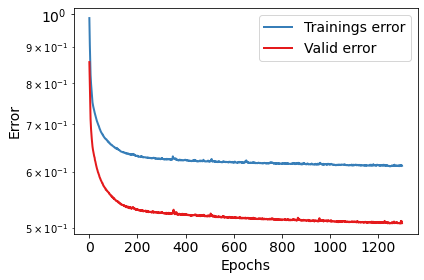

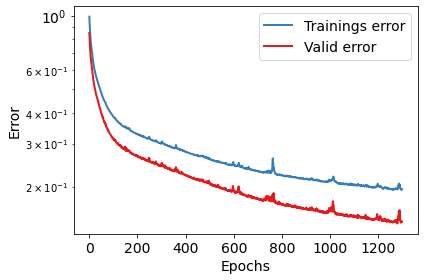

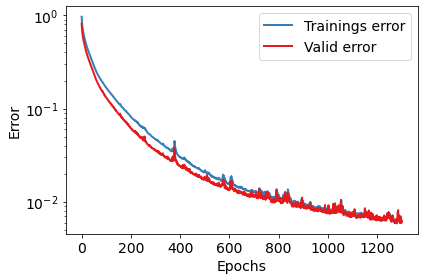

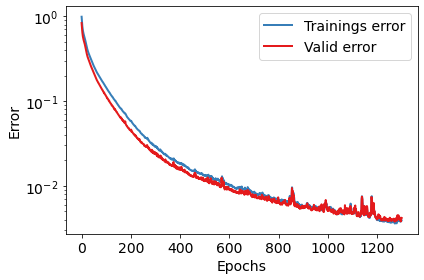

In [ ]:
def ADS(sensor_number,bottle_neck):
  sensor_number = sensor_number
  gtrain_out, gvalid_out, strain_DS, svalid_DS, gtest_stan, stest_DS, gstats, x_cord   = ADS_train_data(sensor_number,bottle_neck)
  del(gtest_stan,stest_DS)
  #print(gtrain_out,gtrain_out.shape)
  #print(gvalid_out,gvalid_out.shape)
  train = sensorgcdatasetDS(strain_DS, gtrain_out)
  valid = sensorgcdatasetDS(svalid_DS, gvalid_out)

  bs = 399  # batch size
  bsv = 133
  train_data_gen = torch.utils.data.DataLoader(train, shuffle=True, batch_size=bs)
  valid_data_gen = torch.utils.data.DataLoader(valid, batch_size=bsv)
  dataloaders = {'train': train_data_gen, 'valid': valid_data_gen}
  dataset_sizes = {'train': len(train_data_gen.dataset), 'valid': len(valid_data_gen.dataset)}
  batch ={'train':bs, 'valid':bsv}

  # Setting up the neural network
  model = ADSnetwork(sensor_number,bottle_neck).to(device)

  # Loss and Optimizer
  criterion = nn.MSELoss(reduction='mean').to(device)
  #optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.001,  weight_decay=1e-5)
  #exp_lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[500], gamma=0.1)

  #phi = pd.read_csv('../preprocessed_data/basis.csv', header=None).to_numpy()
  #sensor_loc = pd.read_csv('../preprocessed_data/sensor_loc.csv', header=None).to_numpy().astype(int)

  num_epochs = 1300
  prev_loss = 100  # large number
  stop = 0
  rerror_train = []
  rerror_valid = []
  for epochs in range(num_epochs):

    for phase in ['train', 'valid']:
        running_loss = 0

        if phase == 'train':
            #exp_lr_scheduler.step()
            model.train()
        else:
            model.eval()

        for i, (sensor, gc) in enumerate(dataloaders[phase]):

            sensor = Variable(sensor).to(device)
            gc = Variable(gc).to(device)

            # clear gradients
            optimizer.zero_grad()
            # forward
            gc_out = model(sensor)
            # calculate loss
            loss = criterion(gc_out, gc)

            if phase == 'train':
                # backward
                loss.backward()
                # update weights
                optimizer.step()

            running_loss += gc_out.shape[0] * loss.data

        if phase == 'train':
            train_epoch_loss = running_loss / dataset_sizes[phase]
        elif phase == 'valid':
            valid_epoch_loss = running_loss / dataset_sizes[phase]
    stop = stop + 1
    if (train_epoch_loss < prev_loss):
        model_wts = model.state_dict()
        prev_loss = train_epoch_loss
        #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} *'.format(epochs, train_epoch_loss, valid_epoch_loss))
        stop = 0
    else:
        nothing = 0
        #print('({}) Training Loss: {:.8f} Valid Loss: {:.8f} '.format(epochs, train_epoch_loss, valid_epoch_loss))

    if stop == 200:
        print('Early stopping criteria fulfilled')
        break
    rerror_train.append(train_epoch_loss)
    rerror_valid.append(valid_epoch_loss)

  #plot_image(output_last, img_last, gstats)
  plot_graph(rerror_train,rerror_valid)
  torch.save(model_wts, '../content/drive/My Drive/Colab Notebooks/ADSweights_l_s{}_bn{}_D3'.format(sensor_number, bottle_neck))


for s in [1,2,5,10]:
  bn= 25
  ADS(s,bn)

50


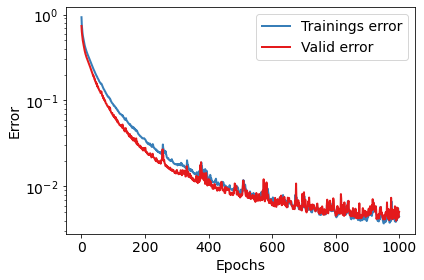

In [ ]:
for bn in [50]:#[5,15,25,50]:
  print(bn)
  s= 5
  ADS(s, bn)

## FR_ARE

In [ ]:
def FR_rnn(sensor_number,seq_len, bottle_neck ):
  pretrained_weightsRNN = '../content/drive/My Drive/Colab Notebooks/RNNv3_s{}_sq{}_bn{}_D3_weights'.format(sensor_number,seq_len, bottle_neck);

  sensor_number = sensor_number
  hidden_size = 50
  layers = 1
  seq_impct = int((seq_len-1)/2)

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord  = ARE_train_data(sensor_number, bottle_neck, seq_len)
  del(gtrain_out, gvalid_out, strain_in, svalid_in)
  # Setting up the neural network
  model = RNNv3network(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

  # Load saved neural network weights
  model.load_state_dict(torch.load(pretrained_weightsRNN))
  model.eval()

  # Load snapshots of sensor data and gc for testing
  test = sensorgcdatasetRNN(stest_in_stacked, gtest_stan)
  #test = sensorgcdatasetRNN(svalid_in, gvalid_out)
  test_data_genn = torch.utils.data.DataLoader(test, shuffle=False, batch_size=1)

  # predicting generalized coordinates from sensor data
  #err = []
  gc_pred = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = torch.zeros(seq_len,1, sensor_number)
      for j in range(0, seq_len):
          y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
      gc_out = model(y.to(device)).cpu().data.numpy()
      gc_pred[i, :] = gc_out
      #del(gc_out, y, sensor, gc)
      #err.append(np.linalg.norm(gc.numpy() - gc_pred[i, :]) ** 2 / gc_pred[i, :].size)  # /np.linalg.norm(gc) )
      #print(i)
  del(stest_in_stacked, gtest_stan)
  #print(gc_pred)
  #acc_avg = np.mean(err)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]

  pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_D3_bn{}_weights'.format(bottle_neck);

  trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  del(trainAE,validAE)

  model = autoencoder(bottle_neck).to(device)

  model.load_state_dict(torch.load(pretrained_weightsAE))
  model.eval()

  testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:399-seq_impct,:], statsAE)
  train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

  #err = []
  t_pred = np.zeros([len(test), len(testAE[0,:]) ])
  t_true = np.zeros([len(test), len(testAE[0,:]) ])
  #print('jijijij')
  for i, (gc_pre, t) in enumerate(train_data_genn):
      t_out_tensor = model(gc_pre[None, :].to(device))
      t_out = t_out_tensor.cpu().data.numpy()
      t_pred[i, :] = t_out
      t_true[i, :] = t
      #err.append(np.linalg.norm(t.numpy() - t_pred[i, :]) ** 2 / t_pred[i, :].size)
      #print(t_out_tensor.shape)
      if i == 260 or i ==340 or i ==380 or i ==200 or i==300:
         nothing = 0
         #plot_image(t_out_tensor[0], t, statsAE, x_cord)

  #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
  #print(error)

  t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
  t_true = t_true * statsAE[1, :] + statsAE[0, :]

  #acc_avg = np.mean(err)
  #print(acc_avg)
  #print(min(err))

  #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
  #print(error)

  Ferr = []
  for i in range(200,399-seq_impct*2):
      Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
  del(t_true,t_pred)
  Ferr_avg = np.mean(Ferr)
  #Terr_max = max(Terr)
  print("Error =",seq_len, Ferr_avg)
  #print("Max error =", Terr_max)
####################################

In [ ]:


def FR_rnn(sensor_number,seq_len, bottle_neck ):
  pretrained_weightsRNN = '../content/drive/My Drive/Colab Notebooks/RNNv3_s{}_sq{}_bn{}_D3_weights'.format(sensor_number,seq_len, bottle_neck);

  sensor_number = sensor_number
  hidden_size = 50
  layers = 1
  seq_impct = int((seq_len-1)/2)

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord  = ARE_train_data(sensor_number, bottle_neck, seq_len)
  del(gtrain_out, gvalid_out, strain_in, svalid_in)
  # Setting up the neural network
  model = RNNv3network(hidden_size, sensor_number, bottle_neck, layers, seq_len).to(device)

  # Load saved neural network weights
  model.load_state_dict(torch.load(pretrained_weightsRNN))
  model.eval()

  # Load snapshots of sensor data and gc for testing
  test = sensorgcdatasetRNN(stest_in_stacked, gtest_stan)
  #test = sensorgcdatasetRNN(svalid_in, gvalid_out)
  test_data_genn = torch.utils.data.DataLoader(test, shuffle=False, batch_size=1)

  # predicting generalized coordinates from sensor data
  #err = []
  gc_pred = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = torch.zeros(seq_len,1, sensor_number)
      for j in range(0, seq_len):
          y[j,0, :] = sensor[sensor_number*j : (sensor_number*j + sensor_number)]
      gc_out = model(y.to(device)).cpu().data.numpy()
      gc_pred[i, :] = gc_out
      #del(gc_out, y, sensor, gc)
      #err.append(np.linalg.norm(gc.numpy() - gc_pred[i, :]) ** 2 / gc_pred[i, :].size)  # /np.linalg.norm(gc) )
      #print(i)
  del(stest_in_stacked, gtest_stan)
  #print(gc_pred)
  #acc_avg = np.mean(err)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]

  pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_D3_bn{}_weights'.format(bottle_neck);

  trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  del(trainAE,validAE)

  model = autoencoder(bottle_neck).to(device)

  model.load_state_dict(torch.load(pretrained_weightsAE))
  model.eval()

  testAA = sensorgcdatasetAA(gc_pred, testAE[seq_impct:399-seq_impct,:], statsAE)
  train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

  #err = []
  t_pred = np.zeros([len(test), len(testAE[0,:]) ])
  t_true = np.zeros([len(test), len(testAE[0,:]) ])
  #print('jijijij')
  for i, (gc_pre, t) in enumerate(train_data_genn):
      t_out_tensor = model(gc_pre[None, :].to(device))
      t_out = t_out_tensor.cpu().data.numpy()
      t_pred[i, :] = t_out
      t_true[i, :] = t
      #err.append(np.linalg.norm(t.numpy() - t_pred[i, :]) ** 2 / t_pred[i, :].size)
      #print(t_out_tensor.shape)
      if s == 1 or s == 2:
        if i == 270-seq_impct or i ==330-seq_impct or i ==380-seq_impct:
          nothing = 0
          plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_RNNv3_s{}_sq{}_i{}_D3'.format(sensor_number,seq_len,i+seq_impct), save = 0,save2  =0, name2 = 'im_RNNv3_true_s{}_sq{}_i{}_D3'.format(sensor_number,seq_len,i+seq_impct) )
      if seq_len == 11:
        if i == 340- seq_impct:
          nothing = 0
          #plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_RNNv3_s{}_sq{}_D3'.format(sensor_number,seq_len), save = 1)

  #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
  #print(error)

  t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
  t_true = t_true * statsAE[1, :] + statsAE[0, :]

  #acc_avg = np.mean(err)
  #print(acc_avg)
  #print(min(err))

  #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
  #print(error)

  Ferr = []
  for i in range(200,399-seq_impct*2):
      Ferr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
  del(t_true,t_pred)
  Ferr_avg = np.mean(Ferr)
  #Terr_max = max(Terr)
  print("Error =",seq_len, Ferr_avg)
  #print("Max error =", Terr_max)
#######################################################$$$$$$$$$$$$$%%%%)



#for s in [1,2]:#[1,2,5,10]:
#  print(s)
#  FR_rnn(s)
for s in [1,2]:#,5,10]:
  for seq_len in [3,7,11,15]:
    bn = 25
    FR_rnn(s,seq_len,bn)

## FR_ADS

In [ ]:

def FR_ADS(sensor_number, bottle_neck):
  pretrained_weights_ds = '../content/drive/My Drive/Colab Notebooks/ADSweights_l_s{}_bn{}_D3'.format(sensor_number, bottle_neck);  
  #pretrained_weights_ds = '../content/drive/My Drive/Colab Notebooks/ADSweights_s{}_D3'.format(sensor_number);  

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord  = ADS_train_data(sensor_number , bottle_neck)
  del(gtrain_out, gvalid_out, strain_in, svalid_in)
  # Setting up the neural network
  model = ADSnetwork(sensor_number,bottle_neck)

  # Load saved neural network weights
  model.load_state_dict(torch.load(pretrained_weights_ds))
  model.eval()

  # Load snapshots of sensor data and gc for testing
  test = sensorgcdatasetDS(stest_in_stacked, gtest_stan)

  #err = []
  gc_pred = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = model(sensor)
      gc_out = y.data.numpy()
      gc_pred[i, :] = gc_out
      #err.append(np.linalg.norm(gc.numpy() - gc_pred[i, :]) ** 2 / gc_pred[i, :].size)  # /np.linalg.norm(gc) )
  #del(stest_in_stacked, gtest_stan)
  #print(gc_pred)
  #acc_avg = np.mean(err)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]
  #gc_pred = gtest_stan * gstats[1, :] + gstats[0, :]


  pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_D3_bn{}_weights'.format(bottle_neck);

  trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  del(trainAE,validAE)
  model = autoencoder(bottle_neck)

  model.load_state_dict(torch.load(pretrained_weightsAE))
  model.eval()

  testAA = sensorgcdatasetAA(gc_pred, testAE[:,:], statsAE)
  train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

  t_pred = np.zeros([len(test), len(testAE[0,:])])
  t_true = np.zeros([len(test), len(testAE[0,:])])
  print('jijijij')

  for i, (gc_pre, t) in enumerate(train_data_genn):
      t_out_tensor = model(gc_pre[None, :])
      t_out = t_out_tensor.data.numpy()
      t_pred[i, :] = t_out
      t_true[i, :] = t
      #print(t_out_tensor.shape)
      if i == 260 or i ==340 or i ==380 or i ==200 or i==300:
        nothing = 0
        #plot_image(t_out_tensor, t, statsAE, x_cord)

  t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
  t_true = t_true * statsAE[1, :] + statsAE[0, :]

  Err = []
  for i in range(200,399):
      Err.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
  del(t_true,t_pred)
  Err_avg = np.mean(Err)
  print("Error ",sensor_number,'=', Err_avg)

In [ ]:

def FR_ADS(sensor_number, bottle_neck):
  pretrained_weights_ds = '../content/drive/My Drive/Colab Notebooks/ADSweights_l_s{}_bn{}_D3'.format(sensor_number, bottle_neck);  
  #pretrained_weights_ds = '../content/drive/My Drive/Colab Notebooks/ADSweights_s{}_D3'.format(sensor_number);  

  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord  = ADS_train_data(sensor_number , bottle_neck)
  del(gtrain_out, gvalid_out, strain_in, svalid_in)
  # Setting up the neural network
  model = ADSnetwork(sensor_number,bottle_neck)

  # Load saved neural network weights
  model.load_state_dict(torch.load(pretrained_weights_ds))
  model.eval()

  # Load snapshots of sensor data and gc for testing
  test = sensorgcdatasetDS(stest_in_stacked, gtest_stan)

  #err = []
  gc_pred = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = model(sensor)
      gc_out = y.data.numpy()
      gc_pred[i, :] = gc_out
      #err.append(np.linalg.norm(gc.numpy() - gc_pred[i, :]) ** 2 / gc_pred[i, :].size)  # /np.linalg.norm(gc) )
  #del(stest_in_stacked, gtest_stan)
  #print(gc_pred)
  #acc_avg = np.mean(err)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]
  #gc_pred = gtest_stan * gstats[1, :] + gstats[0, :]


  pretrained_weightsAE = '../content/drive/My Drive/Colab Notebooks/nnv2_D3_bn{}_weights'.format(bottle_neck);

  trainAE, validAE, testAE, statsAE = autoencoder_train_data()
  del(trainAE,validAE)
  model = autoencoder(bottle_neck)

  model.load_state_dict(torch.load(pretrained_weightsAE))
  model.eval()

  testAA = sensorgcdatasetAA(gc_pred, testAE[:,:], statsAE)
  train_data_genn = torch.utils.data.DataLoader(testAA, shuffle=False, batch_size=1)

  t_pred = np.zeros([len(test), len(testAE[0,:])])
  t_true = np.zeros([len(test), len(testAE[0,:])])
  print('jijijij')

  for i, (gc_pre, t) in enumerate(train_data_genn):
      t_out_tensor = model(gc_pre[None, :])
      t_out = t_out_tensor.data.numpy()
      t_pred[i, :] = t_out
      t_true[i, :] = t
      #print(t_out_tensor.shape)
      if i == 335 :
        nothing = 0
        plot_image(t_out_tensor[0], t, statsAE, x_cord, name = 'im_ADSv3_s{}_D3.eps'.format(sensor_number), save = 1)

  t_pred = t_pred * statsAE[1, :] + statsAE[0, :]
  t_true = t_true * statsAE[1, :] + statsAE[0, :]

  Err = []
  for i in range(200,399):
      Err.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))
  del(t_true,t_pred)
  Err_avg = np.mean(Err)
  print("Error ",sensor_number,'=', Err_avg)
#def FR_PDS(s): 
#def FR_shallow(s):
for s in [1,2,5,10]:
  bn = 25
  FR_ADS(s,bn) 

## FR_PDS

In [ ]:
def FR_PDS(sensor_number, bottle_neck):

  pretrained_weights = osp.join(folder, 'PDSweights_s{}_bn{}_D3'.format(sensor_number, bottle_neck))
  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord,phi,mean   = PDS_train_data(sensor_number,bottle_neck)
  del(gtrain_out, gvalid_out, strain_in, svalid_in)
  # Setting up the neural network
  modell = PDSnetwork(sensor_number, bottle_neck)

  # Load saved neural network weights
  modell.load_state_dict(torch.load(pretrained_weights))
  modell.eval()

  # Load snapshots of sensor data and gc for testing
  test = sensorgcdatasetDS(stest_in_stacked, gtest_stan)
  #print(stest_in_stacked.shape)
  #print( gtest_stan.shape)

  gc_pred = np.zeros([len(test), bottle_neck])
  gc_pod = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = modell(sensor)
      gc_out = y.data.numpy()
      gc_pred[i, :] = gc_out
      gcc = gc.data.numpy()
      gc_pod[i, :] = gcc

  #print(gc_pred)
  #acc_avg = np.mean(err)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]
  gc_pod = gc_pod*gstats[1, :] + gstats[0, :]

  trainAE, validAE, testAE, stats = autoencoder_train_data()
  #mean = np.mean(trainAE, axis = 0)
  #X = trainAE - mean
  #X = X.transpose()
  #phi, s, V = np.linalg.svd(X,full_matrices=False)
  del(trainAE,validAE)
  #phi = phi[:,0:bottle_neck]

  t_pred = gc_pred.dot(phi.T) 
  t_true = testAE - mean#np.mean(total[:,:].transpose(), axis = 1)

  t_pred = gc_pred.dot(phi.T) + mean#np.mean(total[:,:].transpose(), axis = 1)
  t_pod = gc_pod.dot(phi.T) + mean#np.mean(total[:,:].transpose(), axis = 1)
  t_true = testAE

  #gc_pod = gtest_out*gstats[1, :] + gstats[0, :]
  #t_pred = gc_pod.dot(phi.T) + mean
  #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
  #print(error)

  #plot_image(t_pred,t_true, stats)


  Terr = []
  for i in range(200,399):
      Terr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

  Terr_avg = np.mean(Terr)
  print("Error",sensor_number, Terr_avg)

  #nx=299 ny=502 ns = nx*ny
  m,n = mn()
  ny = m
  nx = n
  x2 = np.arange(0, ny, 1)
  y2 = np.arange(0, nx, 1)
  mX, mY = np.meshgrid(x2, y2)


  del(t_pred,t_pod,t_true)

In [ ]:




import torch
import torch.nn as nn




def FR_PDS(sensor_number, bottle_neck): 
  #pretrained_weightsRNN = '../content/drive/My Drive/Colab Notebooks/PDSweights_s{}_D3'.format(sensor_number);
  pretrained_weights = osp.join(folder, 'PDSweights_l_s{}_bn{}_D3'.format(sensor_number, bottle_neck))
  gtrain_out, gvalid_out, strain_in, svalid_in, gtest_stan, stest_in_stacked, gstats, x_cord,phi,mean   = PDS_train_data(sensor_number,bottle_neck)
  del(gtrain_out, gvalid_out, strain_in, svalid_in)
  # Setting up the neural network
  modell = PDSnetwork(sensor_number, bottle_neck)

  # Load saved neural network weights
  modell.load_state_dict(torch.load(pretrained_weightsRNN))
  modell.eval()

  # Load snapshots of sensor data and gc for testing
  test = sensorgcdatasetDS(stest_in_stacked, gtest_stan)
  #print(stest_in_stacked.shape)
  #print( gtest_stan.shape)

  gc_pred = np.zeros([len(test), bottle_neck])
  gc_pod = np.zeros([len(test), bottle_neck])
  for i, (sensor, gc) in enumerate(test):
      y = modell(sensor)
      gc_out = y.data.numpy()
      gc_pred[i, :] = gc_out
      gcc = gc.data.numpy()
      gc_pod[i, :] = gcc

  #print(gc_pred)
  #acc_avg = np.mean(err)
  gc_pred = gc_pred * gstats[1, :] + gstats[0, :]
  gc_pod = gc_pod*gstats[1, :] + gstats[0, :]

  trainAE, validAE, testAE, stats = autoencoder_train_data()
  #mean = np.mean(trainAE, axis = 0)
  #X = trainAE - mean
  #X = X.transpose()
  #phi, s, V = np.linalg.svd(X,full_matrices=False)
  del(trainAE,validAE)
  #phi = phi[:,0:bottle_neck]

  t_pred = gc_pred.dot(phi.T) 
  t_true = testAE - mean#np.mean(total[:,:].transpose(), axis = 1)

  t_pred = gc_pred.dot(phi.T) + mean#np.mean(total[:,:].transpose(), axis = 1)
  t_pod = gc_pod.dot(phi.T) + mean#np.mean(total[:,:].transpose(), axis = 1)
  t_true = testAE

  #gc_pod = gtest_out*gstats[1, :] + gstats[0, :]
  #t_pred = gc_pod.dot(phi.T) + mean
  #error = np.linalg.norm(t_true - t_pred) / np.linalg.norm(t_true)
  #print(error)

  #plot_image(t_pred,t_true, stats)


  Terr = []
  for i in range(200,399):
      Terr.append(np.linalg.norm(t_true[i,:] - t_pred[i,:]) / np.linalg.norm(t_true[i,:]))

  Terr_avg = np.mean(Terr)
  print("Error",sensor_number, Terr_avg)

  #nx=299 ny=502 ns = nx*ny
  m,n = mn()
  ny = m
  nx = n
  x2 = np.arange(0, ny, 1)
  y2 = np.arange(0, nx, 1)
  mX, mY = np.meshgrid(x2, y2)

  for i in [350]:
    #print(i)
    t_predd = t_pred[i,:].reshape((ny, nx))
    minmax = np.max(np.abs(t_predd)) * 0.65
    plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    im = plt.imshow(t_predd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    plt.contourf(mX, mY, t_predd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    plt.scatter(x_cord[:,0], x_cord[:,1], marker='.', color='#ff7f00', s=500, zorder=5)
    save =1
    if save ==1:
      im_name = 'im_PDS_s{}_D3.eps'.format(sensor_number)
      # savefig(fname, dpi=None, facecolor='w', edgecolor='w',
      #   orientation='portrait', papertype=None, format='eps',
      #   transparent=False, bbox_inches=None, pad_inches=0.1,
      #   frameon=None, metadata=None)
      # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4/tr/{}'.format(im_name),format='eps')
      # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/tr/{}'.format(im_name))

    # plt.show()

    #plt.pcolormesh(t_predd.T, cmap=plt.cm.jet, vmin=-0.0003, vmax=0.0003)
    #plt.pcolormesh(t_predd.T)
    #plt.show()
    #********************************************************
    # t_podd = t_pod[i,:].reshape((ny, nx))
    # minmax = np.max(np.abs(t_podd)) * 0.65
    # plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    # im = plt.imshow(t_podd.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    # plt.contourf(mX, mY, t_podd.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    # plt.show()
    #********************************************************  
    t_truee = t_true[i,:].reshape((ny, nx))
    minmax = np.max(np.abs(t_truee)) * 0.65
    plt.figure(facecolor="white",  edgecolor='k', figsize=(7.9,4.7))
    im = plt.imshow(t_truee.T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    plt.contourf(mX, mY, t_truee.T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax+3, vmax=minmax-3)
    if s == 2:
      im_name = 'im_true_350_D3.eps'
      # plt.savefig('../content/drive/My Drive/Colab Notebooks/results4/tr/{}'.format(im_name), format='eps')
      # print('SAVED -','../content/drive/My Drive/Colab Notebooks/results4/{}'.format(im_name))
    # plt.show()
  del(t_pred,t_pod,t_true)
  return Terr_avg

# for s in [2]:
#   bn = 25
#   FR_PDS(s, bn) 


noise_error = np.zeros((3, 1, 25))
for s, i in [[1, 0], [2, 1], [5, 2]]:
    for bn in [25]:
      for SNR in range(0,100,4):
        print('no. of sensors',s,'SNR',SNR)
        aaa = FR_PDS(s,bn,drop=1,SNR=SNR)
        noise_error[i, 0, int(SNR/4)] = aaa[0]
np.savetxt(osp.join(path2, "noise_error_s_1_PDS_{}.csv".format(args.RNN)), noise_error[0], delimiter=",")
np.savetxt(osp.join(path2, "noise_error_s_2_PDS_{}.csv".format(args.RNN)), noise_error[1], delimiter=",")
np.savetxt(osp.join(path2, "noise_error_s_5_PDS_{}.csv".format(args.RNN)), noise_error[2], delimiter=",")